# Run run_peat_TCZE_REF_TSNB_REF

TCZERO bug corrected (over the snow-free fraction; https://gitlab.com/cccma/classic/-/issues/119), but the harmonic mean thermal conductivity in the first top soil layer with the snow is kept over the snow fraction. TSNBOT is a height-weighted average between the temperature of the snow and the first soil layer.

- **TCZERO** ([soilHeatFluxPrep.f90](https://gitlab.com/cccma/classic/-/blob/master/src/soilHeatFluxPrep.f90?ref_type=heads#L124))

```
  if (ZSNOW(I) > 0.0) then
    TCZERO = 1.0 / (0.5 / TCSNOW(I) + 0.5 / TCTOP(I,1))
  else
    TCZERO = TCTOP(I,1)
  end if
```

- **TSNBOT** ([snowTempUpdate.f90](https://gitlab.com/cccma/classic/-/blob/master/src/snowTempUpdate.f90?ref_type=heads#L139))

```
      TSNBOT(I) = (ZSNOW(I) * TSNOW(I) + DELZ(1) * TBAR(I,1)) / &
                  (ZSNOW(I) + DELZ(1))

```


In [1]:
# Env: sc2_v0
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import proplot as pplt # New plot library (https://proplot.readthedocs.io/en/latest/)
pplt.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy import stats
import calendar
import os

In [2]:
site = 'byl'
site_longname = 'Bylot Island, Canadian high Arctic'
y_start = 2013
y_end = 2019

# labels = ['peat_30min_ext', 'peat']
labels = ['peat_TCZE_REF_TSNB_REF']

root_path = '/home/lalandmi/eccc/classic-develop/outputFiles/SnowArctic/'+site+'/'
paths = [root_path+'run_'+label for label in labels]

# ds_yr_list = [xr.open_mfdataset(path+'/*_annually.nc').squeeze().load() for path in paths]
# ds_mo_list = [xr.open_mfdataset(path+'/*_monthly.nc').squeeze().load() for path in paths]
ds_d_list = [xr.open_mfdataset(path+'/*_daily.nc').squeeze().load() for path in paths]
ds_hh_list = [xr.open_mfdataset(path+'/*_halfhourly.nc').squeeze().load() for path in paths]

In [3]:
path = "/home/lalandmi/eccc/classic-develop/inputFiles/SnowArctic/"+site
rsfile = xr.open_dataset(path+'/rsfile_spinup-final_Ref.nc')

In [4]:
def assign_center_depth(ds, rsfile):
    layer_c = []
    for i in range(len(rsfile.DELZ)):
        if i == 0:
            layer_c.append(rsfile.DELZ.cumsum().values[i]/2)
        else:
            layer_c.append(rsfile.DELZ.cumsum().values[i-1] + rsfile.DELZ.values[i]/2)
    with xr.set_options(keep_attrs=True):
        ds = ds.assign_coords(layer=ds.layer*0+layer_c)
    return ds

In [5]:
for i in range(len(labels)):
    # ds_yr_list[i] = assign_center_depth(ds_yr_list[i], rsfile)
    # ds_mo_list[i] = assign_center_depth(ds_mo_list[i], rsfile)
    ds_d_list[i] = assign_center_depth(ds_d_list[i], rsfile)
    ds_hh_list[i] = assign_center_depth(ds_hh_list[i], rsfile)

Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic')

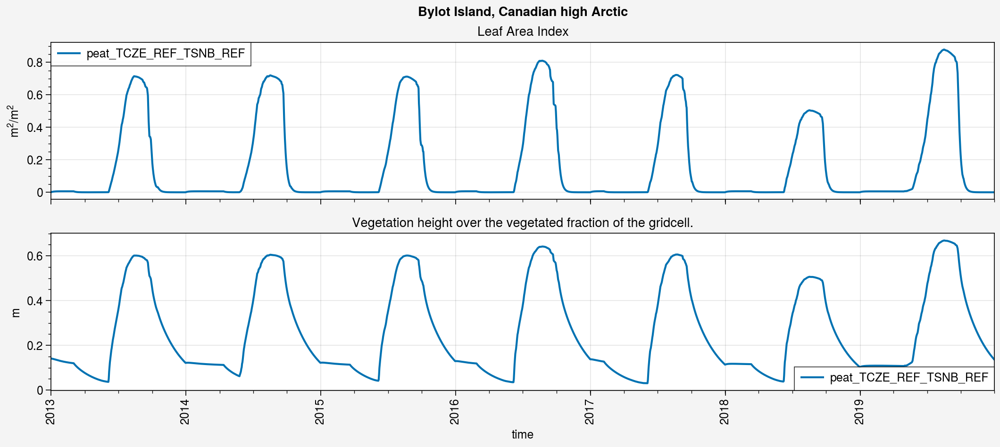

In [6]:
fig, axs = pplt.subplots(ncols=1, nrows=2, refaspect=6, refwidth=10, sharey=0)

for ds_d, label in zip(ds_d_list, labels):
    axs[0].plot(ds_d.lai, label=label)
    axs[1].plot(ds_d.vegHeight, label=label)

axs[0].format(ylabel=ds_d_list[0].lai.units, title=ds_d_list[0].lai.long_name)
axs[1].format(ylabel=ds_d_list[0].vegHeight.units, title=ds_d_list[0].vegHeight.long_name)

for ax in axs:
    ax.legend()

fig.suptitle(site_longname)

Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic (2013-2019)')

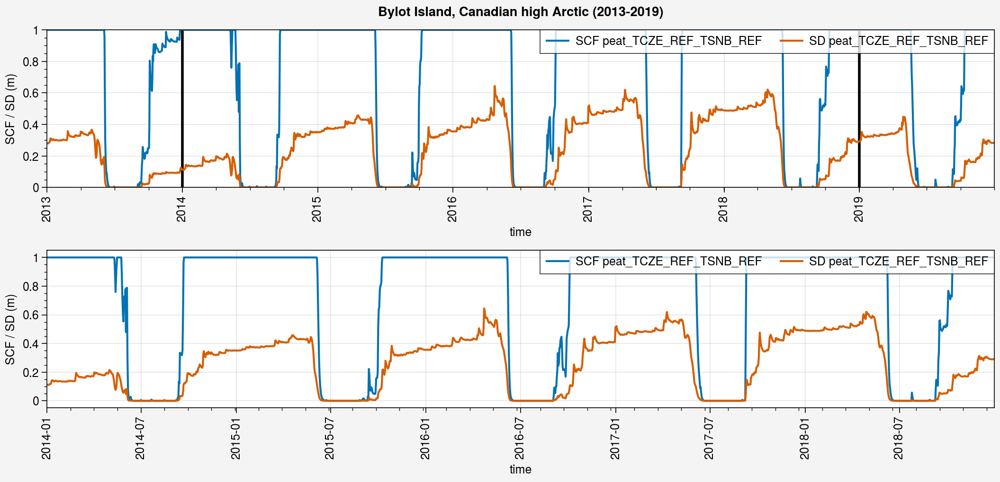

In [7]:
if len(labels) > 1:
    nrows = 3
else: 
    nrows = 2
    
fig, axs = pplt.subplots(ncols=1, nrows=nrows, refaspect=6, refwidth=10, share=0)

##################
### All period ###
##################
start = str(y_start)
end = str(y_end)

for ds_d, label in zip(ds_d_list, labels):
    axs[0].plot(ds_d.snc.sel(time=slice(start,end)), label='SCF '+label)
    axs[0].plot(ds_d.snd.sel(time=slice(start,end)), label='SD '+label)

axs[0].legend(ncols=2, loc='ur')
axs[0].format(
    ylabel='SCF / SD (m)'
)


############
### Zoom ###
############
start = str(y_start+1)
end = str(y_end-1)

for ds_d, label in zip(ds_d_list, labels):
    axs[1].plot(ds_d.snc.sel(time=slice(start,end)), label='SCF '+label)
    axs[1].plot(ds_d.snd.sel(time=slice(start,end)), label='SD '+label)

axs[0].vlines(ds_d_list[0].sel(time=slice(start,end)).time[0], ds_d_list[0].snc.min(), ds_d_list[0].snc.max(), color='k', lw=2)
axs[0].vlines(ds_d_list[0].sel(time=slice(start,end)).time[-1], ds_d_list[0].snc.min(), ds_d_list[0].snc.max(), color='k', lw=2)

axs[1].legend(ncols=2, loc='ur')
axs[1].format(
    ylabel='SCF / SD (m)'
)

if nrows == 3:
    #####################
    ### SWE / SD diff ###
    #####################
    axs[2].plot((ds_d_list[0]-ds_d_list[0]).snd.sel(time=slice(start,end)), label='SD ('+labels[1]+' - '+labels[0]+')')
    axs[2].plot(((ds_d_list[0]-ds_d_list[0]).snw*1e-3).sel(time=slice(start,end)), label='SWE ('+labels[1]+' - '+labels[0]+')')
    
    axs[2].legend(ncols=2)
    axs[2].format(
        ylabel='SD / SWE (m)'
    )

fig.suptitle(site_longname+' ('+str(y_start)+'-'+str(y_end)+')')


## Compare with obs

In [9]:
path_obs = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all/Bylot'

ds_h_obs = xr.open_dataset(path_obs+'/obs_insitu_'+site+'_'+str(y_start)+'_'+str(y_end)+'.nc').load()
ds_h_obs['albs'] = ds_h_obs.albs.where(ds_h_obs.flag_albs_ERA5 == 0).where(ds_h_obs.albs < 1) # to avoid > 1 albedo values
ds_d_obs = ds_h_obs.resample(time='D').mean().load()
ds_h_met = xr.open_dataset(path_obs+'/met_insitu_'+site+'_'+str(y_start)+'_'+str(y_end)+'.nc').load()

ds_h_obs

<xarray.Dataset> Size: 10MB
Dimensions:         (time: 52202, sdepth: 5, sheight: 10)
Coordinates:
  * time            (time) datetime64[ns] 418kB 2013-07-11T09:00:00 ... 2019-...
  * sdepth          (sdepth) float64 40B 0.02 0.05 0.1 0.15 0.21
  * sheight         (sheight) float64 80B 0.0 0.02 0.05 0.07 ... 0.27 0.35 0.37
Data variables:
    snd_auto        (time) float64 418kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    albs            (time) float64 418kB 0.16 0.15 0.17 0.16 ... 0.17 0.16 0.16
    flag_albs_ERA5  (time) int64 418kB 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    ts              (time) float64 418kB 9.86 10.42 13.45 ... 10.71 14.89 nan
    mrsll           (sdepth, time) float64 2MB 0.2 0.2 0.2 ... 0.066 0.066 0.066
    tsl             (sdepth, time) float64 2MB 3.7 4.3 4.99 ... -0.3 -0.3 -0.3
    tsnl            (sheight, time) float64 4MB nan nan nan nan ... nan nan nan
Attributes:
    reference:    Domine, F., Lackner, G., Sarrazin, D., Poirier, M., & Belke...
    description:  Converted to netCDF (SnowMIP kind of format) from original ...

<a list of 1 Line2D objects>

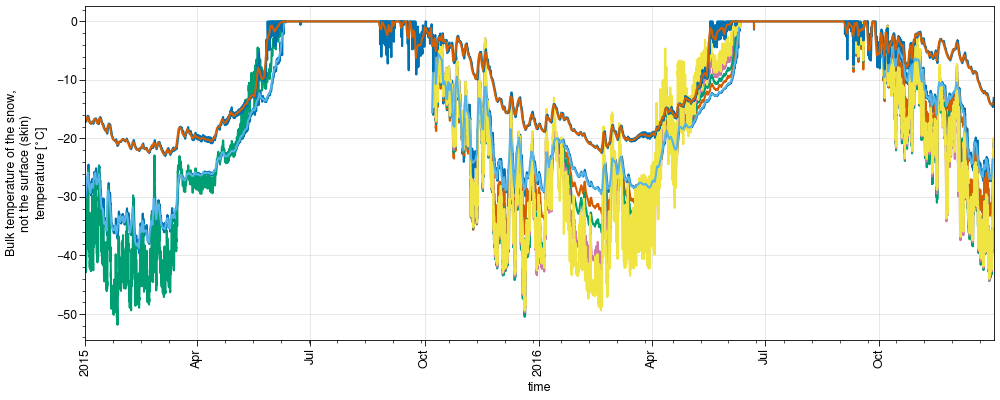

In [17]:
%matplotlib widget
# fig, axs = pplt.subplots(refwidth=10, refaspect=3)
period = slice('2015', '2016')

fig, axs = pplt.subplots(figsize=(10,4))

ds_h_obs.sel(time=period).tsnl.sel(sheight=0.02).plot()
ds_h_obs.sel(time=period).tsnl.sel(sheight=0.07).plot()
ds_h_obs.sel(time=period).tsnl.sel(sheight=0.17).plot()
ds_h_obs.sel(time=period).tsnl.sel(sheight=0.27).plot()
ds_h_obs.sel(time=period).tsnl.sel(sheight=0.37).plot()
ds_d_obs.sel(time=period).tsnl.sel(sheight=0.02).plot()

ds_hh_list[0].sel(time=period).tsn.plot()
ds_d_list[0].sel(time=period).tsn.plot()
# ds_d_list[0].sel(time=period).tsnbot.plot()

# ds_d_list[0].sel(time=period).tsl.plot()
# ds_d_list[0].sel(time=period).tsl.sel(layer=0.05).plot()



<a list of 1 Line2D objects>

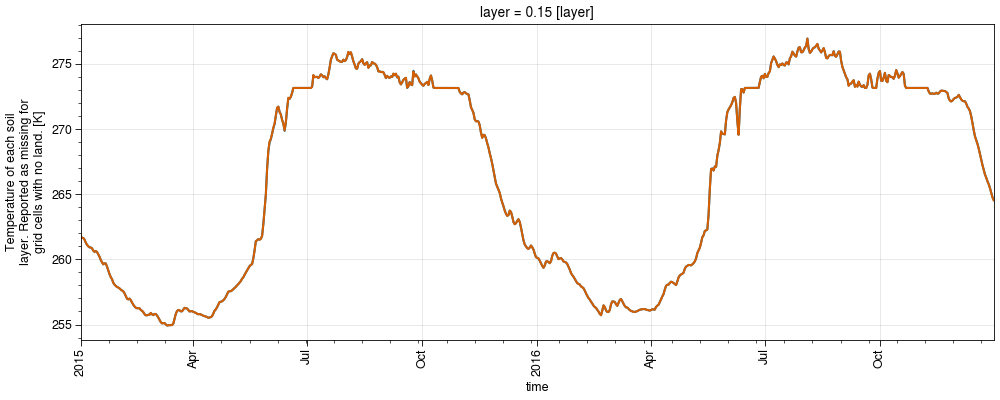

In [22]:
%matplotlib widget
# fig, axs = pplt.subplots(refwidth=10, refaspect=3)
period = slice('2015', '2016')

fig, axs = pplt.subplots(figsize=(10,4))

# ds_d_list[0].sel(time=period).tsl.plot()
ds_d_list[0].sel(time=period).tsl.sel(layer=0.15, method='nearest').plot()
ds_hh_list[0].sel(time=period).tsl.sel(layer=0.15, method='nearest').resample(time='d').mean().plot()



<a list of 1 Line2D objects>

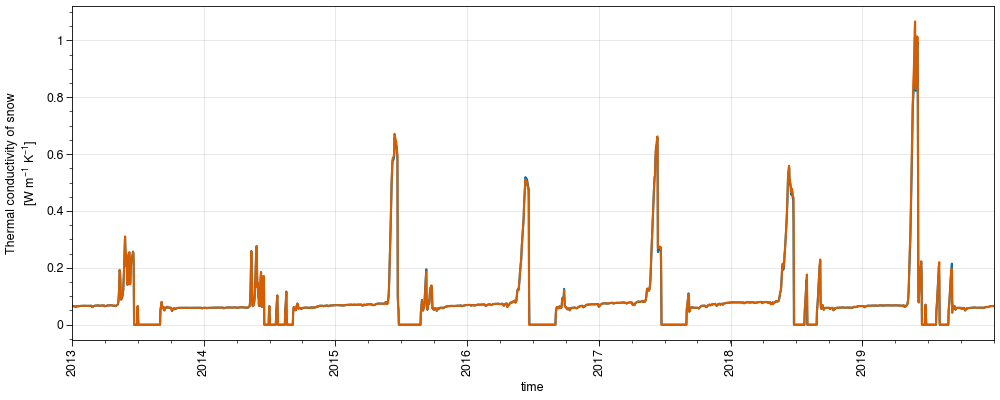

In [27]:
%matplotlib widget
# fig, axs = pplt.subplots(refwidth=10, refaspect=3)
# period = slice('2015', '2016')

fig, axs = pplt.subplots(figsize=(10,4))

# ds_d_list[0].sel(time=period).tsl.plot()
ds_d_list[0].tcsnow.plot()
ds_hh_list[0].tcsnow.resample(time='d').mean().plot()



<a list of 1 Line2D objects>

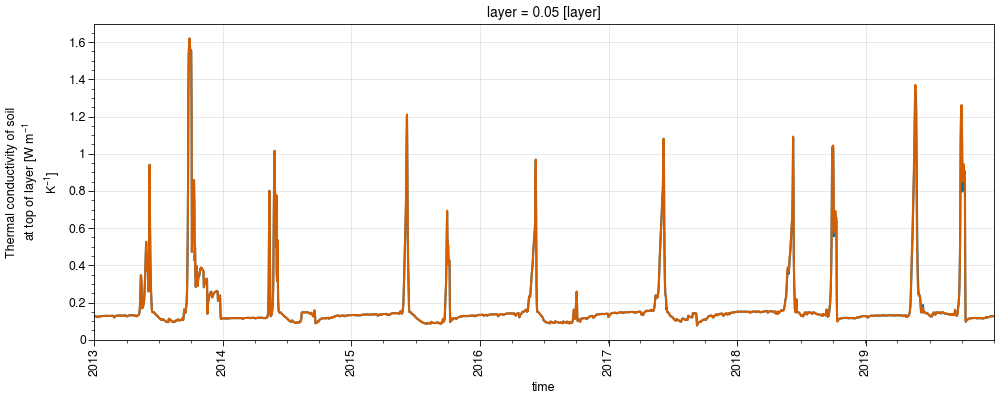

In [29]:
%matplotlib widget
# fig, axs = pplt.subplots(refwidth=10, refaspect=3)
# period = slice('2015', '2016')

fig, axs = pplt.subplots(figsize=(10,4))

# ds_d_list[0].sel(time=period).tsl.plot()
ds_d_list[0].tctop.sel(layer=0.05, method='nearest').plot()
ds_hh_list[0].tctop.sel(layer=0.05, method='nearest').resample(time='d').mean().plot()



### Get thermal conductivities

In [10]:
path_obs = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all'
df = pd.read_csv(path_obs+'/Bylot/Bylot_validation_snow_soil_thermal_conductivity.csv', sep=';', parse_dates=['date'], index_col=['date'])
df

,SNOW 22 cm,SNOW 12 cm,SNOW 2 cm,SOIL -10 cm,SNOW 7 cm
date,,,,,
2013-07-12,NaN,NaN,NaN,0.686033,NaN
2013-07-14,NaN,NaN,NaN,0.681628,NaN
2013-07-16,NaN,NaN,NaN,0.700266,NaN
2013-07-18,NaN,NaN,NaN,0.680094,NaN
2013-07-20,NaN,NaN,NaN,0.696302,NaN
...,...,...,...,...,...
2019-06-16,NaN,NaN,NaN,0.905965,NaN
2019-06-18,NaN,NaN,NaN,0.821669,NaN
2019-06-20,NaN,NaN,NaN,0.916831,NaN


In [11]:
ds_obs_tc = df.to_xarray()
ds_obs_tc = ds_obs_tc.rename({'date': 'time'})

ds_obs_tc = ds_obs_tc.assign_coords(sheight=[0.02 , 0.12, 0.22]) 
ds_obs_tc['sheight'].attrs['long_name'] = 'height in snow'
ds_obs_tc['sheight'].attrs['units'] = 'm'

# Combine the Snow Temp. in one variable
ds_obs_tc = ds_obs_tc.assign(
    tcs=(('sheight', 'time'), [
        list(ds_obs_tc['SNOW 2 cm'].values),
        list(ds_obs_tc['SNOW 12 cm'].values),
        list(ds_obs_tc['SNOW 22 cm'].values),
    ])
)
ds_obs_tc['tcs'].attrs['long_name'] = 'Thermal conductivity of snow'
ds_obs_tc['tcs'].attrs['units'] = 'W m$^{-1}$ K$^{-1}$'


ds_obs_tc = ds_obs_tc.assign_coords(sdepth=[0.10]) 
ds_obs_tc['sdepth'].attrs['long_name'] = 'depth in soil'
ds_obs_tc['sdepth'].attrs['units'] = 'm'

ds_obs_tc = ds_obs_tc.assign(
    tc=(('sdepth', 'time'), [
        list(ds_obs_tc['SOIL -10 cm'].values),
    ])
)
ds_obs_tc['tc'].attrs['long_name'] = 'Thermal conductivity of soil'
ds_obs_tc['tc'].attrs['units'] = 'W m$^{-1}$ K$^{-1}$'

ds_obs_tc = ds_obs_tc.drop_vars({'SNOW 2 cm', 'SNOW 7 cm', 'SNOW 12 cm', 'SNOW 22 cm', 'SOIL -10 cm'})

ds_obs_tc

<xarray.Dataset> Size: 44kB
Dimensions:  (time: 1090, sheight: 3, sdepth: 1)
Coordinates:
  * time     (time) datetime64[ns] 9kB 2013-07-12 2013-07-14 ... 2019-06-24
  * sheight  (sheight) float64 24B 0.02 0.12 0.22
  * sdepth   (sdepth) float64 8B 0.1
Data variables:
    tcs      (sheight, time) float64 26kB nan nan nan nan ... nan nan nan nan
    tc       (sdepth, time) float64 9kB 0.686 0.6816 0.7003 ... 0.8086 0.7879

<a list of 1 Line2D objects>

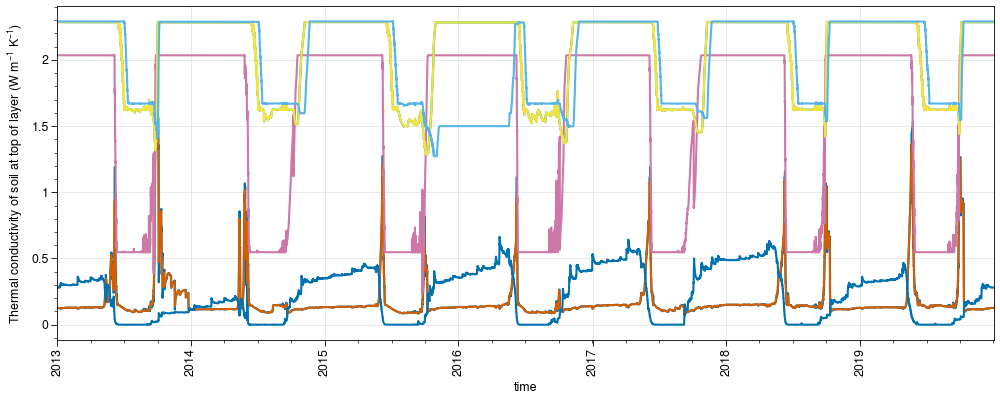

In [12]:
%matplotlib widget
# fig, axs = pplt.subplots(refwidth=10, refaspect=3)
fig, axs = pplt.subplots(figsize=(10,4))

ax = axs[0]
ax.plot(ds_hh_list[0].tctop.isel(layer=0))
ax.plot(ds_hh_list[0].tctop.resample(time='D').mean().isel(layer=0))
ax.plot(ds_hh_list[0].tctop.isel(layer=1))
ax.plot(ds_hh_list[0].tcbot.isel(layer=0))
ax.plot(ds_hh_list[0].tcbot.isel(layer=1))
ax.plot(ds_hh_list[0].tcbot.isel(layer=2))
ax.plot(ds_hh_list[0].snd)

### Get snowpits density

In [13]:
path_obs = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all'
df = pd.read_csv(path_obs+'/Bylot/BylotDensity2014.csv', sep=';', parse_dates=['Date'], index_col=['Date'])
df

/tmp/ipykernel_8090/1756743259.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df = pd.read_csv(path_obs+'/Bylot/BylotDensity2014.csv', sep=';', parse_dates=['Date'], index_col=['Date'])


,Location,Height cm,Density kg m-3
Date,,,
2014-05-14,Wet 0,23.5,240
2014-05-14,Wet 0,20.0,349
2014-05-14,Wet 0,17.0,416
2014-05-14,Wet 0,14.0,432
2014-05-14,Wet 0,11.0,419
2014-05-14,Wet 0,7.5,431
2014-05-14,Wet 0,2.0,201
2014-05-14,TUNDRA,18.5,132
2014-05-14,TUNDRA,15.5,409


In [14]:
tundra_df = df[df['Location'] == 'TUNDRA']
tundra_df

,Location,Height cm,Density kg m-3
Date,,,
2014-05-14,TUNDRA,18.5,132
2014-05-14,TUNDRA,15.5,409
2014-05-14,TUNDRA,12.0,228
2014-05-14,TUNDRA,9.0,283
2014-05-14,TUNDRA,5.0,383


/home/lalandmi/miniconda3/envs/sc2_v0/lib/python3.10/site-packages/proplot/axes/plot.py:1898: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if autox and autoreverse and x.ndim == 1 and x.size > 1 and x[1] < x[0]:


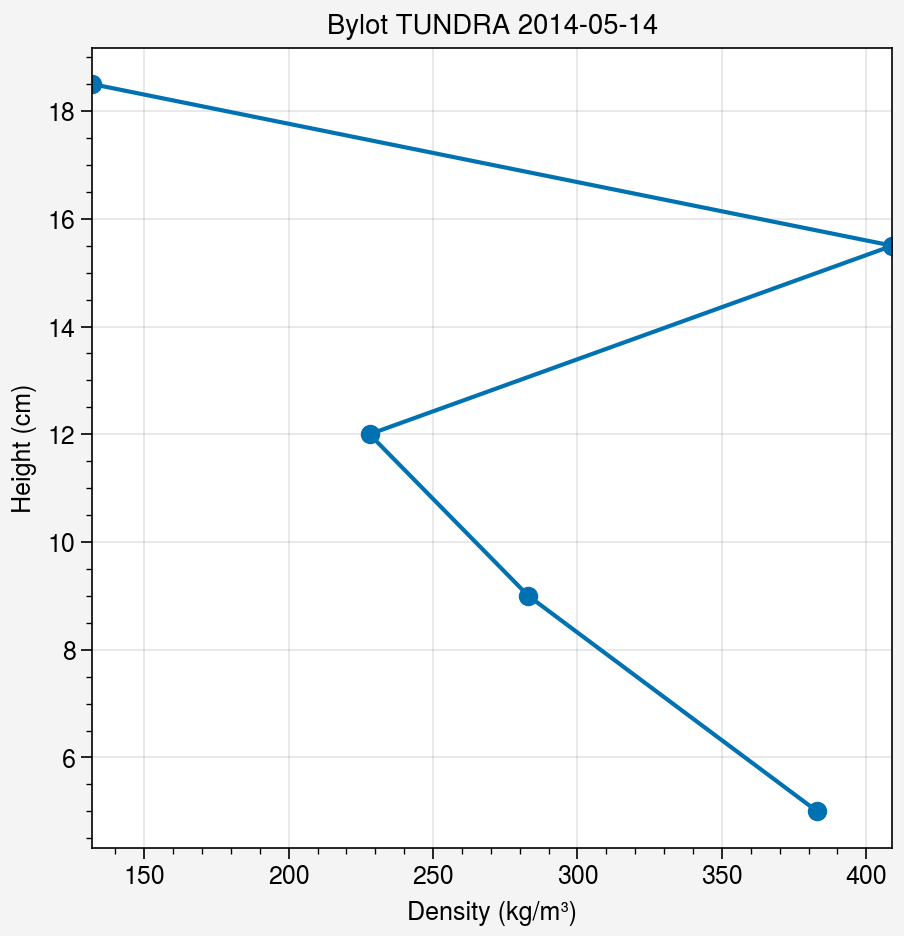

In [15]:
%matplotlib inline
fig, axs = pplt.subplots(refwidth=4)

ax = axs[0]
ax.plot(tundra_df['Density kg m-3'], tundra_df['Height cm'], marker='o', linestyle='-')
ax.format(title='Bylot TUNDRA ' + str(tundra_df.index[0])[:10],
          xlabel='Density (kg/m³)',
          ylabel='Height (cm)',
          grid=True)

In [16]:
path_obs = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all'

df_list_tundra = []
for year in ['2014', '2015', '2017', '2018', '2019']:
# for year in ['2019']:
    df = pd.read_csv(path_obs+'/Bylot/BylotDensity'+year+'.csv', sep=';', parse_dates=['Date'], index_col=['Date'])
    df_list_tundra.append(df[(df['Location'] == 'TUNDRA') | (df['Location'] == 'Tundra')])

/tmp/ipykernel_8090/4090583916.py:6: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df = pd.read_csv(path_obs+'/Bylot/BylotDensity'+year+'.csv', sep=';', parse_dates=['Date'], index_col=['Date'])
/tmp/ipykernel_8090/4090583916.py:6: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df = pd.read_csv(path_obs+'/Bylot/BylotDensity'+year+'.csv', sep=';', parse_dates=['Date'], index_col=['Date'])
/tmp/ipykernel_8090/4090583916.py:6: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df = pd.read_csv(path_obs+'/Bylot/BylotDensity'+year+'.csv', sep=';', parse_dates=['Date'], index_col=['Dat

/home/lalandmi/miniconda3/envs/sc2_v0/lib/python3.10/site-packages/proplot/axes/plot.py:1898: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if autox and autoreverse and x.ndim == 1 and x.size > 1 and x[1] < x[0]:
/home/lalandmi/miniconda3/envs/sc2_v0/lib/python3.10/site-packages/proplot/axes/plot.py:1898: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if autox and autoreverse and x.ndim == 1 and x.size > 1 and x[1] < x[0]:
/home/lalandmi/miniconda3/envs/sc2_v0/lib/python3.10/site-packages/proplot/axes/plot.py:1898: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer

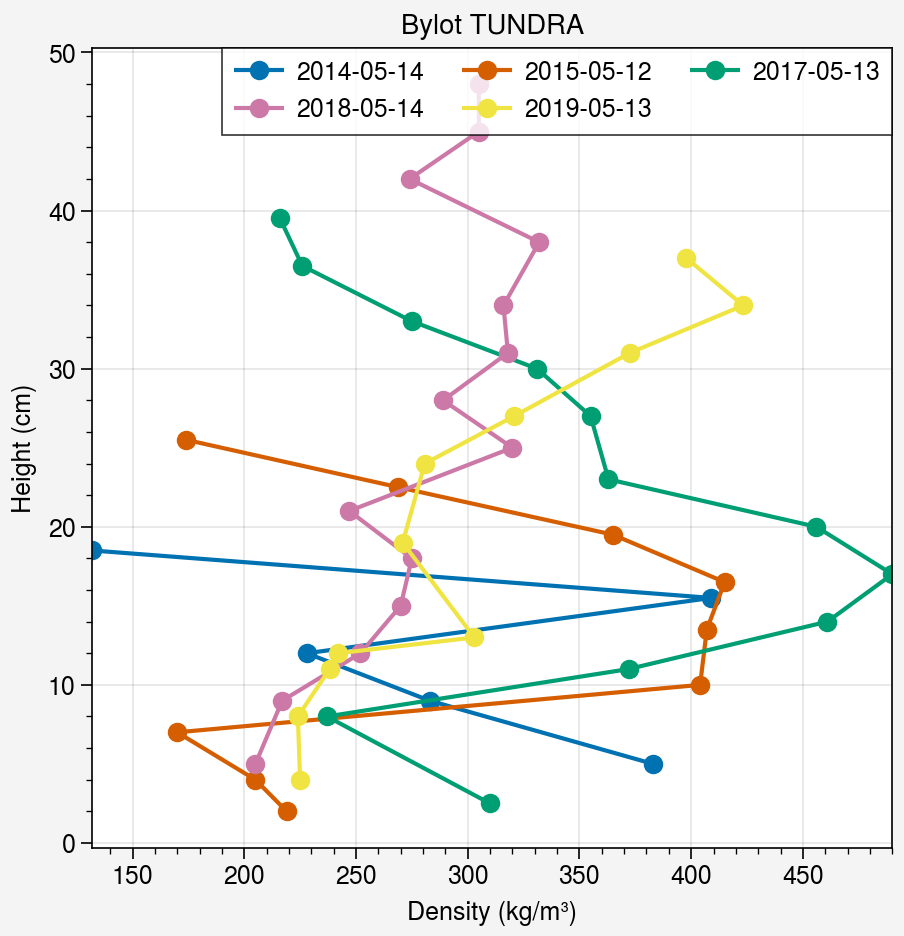

In [17]:
%matplotlib inline
fig, axs = pplt.subplots(refwidth=4)

ax = axs[0]

for tundra_df in df_list_tundra:
    ax.plot(tundra_df['Density kg m-3'], tundra_df['Height cm'], marker='o', linestyle='-', label=str(tundra_df.index[0])[:10])
ax.format(title='Bylot TUNDRA', xlabel='Density (kg/m³)', ylabel='Height (cm)', grid=True)
ax.legend()

In [18]:
df_list_tundra[1]

,Location,Height cm,Density kg m-3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13
Date,,,,,,,,,,,,,
2015-05-12,Tundra,25.5,174.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,22.5,269.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,19.5,365.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,16.5,415.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,13.5,407.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,10.0,404.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,7.0,170.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,4.0,205.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-05-12,Tundra,2.0,219.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [19]:
df_list_tundra[1]['Height cm'].iloc[0]-df_list_tundra[1]['Height cm'].iloc[-1]

23.5

In [20]:
for tundra_df in df_list_tundra:
    print(tundra_df.index[0])
    dz = tundra_df['Height cm'].iloc[0]-tundra_df['Height cm'].iloc[-1]
    print('Obs : ' + str(np.trapz(tundra_df['Density kg m-3'], -tundra_df['Height cm'])/dz))
    print('Model : ' + str(ds_d_list[0].snwdens.sel(time=tundra_df.index[0]).values))
    print()

2014-05-14 00:00:00
Obs : 298.1296296296296
Model : 367.19228339186867

2015-05-12 00:00:00
Obs : 310.01063829787233
Model : 224.11801237225595

2017-05-13 00:00:00
Obs : 342.02702702702703
Model : 288.13262434412894

2018-05-14 00:00:00
Obs : 282.1279069767442
Model : 245.52221866439535

2019-05-13 00:00:00
Obs : 300.5924242424242
Model : 408.6525172033164



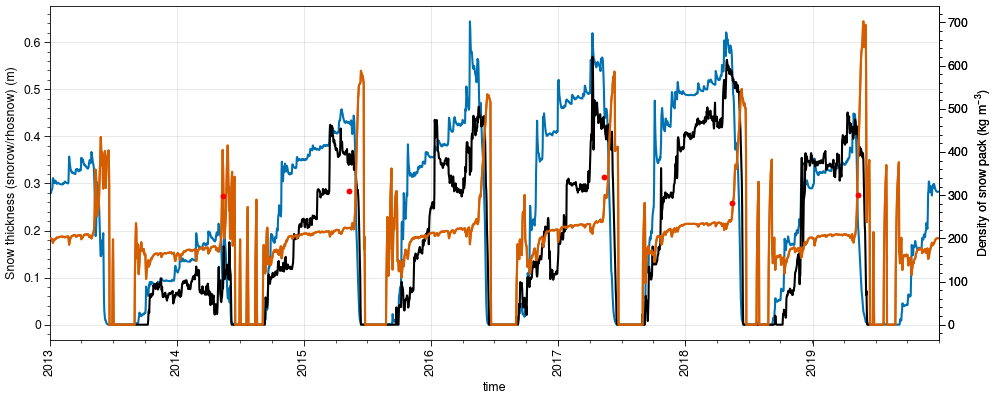

In [21]:
%matplotlib widget
# fig, axs = pplt.subplots(refwidth=10, refaspect=3)
fig, axs = pplt.subplots(figsize=(10,4))

ax = axs[0]
ax.plot(ds_d_list[0].snd)
ax.plot(ds_d_obs.snd_auto, color='k')

ox = ax.alty()
ox.plot(ds_d_list[0].snwdens, color='C1')
for tundra_df in df_list_tundra:
    dz = tundra_df['Height cm'].iloc[0]-tundra_df['Height cm'].iloc[-1]
    ox.plot(ds_d_obs.sel(time=tundra_df.index[0]).time, 
            np.trapz(tundra_df['Density kg m-3'], -tundra_df['Height cm'])/dz, 
            marker='.', color='red')




Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic')

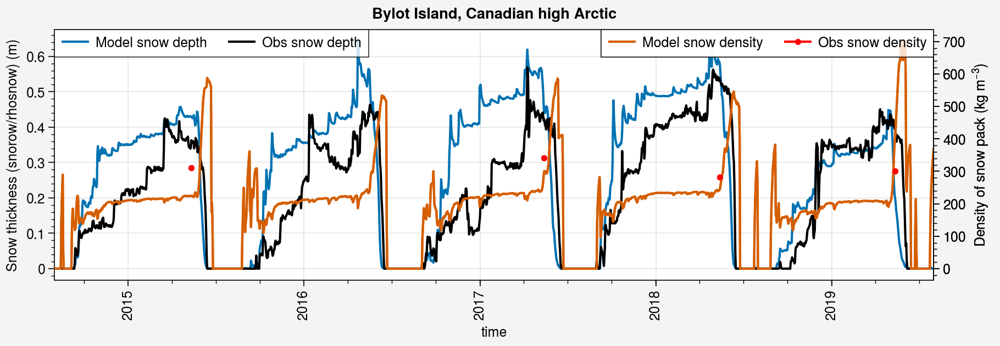

In [22]:
%matplotlib inline
fig, axs = pplt.subplots(refwidth=8, refaspect=3.5)
# fig, axs = pplt.subplots(figsize=(10,4))

period = slice('2014-08', '2019-08')

ax = axs[0]
ax.plot(ds_d_list[0].sel(time=period).snd, label='Model snow depth')
ax.plot(ds_d_obs.sel(time=period).snd_auto, color='k', label='Obs snow depth')

ox = ax.alty()
ox.plot(ds_d_list[0].sel(time=period).snwdens, color='C1', label='Model snow density')
for i, tundra_df in enumerate(df_list_tundra):
    dz = tundra_df['Height cm'].iloc[0]-tundra_df['Height cm'].iloc[-1]
    ox.plot(ds_d_obs.sel(time=tundra_df.index[0]).time, 
            np.trapz(tundra_df['Density kg m-3'], -tundra_df['Height cm'])/dz, 
            marker='.', color='red', label='Obs snow density')
    if i == 0: ox.legend(loc='ur')
ax.format(
    xlim=(pd.to_datetime(period.start), pd.to_datetime(period.stop)),
)
ax.legend()
fig.suptitle(site_longname)
# fig.save('img/'+site+'_snd_snwdens_2014-2019.jpg')

### SD

In [23]:
path_SALIX = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all/Bylot/timelapse/SALIX_F'
df_SALIX = pd.read_excel(path_SALIX+'/SnowDepth_SALIX_F.xlsx', skiprows=1, date_format='time_stamp', index_col='time_stamp')
df_SALIX.index.names = ['time']
df_SALIX

,TUNDRA,SALIX-F
time,,
2016-07-09 14:00:00,0.0,0.0
2016-07-09 15:00:00,0.0,0.0
2016-07-09 16:00:00,0.0,0.0
2016-07-09 17:00:00,0.0,0.0
2016-07-09 18:00:00,0.0,0.0
...,...,...
2019-07-05 10:00:00,0.0,0.0
2019-07-05 11:00:00,0.0,0.0
2019-07-05 12:00:00,0.0,0.0


In [24]:
ds_SALIX = df_SALIX.to_xarray()
ds_SALIX

<xarray.Dataset> Size: 628kB
Dimensions:  (time: 26185)
Coordinates:
  * time     (time) datetime64[ns] 209kB 2016-07-09T14:00:00 ... 2019-07-05T1...
Data variables:
    TUNDRA   (time) float64 209kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    SALIX-F  (time) float64 209kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0

In [25]:
tot_year = y_end - y_start + 1
gap = 6
years = pplt.arange(y_start, y_end)
years

array([2013, 2014, 2015, 2016, 2017, 2018, 2019])

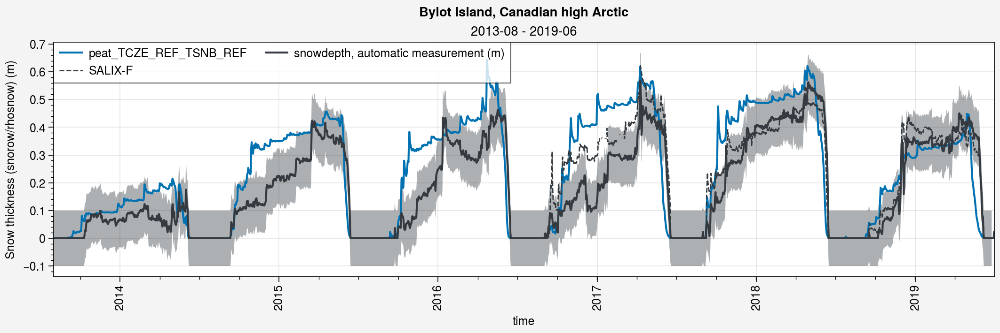

In [26]:
%matplotlib inline

color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-06')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-06')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.snd.sel(time=period), label=label)
    
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values+0.1, axis=0),
        np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
    axs[0].plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs)
    # axs[0].plot(ds_d_obs.snd_man.sel(time=period), marker='.', color=color_obs)

    axs[0].plot(ds_SALIX['SALIX-F'].sel(time=period), color=color_obs, ls='--', lw=1)
    

    # Veg
    # axs[0].plot(ds_d_list[0].vegHeight.sel(time=period), label='vegHeight', color='green', ls='-', lw=0.5, alpha=0.5)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop)
    
    fig.suptitle(site_longname)


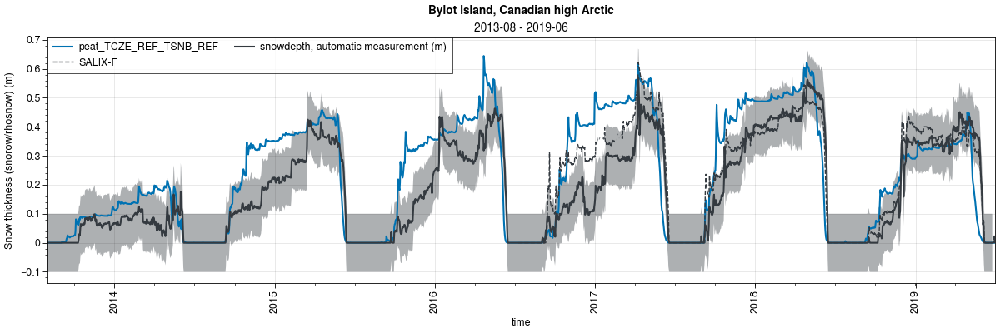

In [34]:
%matplotlib widget

color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, figsize=(12,4))

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-06')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-06')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.snd.sel(time=period), label=label)
    
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values+0.1, axis=0),
        np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
    axs[0].plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs)
    # axs[0].plot(ds_d_obs.snd_man.sel(time=period), marker='.', color=color_obs)

    axs[0].plot(ds_SALIX['SALIX-F'].sel(time=period), color=color_obs, ls='--', lw=1)
    

    # Veg
    # axs[0].plot(ds_d_list[0].vegHeight.sel(time=period), label='vegHeight', color='green', ls='-', lw=0.5, alpha=0.5)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop)
    
    fig.suptitle(site_longname)


### SWE

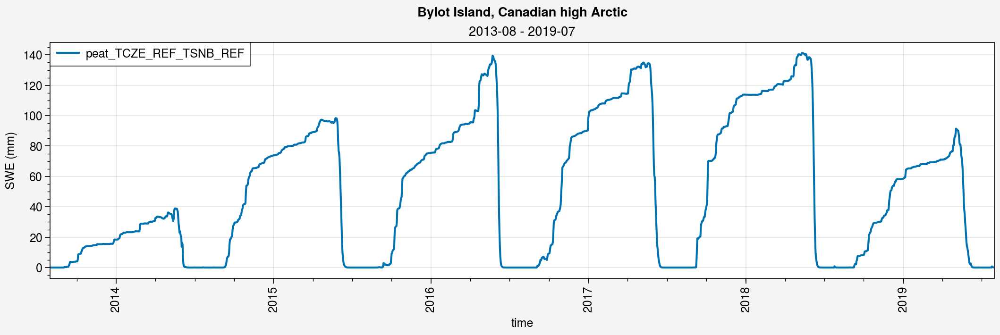

In [264]:
%matplotlib inline

color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.snw.sel(time=period), label=label)
    
    # Obs
    # shadedata = np.concatenate((
    #     np.expand_dims(ds_d_obs.snw_auto.sel(time=period).values+25, axis=0),
    #     np.expand_dims(ds_d_obs.snw_auto.sel(time=period).values-25, axis=0),), axis=0)
    # axs[0].plot(ds_d_obs.snw_auto.sel(time=period), shadedata=shadedata, color=color_obs)
    # axs[0].plot(ds_d_obs.snw_man.sel(time=period), marker='.', color=color_obs)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='SWE (mm)')
    
    fig.suptitle(site_longname)


### Albedo

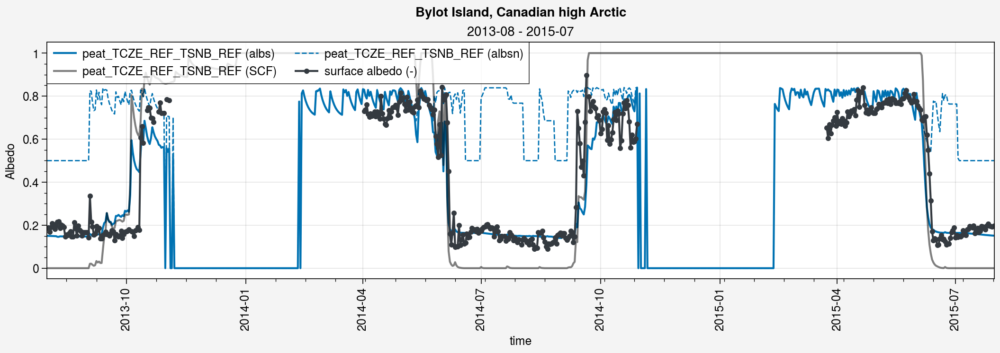

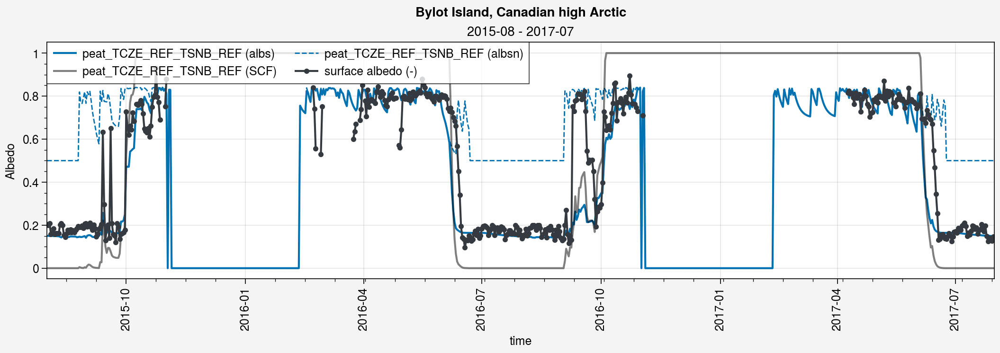

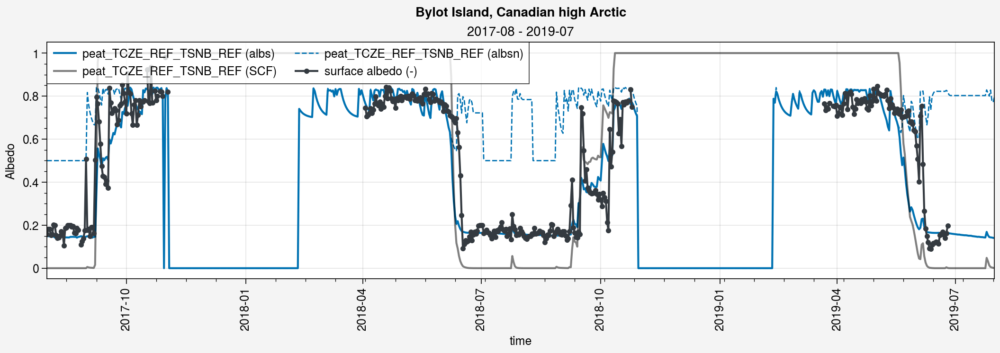

In [265]:
%matplotlib inline
gap = 2
color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    k = 0
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.albs.sel(time=period), label=label+' (albs)', color='C'+str(k))
        axs[0].plot(ds_d.albsn.sel(time=period), label=label+' (albsn)', color='C'+str(k), ls='--', lw=1)
        axs[0].plot(ds_d.snc.sel(time=period), label=label+' (SCF)', color='k', alpha=0.5)
        
        k+=1
    
    # Obs
    axs[0].plot(ds_d_obs.albs.sel(time=period), marker='.', color=color_obs)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Albedo')
    
    fig.suptitle(site_longname)


### Surface Temperature

Domine et al. ([2019](https://onlinelibrary.wiley.com/doi/abs/10.1029/2018MS001445)): "**Averaged over a period of several days the surface temperatures are essentially the same**. The amplitude variations are greater in the Alpine snowpack (Figure 8b) because the insulating layer at the top does not allow damping the air temperature variations by heat exchanges with the snowpack. This effect is more important in April and May, when daily temperature variations reach 20 °C, sometimes more. The absolute temperature differences reaches 4.7 °C on 8 February, when the temperature suddenly increases by 15 °C in 5 hr, and the surface temperature of the Alpine snowpack increases more rapidly."

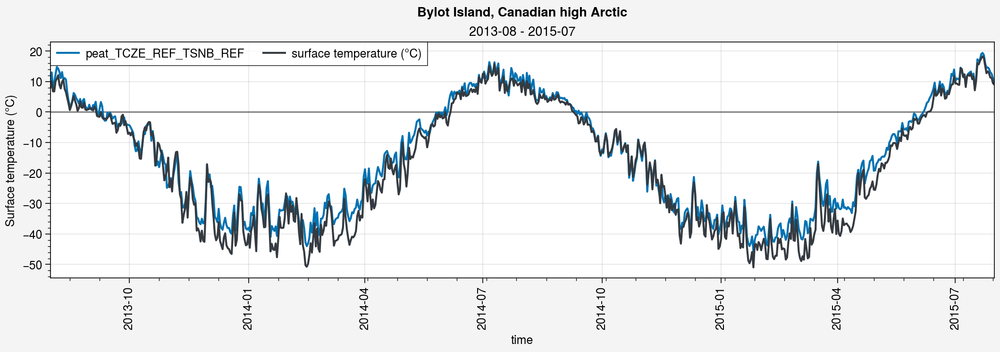

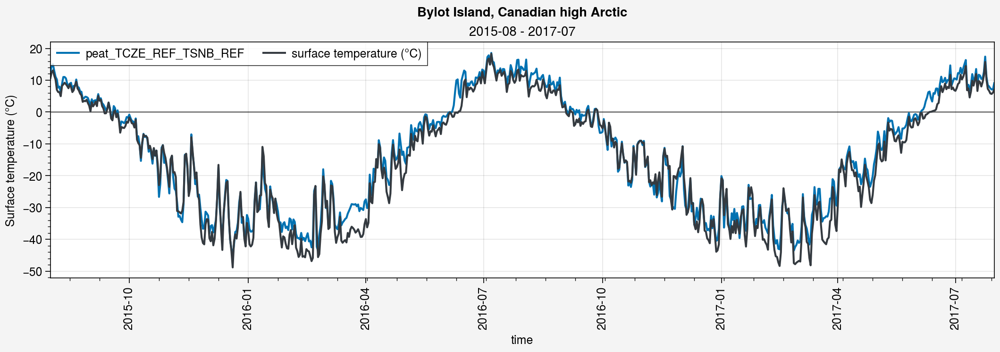

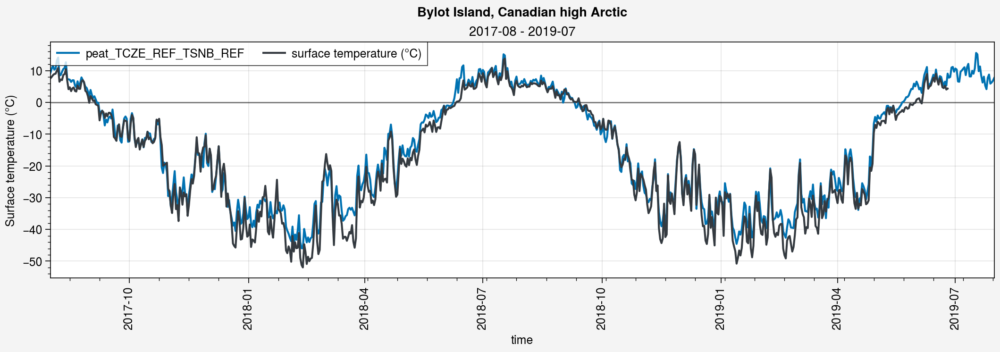

In [266]:
%matplotlib inline
gap = 2
color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.ts.sel(time=period)-273.15, label=label)
    
    # Obs
    axs[0].plot(ds_d_obs.ts.sel(time=period), color=color_obs)
    axs[0].hlines(0, ds_d.ts.sel(time=period).time[0], ds_d.ts.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Surface temperature (°C)')
    
    fig.suptitle(site_longname)


### Soil Temperature

<a list of 5 Line2D objects>

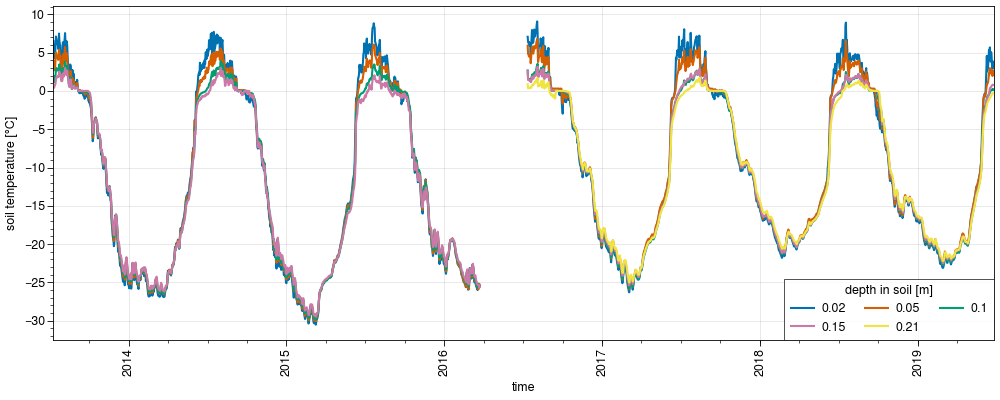

In [271]:
%matplotlib widget
fig, axs = pplt.subplots(figsize=(10,4))
ds_d_obs.tsl.plot(hue='sdepth')

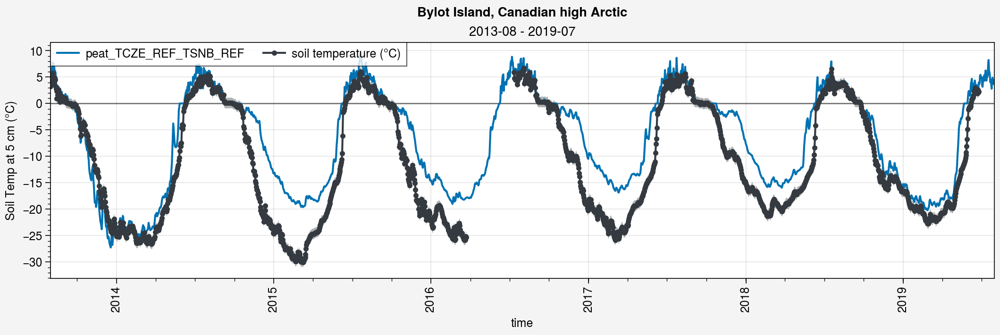

In [268]:
%matplotlib inline
gap = 6
color_obs = 'gray8'
sdepth = 0.05
sdepth_label = str(int(sdepth*100))

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        # axs[0].plot(((ds_d.tsl.sel(time=period, layer=1)+ds_d.tsl.sel(time=period, layer=2))/2)-273.15, label=label)
        # axs[0].plot(((ds_d.tsl.sel(time=period).isel(layer=0)+ds_d.tsl.sel(time=period).isel(layer=1))/2)-273.15, label=label)
        # axs[0].plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.1)-273.15, label=label)
        axs[0].plot(ds_d.tsl.sel(time=period).sel(layer=sdepth)-273.15, label=label)
        
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=sdepth)+1, axis=0),
        np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=sdepth)-1, axis=0),), axis=0)
    axs[0].plot(ds_d_obs.tsl.sel(time=period, sdepth=sdepth), shadedata=shadedata, marker='.', color=color_obs)
    
    axs[0].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Soil Temp at '+sdepth_label+' cm (°C)')
    
    fig.suptitle(site_longname)


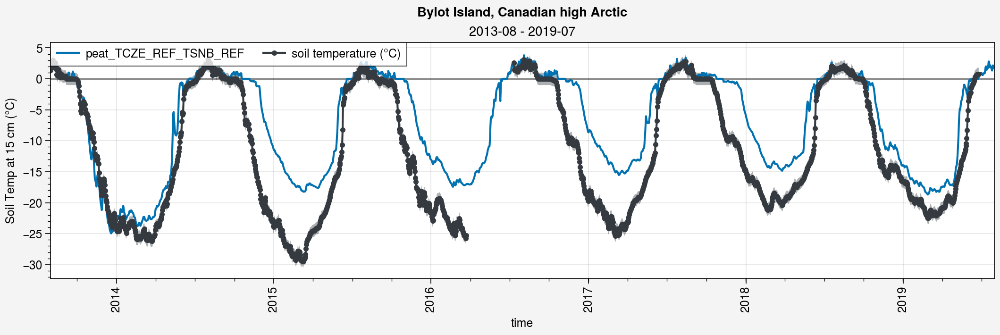

In [269]:
%matplotlib inline
gap = 6
color_obs = 'gray8'
sdepth = 0.15
sdepth_label = str(int(sdepth*100))

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        # axs[0].plot(((ds_d.tsl.sel(time=period, layer=1)+ds_d.tsl.sel(time=period, layer=2))/2)-273.15, label=label)
        # axs[0].plot(((ds_d.tsl.sel(time=period).isel(layer=0)+ds_d.tsl.sel(time=period).isel(layer=1))/2)-273.15, label=label)
        # axs[0].plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.1)-273.15, label=label)
        axs[0].plot(ds_d.tsl.sel(time=period).sel(layer=sdepth, method='nearest')-273.15, label=label)
        
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=sdepth)+1, axis=0),
        np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=sdepth)-1, axis=0),), axis=0)
    axs[0].plot(ds_d_obs.tsl.sel(time=period, sdepth=sdepth), shadedata=shadedata, marker='.', color=color_obs)
    
    axs[0].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Soil Temp at '+sdepth_label+' cm (°C)')
    
    fig.suptitle(site_longname)


### Snow temperature

<a list of 10 Line2D objects>

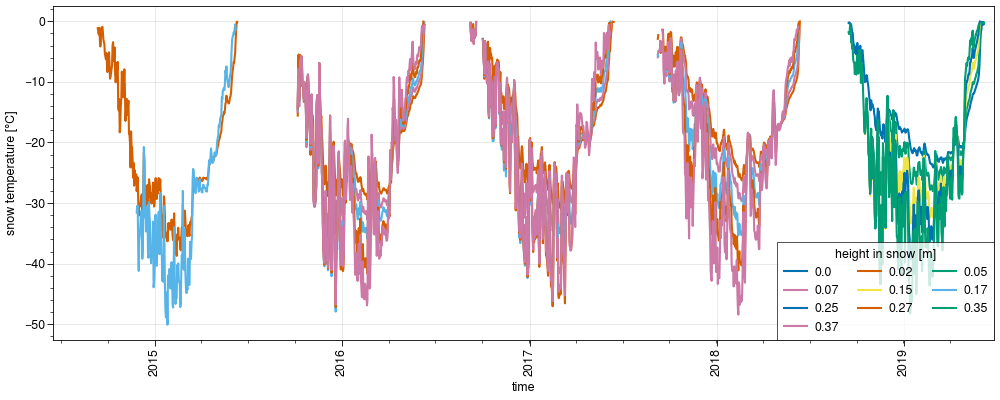

In [27]:
%matplotlib widget
fig, axs = pplt.subplots(figsize=(10,4))
ds_d_obs.tsnl.plot(hue='sheight')

In [28]:
ds_d_obs.tsnl

<xarray.DataArray 'tsnl' (time: 2176, sheight: 10)> Size: 174kB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * sheight  (sheight) float64 80B 0.0 0.02 0.05 0.07 ... 0.25 0.27 0.35 0.37
  * time     (time) datetime64[ns] 17kB 2013-07-11 2013-07-12 ... 2019-06-25
Attributes:
    long_name:  snow temperature
    units:      °C

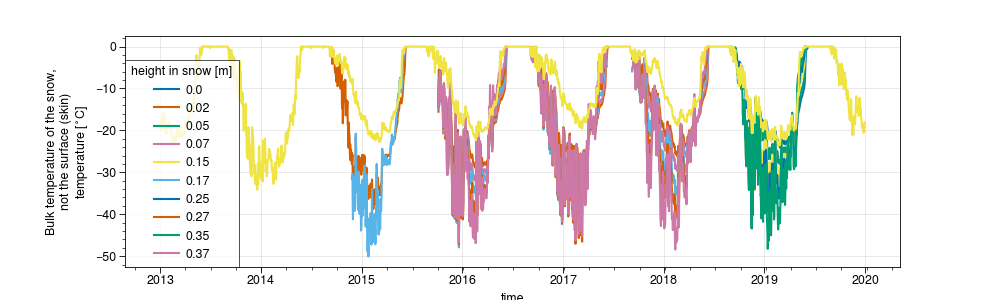

In [29]:
%matplotlib widget
plt.figure(figsize=(10,3))
ds_d_obs.tsnl.plot(hue='sheight')
# ds_d_obs.ts.plot(color='black')
ds_d_list[0].tsn.plot()
# (ds_d_list[0].ts-273.15).plot(color='red')


In [30]:
date = '2016-02-01'
def T(z, a, b, c):
    return 1/2*a*z**2 + b*z + c

z = np.linspace(0, ds_d_list[0].sel(time=date).snd.squeeze())
c = (ds_d_list[0].sel(time=date).ts-273.15).values
b = ((-3/ds_d_list[0].sel(time=date).snd)*(c-ds_d_list[0].sel(time=date).tsn.values)).values
a = (-b/ds_d_list[0].sel(time=date).snd).values
tsn_theoric = T(z, a, b, c)

tsn_th = np.trapz(tsn_theoric, x=z)/z[-1]
# print('Snow temperature from obs: {:.2f}'.format(tsn_obs)+' °C')
print('Theoric snow temperature (model): {:.2f}'.format(tsn_th.item(0))+' °C')
print('Snow temperature from model: {:.2f}'.format(ds_d.sel(time=date).tsn.values.item(0))+' °C')

Theoric snow temperature (model): -19.31 °C
Snow temperature from model: -19.31 °C


In [31]:
tsn_theoric

array([-37.11322999, -36.03405848, -34.97713794, -33.94246836,
       -32.93004973, -31.93988206, -30.97196535, -30.0262996 ,
       -29.10288481, -28.20172098, -27.3228081 , -26.46614619,
       -25.63173523, -24.81957524, -24.0296662 , -23.26200812,
       -22.516601  , -21.79344484, -21.09253963, -20.41388539,
       -19.7574821 , -19.12332978, -18.51142841, -17.921778  ,
       -17.35437855, -16.80923006, -16.28633253, -15.78568595,
       -15.30729034, -14.85114568, -14.41725199, -14.00560925,
       -13.61621747, -13.24907665, -12.90418679, -12.58154788,
       -12.28115994, -12.00302295, -11.74713693, -11.51350186,
       -11.30211775, -11.1129846 , -10.94610241, -10.80147118,
       -10.6790909 , -10.57896159, -10.50108323, -10.44545584,
       -10.4120794 , -10.40095392])

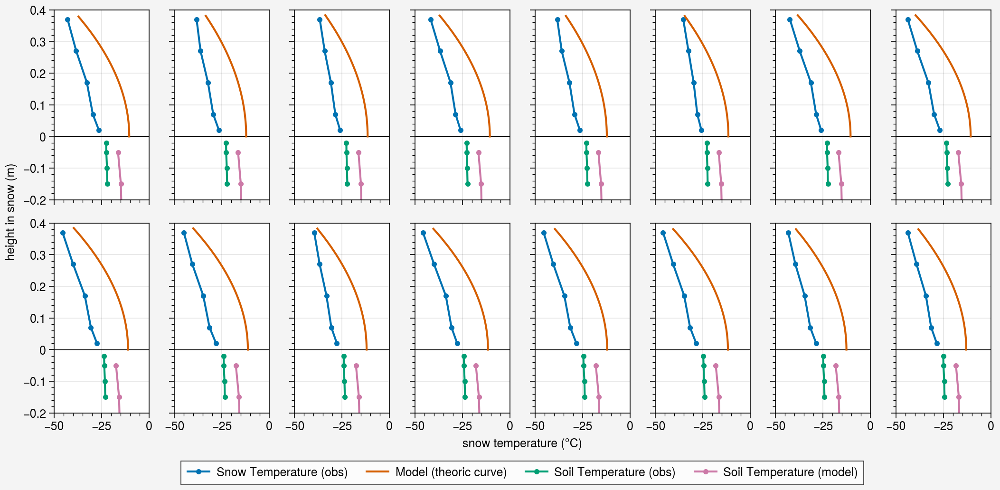

In [32]:
%matplotlib inline
import math
data_range = pd.date_range('2016-02-01', '2016-02-16')
# data_range = pd.date_range('2017-02-01', '2017-02-16')
ncols = 8
fig, axs = pplt.subplots(refaspect=0.5, ncols=ncols, nrows=math.ceil(data_range.size/ncols), refwidth=1)

for i, date in enumerate(data_range):

    z = np.linspace(0, ds_d_list[0].sel(time=date).snd.squeeze())
    c = (ds_d_list[0].sel(time=date).ts-273.15).values
    b = ((-3/ds_d_list[0].sel(time=date).snd)*(c-ds_d_list[0].sel(time=date).tsn.values)).values
    a = (-b/ds_d_list[0].sel(time=date).snd).values
    tsn_theoric = T(z, a, b, c)
    
    axs[i].plot(ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight'), ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight, 
                label='Snow Temperature (obs)', marker='.')
    # axs[i].plot(ds_d_obs.ts.sel(time=date), ds_d_obs.snd_auto.sel(time=date), label='Surace Temperature (obs)', marker='.')

    axs[i].plot(tsn_theoric.squeeze(), z[::-1], label='Model (theoric curve)')
    
    
    # axs[0].plot(ds_d_obs.tsl.sel(time=date, sdepth=0.02), -0.02, label='Soil', marker='.')
    axs[i].plot(ds_d_obs.tsl.sel(time=date), -ds_d_obs.sdepth, label='Soil Temperature (obs)', marker='.')
    axs[i].plot(ds_d_list[0].tsl.sel(time=date)-273.15, -ds_d_list[0].layer, label='Soil Temperature (model)', marker='.')
    axs[i].format(xlim=(-50, 0), ylim=(-0.2, 0.4))
    axs[i].hlines(0, -50, 0, color='k', lw=0.5)
    if i == 0: fig.legend(loc='b', ncols=4)


    
# axs[0].format(xlabel='Snow Temperature (°C)', ylabel='Snow Depth (cm)', title=date,
#              lltitle='tsn_obs: {:.2f}'.format(tsn_obs)+' °C\ntsn_th: {:.2f}'.format(tsn_th.item(0))+' °C')

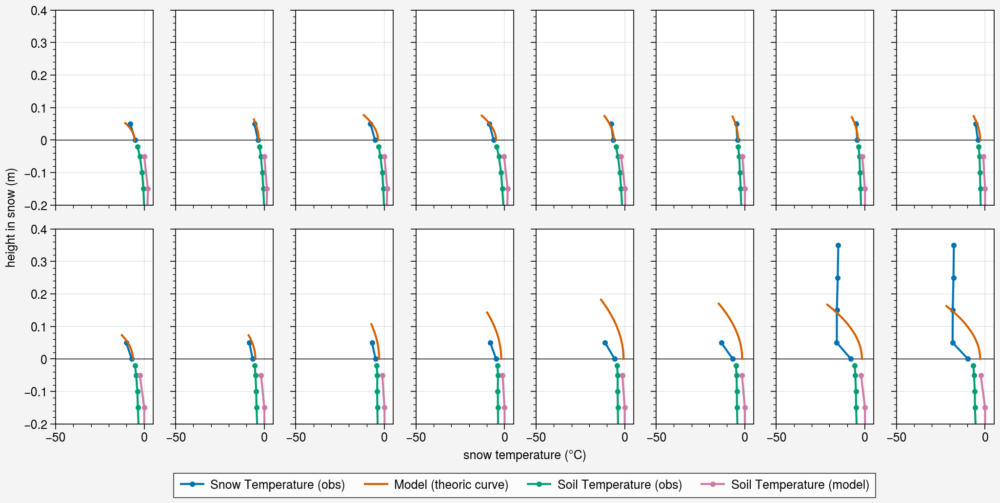

In [198]:
%matplotlib inline
import math
data_range = pd.date_range('2018-10-01', '2018-10-16')
# data_range = pd.date_range('2017-02-01', '2017-02-16')
ncols = 8
fig, axs = pplt.subplots(refaspect=0.5, ncols=ncols, nrows=math.ceil(data_range.size/ncols), refwidth=1)

for i, date in enumerate(data_range):

    z = np.linspace(0, ds_d_list[0].sel(time=date).snd.squeeze())
    c = (ds_d_list[0].sel(time=date).ts-273.15).values
    b = ((-3/ds_d_list[0].sel(time=date).snd)*(c-ds_d_list[0].sel(time=date).tsn.values)).values
    a = (-b/ds_d_list[0].sel(time=date).snd).values
    tsn_theoric = T(z, a, b, c)
    
    axs[i].plot(ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight'), ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight, 
                label='Snow Temperature (obs)', marker='.')
    # axs[i].plot(ds_d_obs.ts.sel(time=date), ds_d_obs.snd_auto.sel(time=date), label='Surace Temperature (obs)', marker='.')

    axs[i].plot(tsn_theoric.squeeze(), z[::-1], label='Model (theoric curve)')
    
    
    # axs[0].plot(ds_d_obs.tsl.sel(time=date, sdepth=0.02), -0.02, label='Soil', marker='.')
    axs[i].plot(ds_d_obs.tsl.sel(time=date), -ds_d_obs.sdepth, label='Soil Temperature (obs)', marker='.')
    axs[i].plot(ds_d_list[0].tsl.sel(time=date)-273.15, -ds_d_list[0].layer, label='Soil Temperature (model)', marker='.')
    axs[i].format(xlim=(-50, 5), ylim=(-0.2, 0.4))
    axs[i].hlines(0, -50, 5, color='k', lw=0.5)
    if i == 0: fig.legend(loc='b', ncols=4)


    
# axs[0].format(xlabel='Snow Temperature (°C)', ylabel='Snow Depth (cm)', title=date,
#              lltitle='tsn_obs: {:.2f}'.format(tsn_obs)+' °C\ntsn_th: {:.2f}'.format(tsn_th.item(0))+' °C')

In [314]:
ds_d_obs.ts.sel(time=date)

<xarray.DataArray 'ts' ()> Size: 8B
array(-27.94458333)
Coordinates:
    time     datetime64[ns] 8B 2018-10-30
Attributes:
    long_name:  surface temperature
    units:      °C

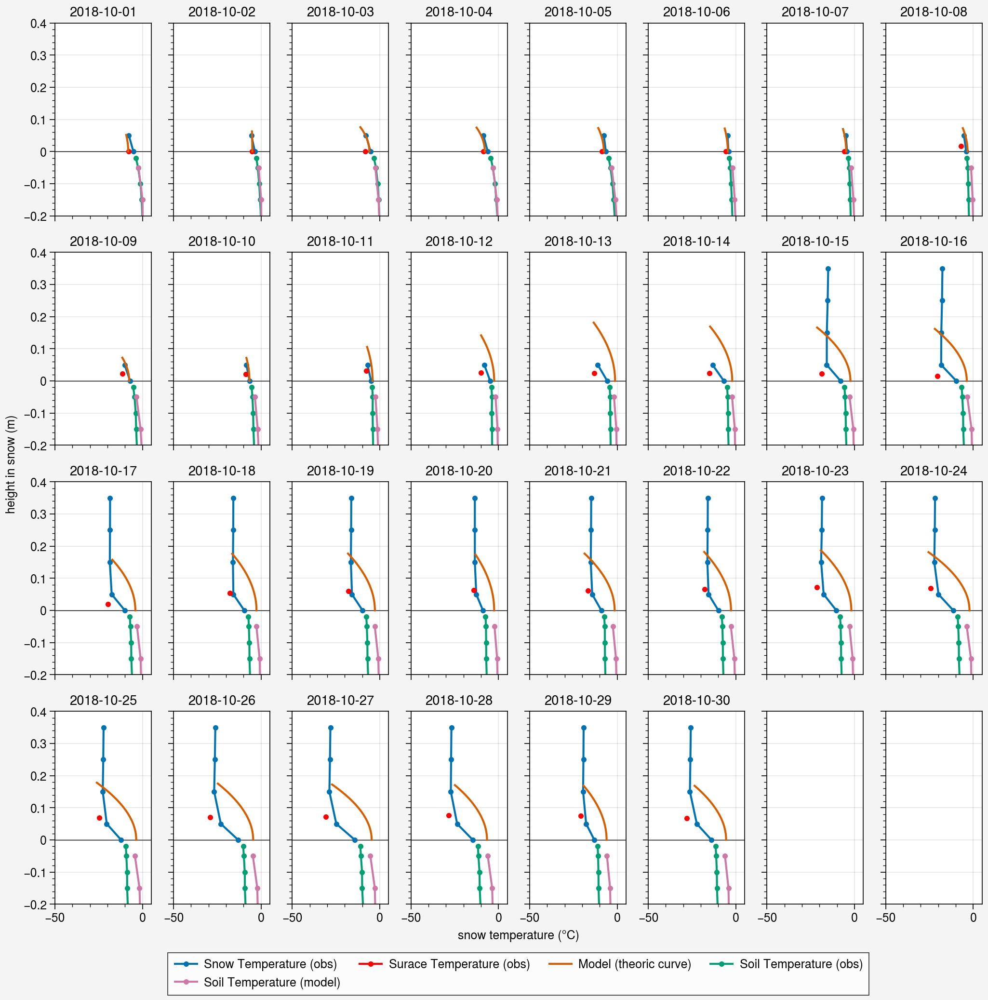

In [316]:
%matplotlib inline
import math
data_range = pd.date_range('2018-10-01', '2018-10-30')
# data_range = pd.date_range('2017-02-01', '2017-02-16')
ncols = 8
fig, axs = pplt.subplots(refaspect=0.5, ncols=ncols, nrows=math.ceil(data_range.size/ncols), refwidth=1)

for i, date in enumerate(data_range):

    z = np.linspace(0, ds_d_list[0].sel(time=date).snd.squeeze())
    c = (ds_d_list[0].sel(time=date).ts-273.15).values
    b = ((-3/ds_d_list[0].sel(time=date).snd)*(c-ds_d_list[0].sel(time=date).tsn.values)).values
    a = (-b/ds_d_list[0].sel(time=date).snd).values
    tsn_theoric = T(z, a, b, c)
    
    axs[i].plot(ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight'), ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight, 
                label='Snow Temperature (obs)', marker='.')
    axs[i].plot(ds_d_obs.ts.sel(time=date), ds_d_obs.snd_auto.sel(time=date), label='Surace Temperature (obs)', marker='.', color='red')

    axs[i].plot(tsn_theoric.squeeze(), z[::-1], label='Model (theoric curve)')
    
    
    # axs[0].plot(ds_d_obs.tsl.sel(time=date, sdepth=0.02), -0.02, label='Soil', marker='.')
    axs[i].plot(ds_d_obs.tsl.sel(time=date), -ds_d_obs.sdepth, label='Soil Temperature (obs)', marker='.')
    axs[i].plot(ds_d_list[0].tsl.sel(time=date)-273.15, -ds_d_list[0].layer, label='Soil Temperature (model)', marker='.')
    axs[i].format(xlim=(-50, 5), ylim=(-0.2, 0.4), title=str(date)[:10])
    axs[i].hlines(0, -50, 5, color='k', lw=0.5)
    if i == 0: fig.legend(loc='b', ncols=4)


    
# axs[0].format(xlabel='Snow Temperature (°C)', ylabel='Snow Depth (cm)', title=date,
#              lltitle='tsn_obs: {:.2f}'.format(tsn_obs)+' °C\ntsn_th: {:.2f}'.format(tsn_th.item(0))+' °C')

#### Hourly

In [325]:
ds_hh_list[0].sel(time=data_range)

<xarray.Dataset> Size: 2kB
Dimensions:     (time: 1, layer: 20)
Coordinates:
  * time        (time) datetime64[ns] 8B 2018-10-19
  * layer       (layer) float64 160B 0.05 0.15 0.25 0.35 ... 8.9 18.9 41.4 58.9
Data variables: (12/55)
    longitude   float64 8B -80.0
    latitude    float64 8B 73.15
    albs        (time) float64 8B 0.0
    cdh         (time) float64 8B 0.002012
    cdm         (time) float64 8B 0.002177
    evspsblsoi  (time) float64 8B -1.01e-06
    ...          ...
    tsgs        (time) float64 8B 251.0
    tsl         (time, layer) float64 160B 270.5 272.4 272.7 ... 266.8 266.8
    tsn         (time) float64 8B -7.811
    uvas        (time) float64 8B 3.014
    wsnw        (time) float64 8B 0.0
    zpond       (time) float64 8B 0.0
Attributes:
    title:        CLASSIC output file
    timestamp:    20240606 1034
    Conventions:  COARDS
    node_offset:  1
    Comment:       run_peat_TCZE_REF_TSNB_REF (spinfast=1)

In [328]:
pd.date_range('2018-10-19', '2018-10-20', freq='h')

DatetimeIndex(['2018-10-19 00:00:00', '2018-10-19 01:00:00',
               '2018-10-19 02:00:00', '2018-10-19 03:00:00',
               '2018-10-19 04:00:00', '2018-10-19 05:00:00',
               '2018-10-19 06:00:00', '2018-10-19 07:00:00',
               '2018-10-19 08:00:00', '2018-10-19 09:00:00',
               '2018-10-19 10:00:00', '2018-10-19 11:00:00',
               '2018-10-19 12:00:00', '2018-10-19 13:00:00',
               '2018-10-19 14:00:00', '2018-10-19 15:00:00',
               '2018-10-19 16:00:00', '2018-10-19 17:00:00',
               '2018-10-19 18:00:00', '2018-10-19 19:00:00',
               '2018-10-19 20:00:00', '2018-10-19 21:00:00',
               '2018-10-19 22:00:00', '2018-10-19 23:00:00',
               '2018-10-20 00:00:00'],
              dtype='datetime64[ns]', freq='H')

In [330]:
str(date)[:10]

'2018-10-20'

In [332]:
str(date)[11:]

'00:00:00'

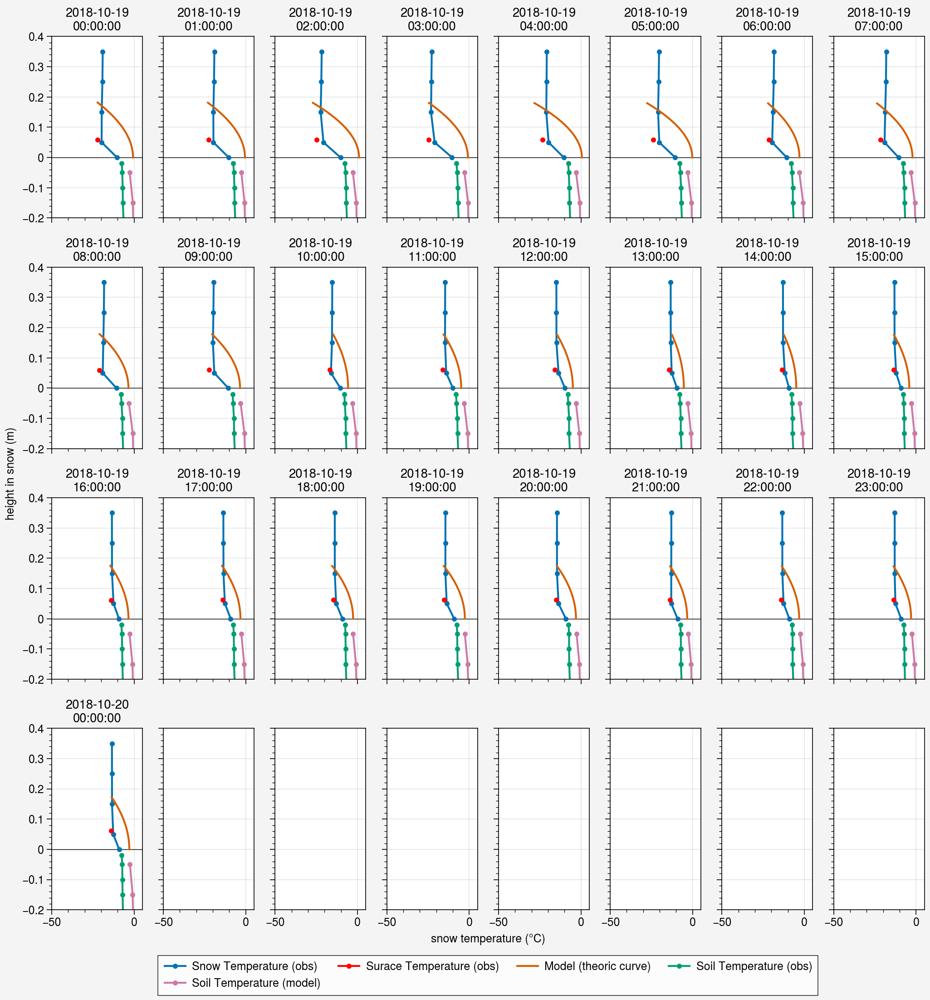

In [333]:
%matplotlib inline
import math
data_range = pd.date_range('2018-10-19', '2018-10-20', freq='h')
# data_range = pd.date_range('2017-02-01', '2017-02-16')
ncols = 8
fig, axs = pplt.subplots(refaspect=0.5, ncols=ncols, nrows=math.ceil(data_range.size/ncols), refwidth=1)

for i, date in enumerate(data_range):

    z = np.linspace(0, ds_hh_list[0].sel(time=date).snd.squeeze())
    c = (ds_hh_list[0].sel(time=date).ts-273.15).values
    b = ((-3/ds_hh_list[0].sel(time=date).snd)*(c-ds_hh_list[0].sel(time=date).tsn.values)).values
    a = (-b/ds_hh_list[0].sel(time=date).snd).values
    tsn_theoric = T(z, a, b, c)
    
    axs[i].plot(ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight'), ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight, 
                label='Snow Temperature (obs)', marker='.')
    axs[i].plot(ds_h_obs.ts.sel(time=date), ds_h_obs.snd_auto.sel(time=date), label='Surace Temperature (obs)', marker='.', color='red')

    axs[i].plot(tsn_theoric.squeeze(), z[::-1], label='Model (theoric curve)')
    
    
    # axs[0].plot(ds_h_obs.tsl.sel(time=date, sdepth=0.02), -0.02, label='Soil', marker='.')
    axs[i].plot(ds_h_obs.tsl.sel(time=date), -ds_h_obs.sdepth, label='Soil Temperature (obs)', marker='.')
    axs[i].plot(ds_hh_list[0].tsl.sel(time=date)-273.15, -ds_hh_list[0].layer, label='Soil Temperature (model)', marker='.')
    axs[i].format(xlim=(-50, 5), ylim=(-0.2, 0.4), title=str(date)[:10]+'\n'+str(date)[11:])
    axs[i].hlines(0, -50, 5, color='k', lw=0.5)
    if i == 0: fig.legend(loc='b', ncols=4)


    
# axs[0].format(xlabel='Snow Temperature (°C)', ylabel='Snow Depth (cm)', title=date,
#              lltitle='tsn_obs: {:.2f}'.format(tsn_obs)+' °C\ntsn_th: {:.2f}'.format(tsn_th.item(0))+' °C')

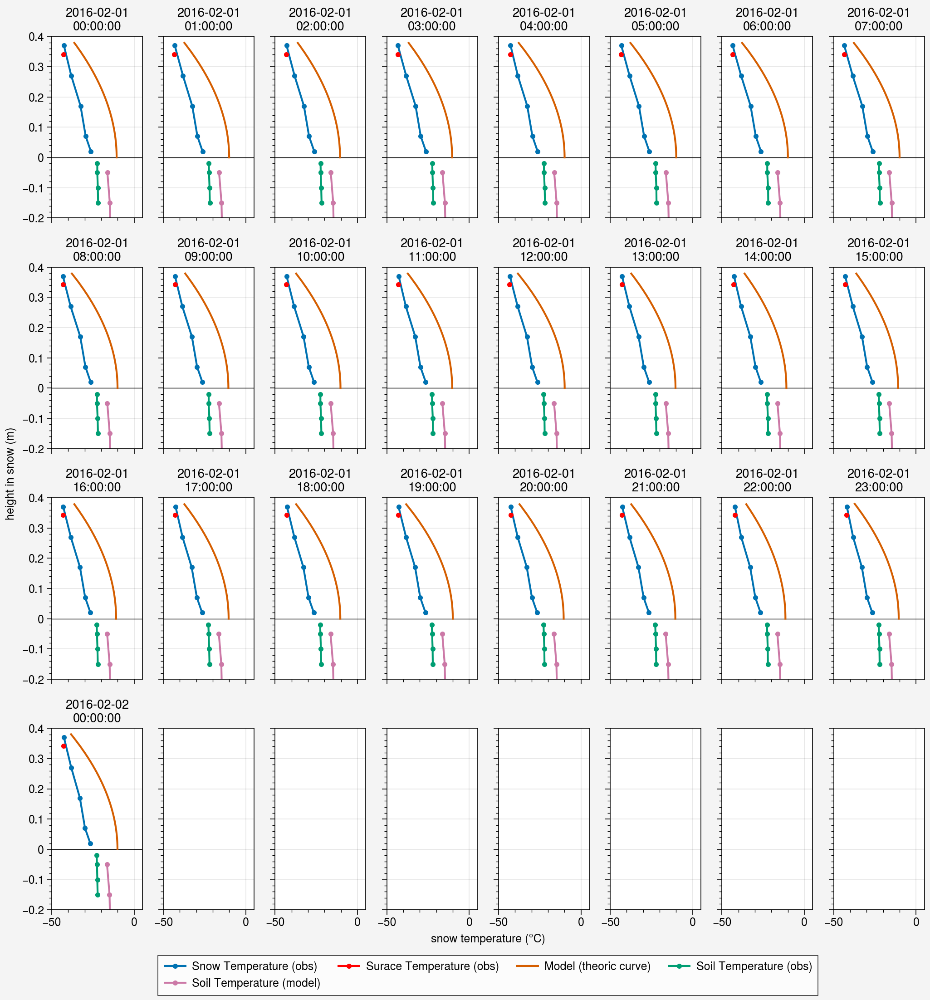

In [334]:
%matplotlib inline
import math
data_range = pd.date_range('2016-02-01', '2016-02-02', freq='h')
# data_range = pd.date_range('2017-02-01', '2017-02-16')
ncols = 8
fig, axs = pplt.subplots(refaspect=0.5, ncols=ncols, nrows=math.ceil(data_range.size/ncols), refwidth=1)

for i, date in enumerate(data_range):

    z = np.linspace(0, ds_hh_list[0].sel(time=date).snd.squeeze())
    c = (ds_hh_list[0].sel(time=date).ts-273.15).values
    b = ((-3/ds_hh_list[0].sel(time=date).snd)*(c-ds_hh_list[0].sel(time=date).tsn.values)).values
    a = (-b/ds_hh_list[0].sel(time=date).snd).values
    tsn_theoric = T(z, a, b, c)
    
    axs[i].plot(ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight'), ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight, 
                label='Snow Temperature (obs)', marker='.')
    axs[i].plot(ds_h_obs.ts.sel(time=date), ds_h_obs.snd_auto.sel(time=date), label='Surace Temperature (obs)', marker='.', color='red')

    axs[i].plot(tsn_theoric.squeeze(), z[::-1], label='Model (theoric curve)')
    
    
    # axs[0].plot(ds_h_obs.tsl.sel(time=date, sdepth=0.02), -0.02, label='Soil', marker='.')
    axs[i].plot(ds_h_obs.tsl.sel(time=date), -ds_h_obs.sdepth, label='Soil Temperature (obs)', marker='.')
    axs[i].plot(ds_hh_list[0].tsl.sel(time=date)-273.15, -ds_hh_list[0].layer, label='Soil Temperature (model)', marker='.')
    axs[i].format(xlim=(-50, 5), ylim=(-0.2, 0.4), title=str(date)[:10]+'\n'+str(date)[11:])
    axs[i].hlines(0, -50, 5, color='k', lw=0.5)
    if i == 0: fig.legend(loc='b', ncols=4)


    
# axs[0].format(xlabel='Snow Temperature (°C)', ylabel='Snow Depth (cm)', title=date,
#              lltitle='tsn_obs: {:.2f}'.format(tsn_obs)+' °C\ntsn_th: {:.2f}'.format(tsn_th.item(0))+' °C')

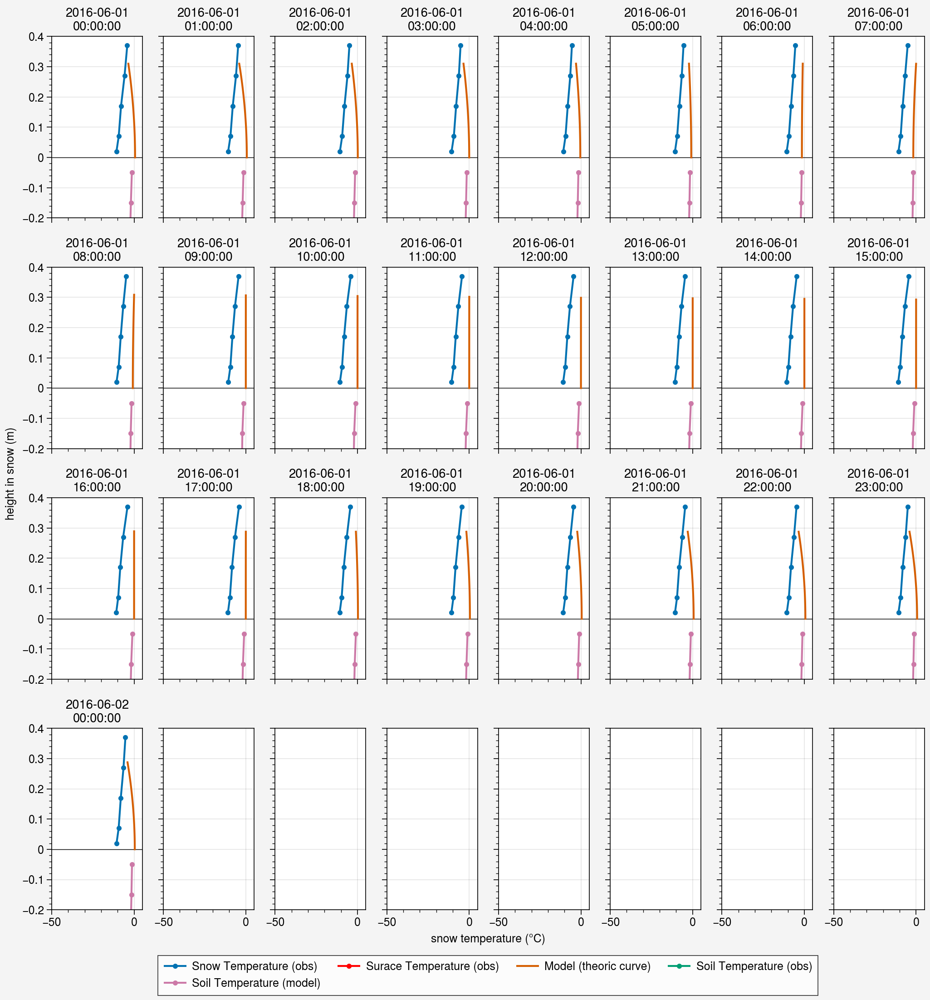

In [339]:
%matplotlib inline
import math
data_range = pd.date_range('2016-06-01', '2016-06-02', freq='h')
# data_range = pd.date_range('2017-02-01', '2017-02-16')
ncols = 8
fig, axs = pplt.subplots(refaspect=0.5, ncols=ncols, nrows=math.ceil(data_range.size/ncols), refwidth=1)

for i, date in enumerate(data_range):

    z = np.linspace(0, ds_hh_list[0].sel(time=date).snd.squeeze())
    c = (ds_hh_list[0].sel(time=date).ts-273.15).values
    b = ((-3/ds_hh_list[0].sel(time=date).snd)*(c-ds_hh_list[0].sel(time=date).tsn.values)).values
    a = (-b/ds_hh_list[0].sel(time=date).snd).values
    tsn_theoric = T(z, a, b, c)
    
    axs[i].plot(ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight'), ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight, 
                label='Snow Temperature (obs)', marker='.')
    axs[i].plot(ds_h_obs.ts.sel(time=date), ds_h_obs.snd_auto.sel(time=date), label='Surace Temperature (obs)', marker='.', color='red')

    axs[i].plot(tsn_theoric.squeeze(), z[::-1], label='Model (theoric curve)')
    
    
    # axs[0].plot(ds_h_obs.tsl.sel(time=date, sdepth=0.02), -0.02, label='Soil', marker='.')
    axs[i].plot(ds_h_obs.tsl.sel(time=date), -ds_h_obs.sdepth, label='Soil Temperature (obs)', marker='.')
    axs[i].plot(ds_hh_list[0].tsl.sel(time=date)-273.15, -ds_hh_list[0].layer, label='Soil Temperature (model)', marker='.')
    axs[i].format(xlim=(-50, 5), ylim=(-0.2, 0.4), title=str(date)[:10]+'\n'+str(date)[11:])
    axs[i].hlines(0, -50, 5, color='k', lw=0.5)
    if i == 0: fig.legend(loc='b', ncols=4)


    
# axs[0].format(xlabel='Snow Temperature (°C)', ylabel='Snow Depth (cm)', title=date,
#              lltitle='tsn_obs: {:.2f}'.format(tsn_obs)+' °C\ntsn_th: {:.2f}'.format(tsn_th.item(0))+' °C')

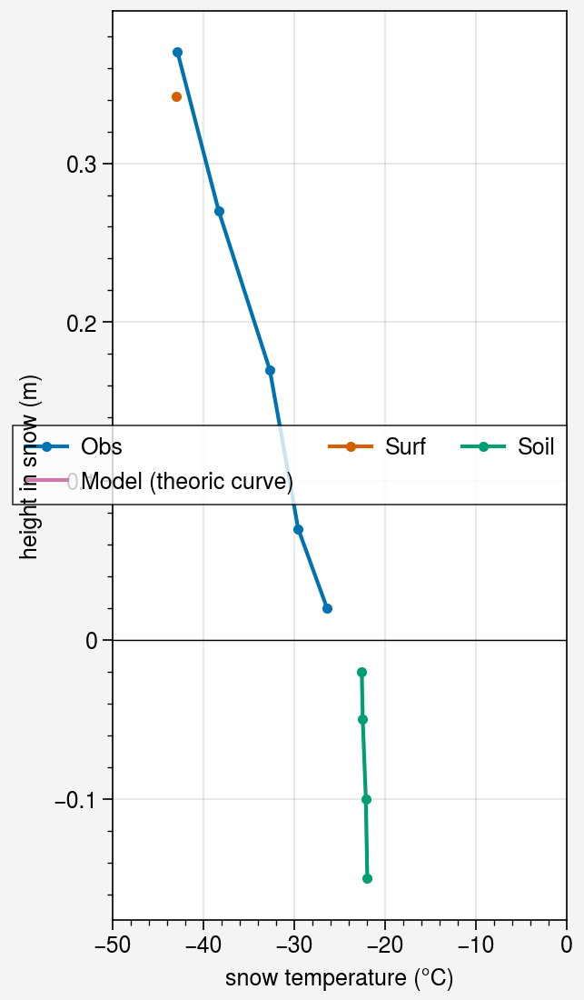

In [340]:
%matplotlib inline
fig, axs = pplt.subplots(refaspect=0.5)

date = '2016-02-01'
axs[0].plot(ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight'), ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight, label='Obs', marker='.')
axs[0].plot(ds_d_obs.ts.sel(time=date), ds_d_obs.snd_auto.sel(time=date), label='Surf', marker='.')
# axs[0].plot(ds_d_obs.tsl.sel(time=date, sdepth=0.02), -0.02, label='Soil', marker='.')
axs[0].plot(ds_d_obs.tsl.sel(time=date), -ds_d_obs.sdepth, label='Soil', marker='.')
axs[0].plot(tsn_theoric.squeeze()-273.15, z[::-1], label='Model (theoric curve)')
axs[0].legend()
axs[0].format(xlim=(-50, 0))
axs[0].hlines(0, -50, 0, color='k', lw=0.5)

# axs[0].format(xlabel='Snow Temperature (°C)', ylabel='Snow Depth (cm)', title=date,
#              lltitle='tsn_obs: {:.2f}'.format(tsn_obs)+' °C\ntsn_th: {:.2f}'.format(tsn_th.item(0))+' °C')

In [344]:
ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight')

<xarray.DataArray 'tsnl' (sheight: 5)> Size: 40B
array([-26.39062859, -29.56709874, -32.69646578, -38.32118822,
       -42.85669473])
Coordinates:
  * sheight  (sheight) float64 40B 0.02 0.07 0.17 0.27 0.37
    time     datetime64[ns] 8B 2016-02-01
Attributes:
    long_name:  snow temperature
    units:      °C

In [346]:
ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight')

<xarray.DataArray 'tsnl' (sheight: 5)> Size: 40B
array([-26.39062859, -29.56709874, -32.69646578, -38.32118822,
       -42.85669473])
Coordinates:
  * sheight  (sheight) float64 40B 0.02 0.07 0.17 0.27 0.37
    time     datetime64[ns] 8B 2016-02-01
Attributes:
    long_name:  snow temperature
    units:      °C

In [354]:
ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight.values

array([0.02, 0.07, 0.17, 0.27, 0.37])

In [357]:
-np.trapz(
    ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight').values,
    ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight.values
)/(ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight.values[0]-ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight.values[-1])

-34.63399501910715

In [359]:
ds_d_obs.ts.sel(time=date).values

array(-42.97708333)

In [361]:
ds_d_obs.snd_auto.sel(time=date).values

array(0.341875)

In [386]:
# Get only values lower than the measured surface temperature
ds_temp = ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight').where(
    ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight < ds_d_obs.snd_auto.sel(time=date).values,
    drop=True
)
ds_temp

# Append the surface temperature and compute the average
np.trapz(
    np.append(ds_temp.values, ds_d_obs.ts.sel(time=date).values),
    np.append(ds_temp.sheight.values, ds_d_obs.snd_auto.sel(time=date).values)
)/(ds_d_obs.snd_auto.sel(time=date).values-ds_temp.sheight.values[0])

-34.127101338517406

In [402]:
ds_d_obs.time.values

array(['2013-07-11T00:00:00.000000000', '2013-07-12T00:00:00.000000000',
       '2013-07-13T00:00:00.000000000', ...,
       '2019-06-23T00:00:00.000000000', '2019-06-24T00:00:00.000000000',
       '2019-06-25T00:00:00.000000000'], dtype='datetime64[ns]')

In [405]:
ds_d_obs['tsn'][0]

<xarray.DataArray 'tsn' ()> Size: 8B
array(nan)
Coordinates:
    time     datetime64[ns] 8B 2013-07-11

In [416]:
ds_d_obs.snd_auto.sel(time=day)

<xarray.DataArray 'snd_auto' ()> Size: 8B
array(0.00883333)
Coordinates:
    time     datetime64[ns] 8B 2013-10-11
Attributes:
    long_name:  snowdepth, automatic measurement
    units:      m

In [426]:
ds_temp.shape[0]

0

#### Add tsn to ds_d_obs
Results done bellow are very close to the average actually but that's a bit more correct to do like this. 

In [33]:
ds_d_obs['tsn'] = ds_d_obs.snd_auto.copy()*np.nan

for i, day in enumerate(ds_d_obs.time.values):
    # Get only values lower than the measured surface temperature
    ds_temp = ds_d_obs.tsnl.sel(time=day).dropna(dim='sheight').where(
        ds_d_obs.tsnl.sel(time=day).dropna(dim='sheight').sheight < ds_d_obs.snd_auto.sel(time=day).values,
        drop=True
    )
    ds_temp

    if ds_temp.shape[0] > 0:
        # Append the surface temperature and compute the average
        tsn = np.trapz(
            np.append(ds_temp.values, ds_d_obs.ts.sel(time=day).values),
            np.append(ds_temp.sheight.values, ds_d_obs.snd_auto.sel(time=day).values)
        )/(ds_d_obs.snd_auto.sel(time=day).values-ds_temp.sheight.values[0])

    else:
        tsn = np.nan

    ds_d_obs['tsn'][i] = tsn

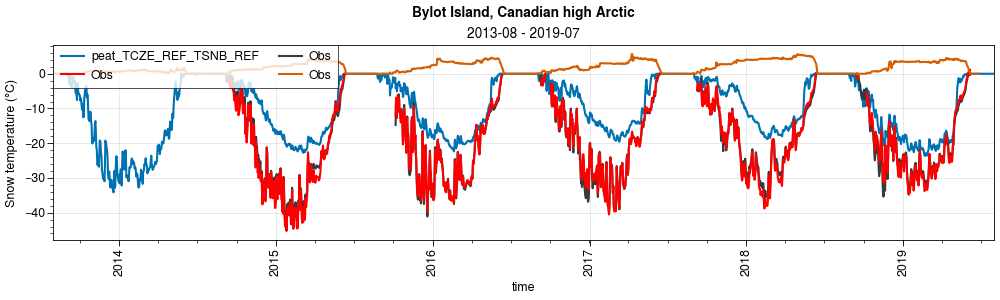

In [34]:
%matplotlib widget
gap = 6
color_obs = 'gray8'

for i in range(tot_year//gap):
    # fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)
    fig, axs = pplt.subplots(ncols=1, nrows=1, figsize=(10,3))

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.tsn.sel(time=period), label=label)
        
    # Obs
    axs[0].plot(ds_d_obs.tsnl.mean('sheight').sel(time=period), color=color_obs, label='Obs')
    axs[0].plot(ds_d_obs.tsn.sel(time=period), color='red', label='Obs')
    
    axs[0].plot(ds_d_obs.snd_auto.sel(time=period)*10, label='Obs')
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Snow temperature (°C)')
    
    fig.suptitle(site_longname)


#### Add tsn to ds_hh_obs
Results done bellow are very close to the average actually but that's a bit more correct to do like this. 

A better way could be done to make this faster and avoid the loop.

In [35]:
ds_h_obs['tsn'] = ds_h_obs.snd_auto.copy()*np.nan

for i, hour in enumerate(ds_h_obs.time.values):
    # Get only values lower than the measured surface temperature
    ds_temp = ds_h_obs.tsnl.sel(time=hour).dropna(dim='sheight').where(
        ds_h_obs.tsnl.sel(time=hour).dropna(dim='sheight').sheight < ds_h_obs.snd_auto.sel(time=hour).values,
        drop=True
    )
    ds_temp

    if ds_temp.shape[0] > 0:
        # Append the surface temperature and compute the average
        tsn = np.trapz(
            np.append(ds_temp.values, ds_h_obs.ts.sel(time=hour).values),
            np.append(ds_temp.sheight.values, ds_h_obs.snd_auto.sel(time=hour).values)
        )/(ds_h_obs.snd_auto.sel(time=hour).values-ds_temp.sheight.values[0])

    else:
        tsn = np.nan

    ds_h_obs['tsn'][i] = tsn

#### Check TSNBOT

Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic')

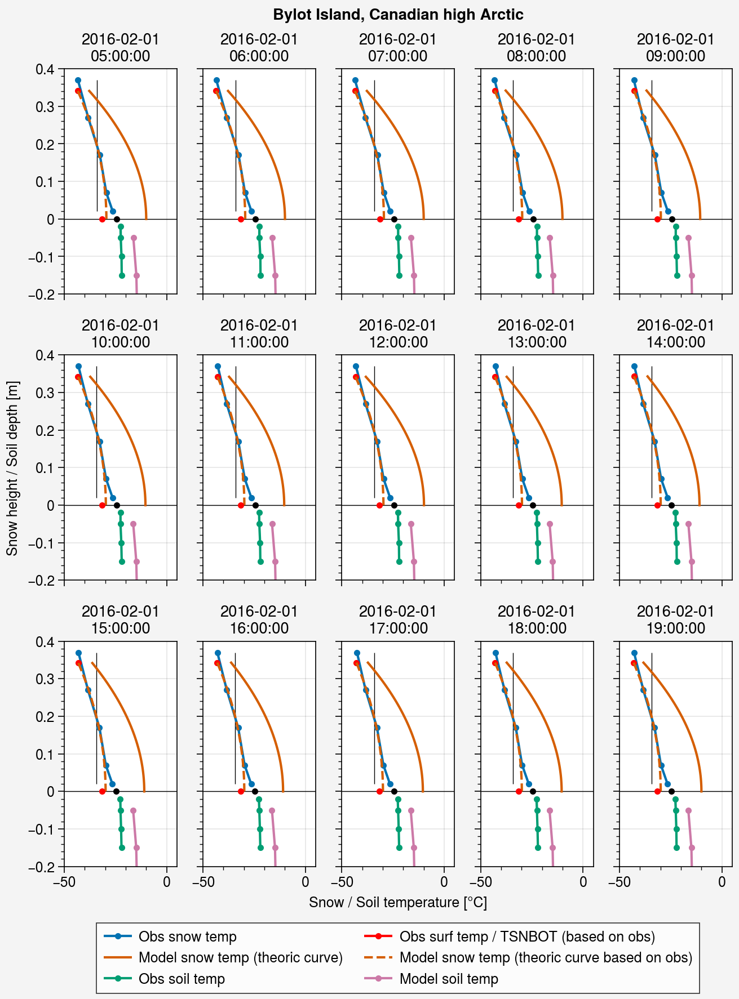

In [36]:
%matplotlib inline
import math
data_range = pd.date_range('2016-02-01 05:00', '2016-02-01 19:00', freq='h')
# data_range = pd.date_range('2017-02-01', '2017-02-16')
ncols = 5
fig, axs = pplt.subplots(refaspect=0.5, ncols=ncols, nrows=math.ceil(data_range.size/ncols), refwidth=1)

for i, date in enumerate(data_range):

    # From model
    z = np.linspace(0, ds_hh_list[0].sel(time=date).snd.squeeze())
    c = (ds_hh_list[0].sel(time=date).ts-273.15).values
    b = ((-3/ds_hh_list[0].sel(time=date).snd)*(c-ds_hh_list[0].sel(time=date).tsn.values)).values
    a = (-b/ds_hh_list[0].sel(time=date).snd).values
    tsn_theoric = T(z, a, b, c)

    # From obs
    z = np.linspace(0, ds_h_obs.sel(time=date).snd_auto.squeeze())
    c = (ds_h_obs.sel(time=date).ts).values
    b = ((-3/ds_h_obs.sel(time=date).snd_auto)*(c-ds_h_obs.sel(time=date).tsn.values)).values
    a = (-b/ds_h_obs.sel(time=date).snd_auto).values
    tsn_theoric_obs = T(z, a, b, c)
    
    axs[i].plot(ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight'), ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight, 
                label='Obs snow temp', marker='.')
    axs[i].plot(ds_h_obs.ts.sel(time=date), ds_h_obs.snd_auto.sel(time=date), label='Obs surf temp / TSNBOT (based on obs)', marker='.', color='red')

    axs[i].plot(tsn_theoric.squeeze(), z[::-1], label='Model snow temp (theoric curve)')
    axs[i].plot(tsn_theoric_obs.squeeze(), z[::-1], label='Model snow temp (theoric curve based on obs)', color='C1', ls='--')
    
    
    # axs[0].plot(ds_h_obs.tsl.sel(time=date, sdepth=0.02), -0.02, label='Soil', marker='.')
    axs[i].plot(ds_h_obs.tsl.sel(time=date), -ds_h_obs.sdepth, label='Obs soil temp', marker='.')
    axs[i].plot(ds_hh_list[0].tsl.sel(time=date)-273.15, -ds_hh_list[0].layer, label='Model soil temp', marker='.')
    axs[i].format(xlim=(-50, 5), ylim=(-0.2, 0.4), title=str(date)[:10]+'\n'+str(date)[11:])
    axs[i].hlines(0, -50, 5, color='k', lw=0.5)
    if i == 0: fig.legend(loc='b', ncols=2)


    # Check TSNBOT

    axs[i].vlines(ds_h_obs.tsn.sel(time=date).values, ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight[0], 
              ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight[-1], color='k', lw=0.5)
    
    ZSNOW = ds_h_obs.snd_auto.sel(time=date).values
    TSNOW = ds_h_obs.tsn.sel(time=date).values
    DELZ = 0.1 # Thickness of first soil layer (10 cm)
    # We could take the soil measurement at 0.05 (really similar at +-0.2°C when there is snow
    # -> here integral between the 0.02 to 0.1 measurement (to mimic the first model soil layer)
    # TBAR = ds_d_obs.tsl.sel(time=date, sdepth=0.05)
    TBAR = ds_h_obs.tsl.sel(time=date).where(ds_h_obs.tsl.sdepth <= 0.1, drop=True).integrate('sdepth')/(0.1-0.02)
    
    
    axs[i].vlines(TBAR, -0.1, -0.02, color='C2', lw=0.5)
    
    # https://gitlab.com/cccma/classic/-/blob/master/src/snowTempUpdate.f90?ref_type=heads#L139
    TSNBOT = (ZSNOW * TSNOW + DELZ * TBAR) / (ZSNOW + DELZ)
    axs[i].plot(TSNBOT, 0, label='TSNBOT (theoric)', marker='.', color='red')
    
    TSNBOT_obs = np.mean(np.append(ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight')[0].values, ds_h_obs.tsl.sel(time=date)[0].values))
    axs[i].plot(TSNBOT_obs, 0, label='TSNBOT (obs)', marker='.', color='black')

    axs[i].format(
        xlabel='Snow / Soil temperature [°C]',
        ylabel='Snow height / Soil depth [m]',
    )

fig.suptitle(site_longname)
# fig.save('img/'+site+'_snow_soil_temp_profiles_20260201.jpg')
    
# axs[0].format(xlabel='Snow Temperature (°C)', ylabel='Snow Depth (cm)', title=date,
#              lltitle='tsn_obs: {:.2f}'.format(tsn_obs)+' °C\ntsn_th: {:.2f}'.format(tsn_th.item(0))+' °C')

Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic')

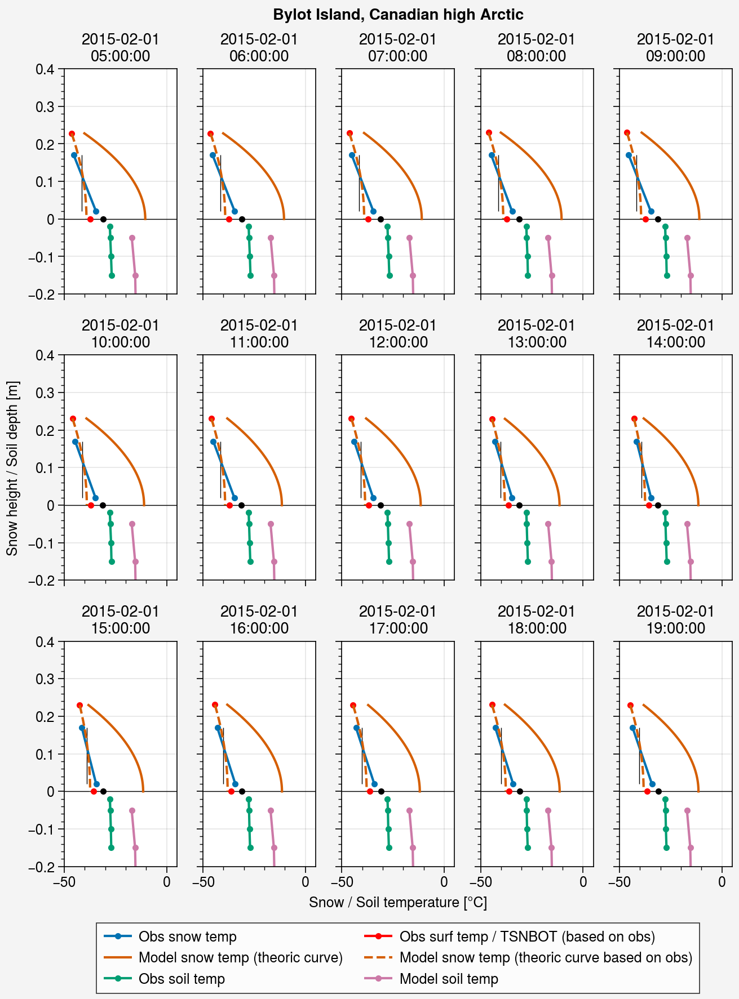

In [37]:
%matplotlib inline
import math
data_range = pd.date_range('2015-02-01 05:00', '2015-02-01 19:00', freq='h')
# data_range = pd.date_range('2017-02-01', '2017-02-16')
ncols = 5
fig, axs = pplt.subplots(refaspect=0.5, ncols=ncols, nrows=math.ceil(data_range.size/ncols), refwidth=1)

for i, date in enumerate(data_range):

    # From model
    z = np.linspace(0, ds_hh_list[0].sel(time=date).snd.squeeze())
    c = (ds_hh_list[0].sel(time=date).ts-273.15).values
    b = ((-3/ds_hh_list[0].sel(time=date).snd)*(c-ds_hh_list[0].sel(time=date).tsn.values)).values
    a = (-b/ds_hh_list[0].sel(time=date).snd).values
    tsn_theoric = T(z, a, b, c)

    # From obs
    z = np.linspace(0, ds_h_obs.sel(time=date).snd_auto.squeeze())
    c = (ds_h_obs.sel(time=date).ts).values
    b = ((-3/ds_h_obs.sel(time=date).snd_auto)*(c-ds_h_obs.sel(time=date).tsn.values)).values
    a = (-b/ds_h_obs.sel(time=date).snd_auto).values
    tsn_theoric_obs = T(z, a, b, c)
    
    axs[i].plot(ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight'), ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight, 
                label='Obs snow temp', marker='.')
    axs[i].plot(ds_h_obs.ts.sel(time=date), ds_h_obs.snd_auto.sel(time=date), label='Obs surf temp / TSNBOT (based on obs)', marker='.', color='red')

    axs[i].plot(tsn_theoric.squeeze(), z[::-1], label='Model snow temp (theoric curve)')
    axs[i].plot(tsn_theoric_obs.squeeze(), z[::-1], label='Model snow temp (theoric curve based on obs)', color='C1', ls='--')
    
    
    # axs[0].plot(ds_h_obs.tsl.sel(time=date, sdepth=0.02), -0.02, label='Soil', marker='.')
    axs[i].plot(ds_h_obs.tsl.sel(time=date), -ds_h_obs.sdepth, label='Obs soil temp', marker='.')
    axs[i].plot(ds_hh_list[0].tsl.sel(time=date)-273.15, -ds_hh_list[0].layer, label='Model soil temp', marker='.')
    axs[i].format(xlim=(-50, 5), ylim=(-0.2, 0.4), title=str(date)[:10]+'\n'+str(date)[11:])
    axs[i].hlines(0, -50, 5, color='k', lw=0.5)
    if i == 0: fig.legend(loc='b', ncols=2)


    # Check TSNBOT

    axs[i].vlines(ds_h_obs.tsn.sel(time=date).values, ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight[0], 
              ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight[-1], color='k', lw=0.5)
    
    ZSNOW = ds_h_obs.snd_auto.sel(time=date).values
    TSNOW = ds_h_obs.tsn.sel(time=date).values
    DELZ = 0.1 # Thickness of first soil layer (10 cm)
    # We could take the soil measurement at 0.05 (really similar at +-0.2°C when there is snow
    # -> here integral between the 0.02 to 0.1 measurement (to mimic the first model soil layer)
    # TBAR = ds_d_obs.tsl.sel(time=date, sdepth=0.05)
    TBAR = ds_h_obs.tsl.sel(time=date).where(ds_h_obs.tsl.sdepth <= 0.1, drop=True).integrate('sdepth')/(0.1-0.02)
    
    
    axs[i].vlines(TBAR, -0.1, -0.02, color='C2', lw=0.5)
    
    # https://gitlab.com/cccma/classic/-/blob/master/src/snowTempUpdate.f90?ref_type=heads#L139
    TSNBOT = (ZSNOW * TSNOW + DELZ * TBAR) / (ZSNOW + DELZ)
    axs[i].plot(TSNBOT, 0, label='TSNBOT (theoric)', marker='.', color='red')
    
    TSNBOT_obs = np.mean(np.append(ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight')[0].values, ds_h_obs.tsl.sel(time=date)[0].values))
    axs[i].plot(TSNBOT_obs, 0, label='TSNBOT (obs)', marker='.', color='black')

    axs[i].format(
        xlabel='Snow / Soil temperature [°C]',
        ylabel='Snow height / Soil depth [m]',
    )

fig.suptitle(site_longname)
# fig.save('img/'+site+'_snow_soil_temp_profiles_20260201.jpg')
    
# axs[0].format(xlabel='Snow Temperature (°C)', ylabel='Snow Depth (cm)', title=date,
#              lltitle='tsn_obs: {:.2f}'.format(tsn_obs)+' °C\ntsn_th: {:.2f}'.format(tsn_th.item(0))+' °C')

Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic')

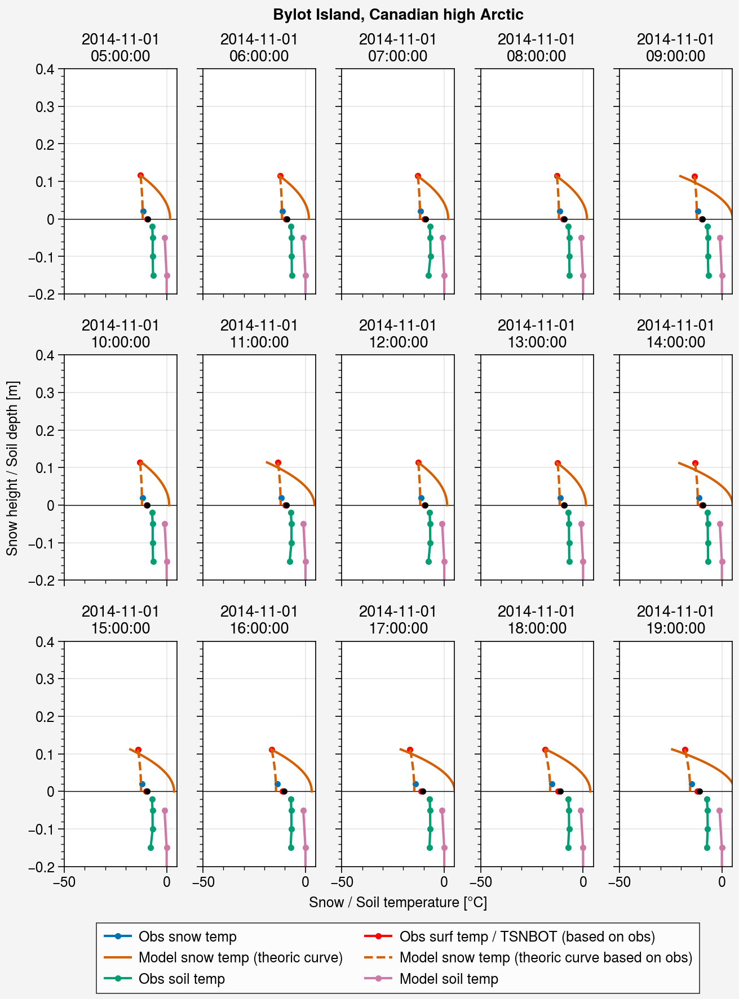

In [38]:
%matplotlib inline
import math
data_range = pd.date_range('2014-11-01 05:00', '2014-11-01 19:00', freq='h')
# data_range = pd.date_range('2017-02-01', '2017-02-16')
ncols = 5
fig, axs = pplt.subplots(refaspect=0.5, ncols=ncols, nrows=math.ceil(data_range.size/ncols), refwidth=1)

for i, date in enumerate(data_range):

    # From model
    z = np.linspace(0, ds_hh_list[0].sel(time=date).snd.squeeze())
    c = (ds_hh_list[0].sel(time=date).ts-273.15).values
    b = ((-3/ds_hh_list[0].sel(time=date).snd)*(c-ds_hh_list[0].sel(time=date).tsn.values)).values
    a = (-b/ds_hh_list[0].sel(time=date).snd).values
    tsn_theoric = T(z, a, b, c)

    # From obs
    z = np.linspace(0, ds_h_obs.sel(time=date).snd_auto.squeeze())
    c = (ds_h_obs.sel(time=date).ts).values
    b = ((-3/ds_h_obs.sel(time=date).snd_auto)*(c-ds_h_obs.sel(time=date).tsn.values)).values
    a = (-b/ds_h_obs.sel(time=date).snd_auto).values
    tsn_theoric_obs = T(z, a, b, c)
    
    axs[i].plot(ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight'), ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight, 
                label='Obs snow temp', marker='.')
    axs[i].plot(ds_h_obs.ts.sel(time=date), ds_h_obs.snd_auto.sel(time=date), label='Obs surf temp / TSNBOT (based on obs)', marker='.', color='red')

    axs[i].plot(tsn_theoric.squeeze(), z[::-1], label='Model snow temp (theoric curve)')
    axs[i].plot(tsn_theoric_obs.squeeze(), z[::-1], label='Model snow temp (theoric curve based on obs)', color='C1', ls='--')
    
    
    # axs[0].plot(ds_h_obs.tsl.sel(time=date, sdepth=0.02), -0.02, label='Soil', marker='.')
    axs[i].plot(ds_h_obs.tsl.sel(time=date), -ds_h_obs.sdepth, label='Obs soil temp', marker='.')
    axs[i].plot(ds_hh_list[0].tsl.sel(time=date)-273.15, -ds_hh_list[0].layer, label='Model soil temp', marker='.')
    axs[i].format(xlim=(-50, 5), ylim=(-0.2, 0.4), title=str(date)[:10]+'\n'+str(date)[11:])
    axs[i].hlines(0, -50, 5, color='k', lw=0.5)
    if i == 0: fig.legend(loc='b', ncols=2)


    # Check TSNBOT

    axs[i].vlines(ds_h_obs.tsn.sel(time=date).values, ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight[0], 
              ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight[-1], color='k', lw=0.5)
    
    ZSNOW = ds_h_obs.snd_auto.sel(time=date).values
    TSNOW = ds_h_obs.tsn.sel(time=date).values
    DELZ = 0.1 # Thickness of first soil layer (10 cm)
    # We could take the soil measurement at 0.05 (really similar at +-0.2°C when there is snow
    # -> here integral between the 0.02 to 0.1 measurement (to mimic the first model soil layer)
    # TBAR = ds_d_obs.tsl.sel(time=date, sdepth=0.05)
    TBAR = ds_h_obs.tsl.sel(time=date).where(ds_h_obs.tsl.sdepth <= 0.1, drop=True).integrate('sdepth')/(0.1-0.02)
    
    
    axs[i].vlines(TBAR, -0.1, -0.02, color='C2', lw=0.5)
    
    # https://gitlab.com/cccma/classic/-/blob/master/src/snowTempUpdate.f90?ref_type=heads#L139
    TSNBOT = (ZSNOW * TSNOW + DELZ * TBAR) / (ZSNOW + DELZ)
    axs[i].plot(TSNBOT, 0, label='TSNBOT (theoric)', marker='.', color='red')
    
    TSNBOT_obs = np.mean(np.append(ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight')[0].values, ds_h_obs.tsl.sel(time=date)[0].values))
    axs[i].plot(TSNBOT_obs, 0, label='TSNBOT (obs)', marker='.', color='black')

    axs[i].format(
        xlabel='Snow / Soil temperature [°C]',
        ylabel='Snow height / Soil depth [m]',
    )

fig.suptitle(site_longname)
# fig.save('img/'+site+'_snow_soil_temp_profiles_20260201.jpg')
    
# axs[0].format(xlabel='Snow Temperature (°C)', ylabel='Snow Depth (cm)', title=date,
#              lltitle='tsn_obs: {:.2f}'.format(tsn_obs)+' °C\ntsn_th: {:.2f}'.format(tsn_th.item(0))+' °C')

In [53]:
date - pd.to_timedelta('1h')

Timestamp('2015-05-01 18:00:00')

Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic')

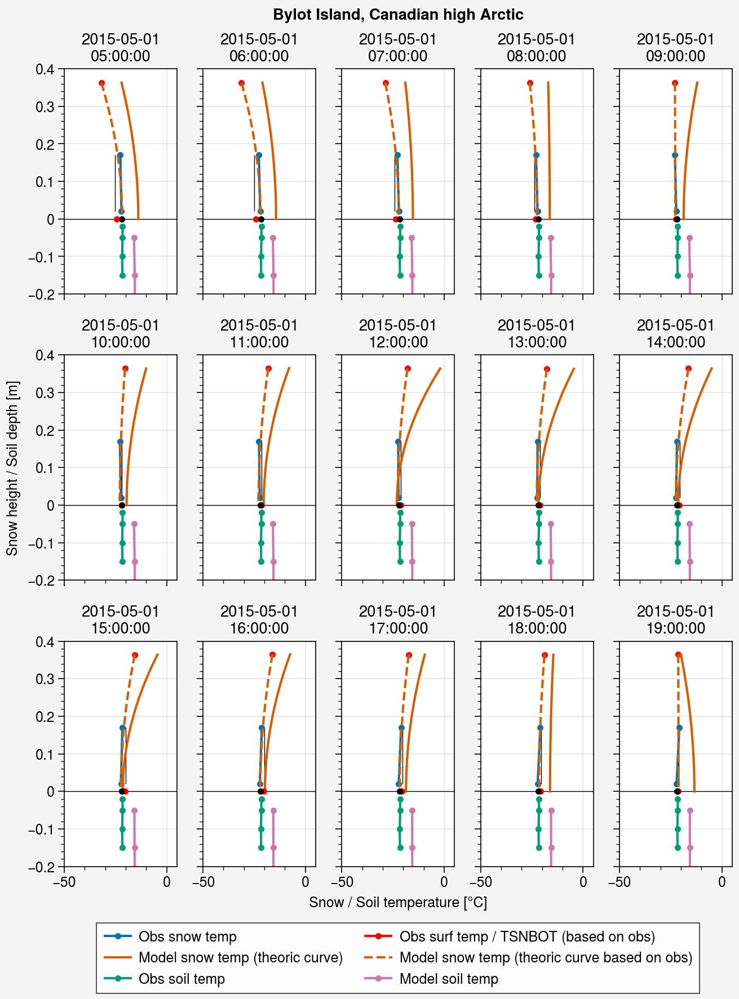

In [39]:
%matplotlib inline
import math
data_range = pd.date_range('2015-05-01 05:00', '2015-05-01 19:00', freq='h')
# data_range = pd.date_range('2017-02-01', '2017-02-16')
ncols = 5
fig, axs = pplt.subplots(refaspect=0.5, ncols=ncols, nrows=math.ceil(data_range.size/ncols), refwidth=1)

for i, date in enumerate(data_range):

    # From model
    z = np.linspace(0, ds_hh_list[0].sel(time=date).snd.squeeze())
    c = (ds_hh_list[0].sel(time=date).ts-273.15).values
    b = ((-3/ds_hh_list[0].sel(time=date).snd)*(c-ds_hh_list[0].sel(time=date).tsn.values)).values
    a = (-b/ds_hh_list[0].sel(time=date).snd).values
    tsn_theoric = T(z, a, b, c)

    # From obs
    z = np.linspace(0, ds_h_obs.sel(time=date).snd_auto.squeeze())
    c = (ds_h_obs.sel(time=date).ts).values
    b = ((-3/ds_h_obs.sel(time=date).snd_auto)*(c-ds_h_obs.sel(time=date).tsn.values)).values
    a = (-b/ds_h_obs.sel(time=date).snd_auto).values
    tsn_theoric_obs = T(z, a, b, c)
    
    axs[i].plot(ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight'), ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight, 
                label='Obs snow temp', marker='.')
    axs[i].plot(ds_h_obs.ts.sel(time=date), ds_h_obs.snd_auto.sel(time=date), label='Obs surf temp / TSNBOT (based on obs)', marker='.', color='red')

    axs[i].plot(tsn_theoric.squeeze(), z[::-1], label='Model snow temp (theoric curve)')
    axs[i].plot(tsn_theoric_obs.squeeze(), z[::-1], label='Model snow temp (theoric curve based on obs)', color='C1', ls='--')
    
    
    # axs[0].plot(ds_h_obs.tsl.sel(time=date, sdepth=0.02), -0.02, label='Soil', marker='.')
    axs[i].plot(ds_h_obs.tsl.sel(time=date), -ds_h_obs.sdepth, label='Obs soil temp', marker='.')
    axs[i].plot(ds_hh_list[0].tsl.sel(time=date)-273.15, -ds_hh_list[0].layer, label='Model soil temp', marker='.')
    axs[i].format(xlim=(-50, 5), ylim=(-0.2, 0.4), title=str(date)[:10]+'\n'+str(date)[11:])
    axs[i].hlines(0, -50, 5, color='k', lw=0.5)
    if i == 0: fig.legend(loc='b', ncols=2)


    # Check TSNBOT

    axs[i].vlines(ds_h_obs.tsn.sel(time=date).values, ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight[0], 
              ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight[-1], color='k', lw=0.5)
    
    ZSNOW = ds_h_obs.snd_auto.sel(time=date).values
    TSNOW = ds_h_obs.tsn.sel(time=date).values
    DELZ = 0.1 # Thickness of first soil layer (10 cm)
    # We could take the soil measurement at 0.05 (really similar at +-0.2°C when there is snow
    # -> here integral between the 0.02 to 0.1 measurement (to mimic the first model soil layer)
    # TBAR = ds_d_obs.tsl.sel(time=date, sdepth=0.05)
    TBAR = ds_h_obs.tsl.sel(time=date).where(ds_h_obs.tsl.sdepth <= 0.1, drop=True).integrate('sdepth')/(0.1-0.02)
    
    
    axs[i].vlines(TBAR, -0.1, -0.02, color='C2', lw=0.5)
    
    # https://gitlab.com/cccma/classic/-/blob/master/src/snowTempUpdate.f90?ref_type=heads#L139
    TSNBOT = (ZSNOW * TSNOW + DELZ * TBAR) / (ZSNOW + DELZ)
    axs[i].plot(TSNBOT, 0, label='TSNBOT (theoric)', marker='.', color='red')
    
    TSNBOT_obs = np.mean(np.append(ds_h_obs.tsnl.sel(time=date).dropna(dim='sheight')[0].values, ds_h_obs.tsl.sel(time=date)[0].values))
    axs[i].plot(TSNBOT_obs, 0, label='TSNBOT (obs)', marker='.', color='black')

    axs[i].format(
        xlabel='Snow / Soil temperature [°C]',
        ylabel='Snow height / Soil depth [m]',
    )

fig.suptitle(site_longname)
# fig.save('img/'+site+'_snow_soil_temp_profiles_20150501.jpg')
    
# axs[0].format(xlabel='Snow Temperature (°C)', ylabel='Snow Depth (cm)', title=date,
#              lltitle='tsn_obs: {:.2f}'.format(tsn_obs)+' °C\ntsn_th: {:.2f}'.format(tsn_th.item(0))+' °C')

#### Compute TSNBOT_TH for all timesteps
T(z) = 1/2az² + bz + c

z axis towards the bottom

In [78]:
tcs_hmean_hourly = tcs_hmean.resample(time='1h').interpolate()
tcs_hmean_hourly

<xarray.DataArray 'snd_auto' (time: 52153)> Size: 417kB
array([nan, nan, nan, ..., nan, nan, nan])
Coordinates:
  * time     (time) datetime64[ns] 417kB 2013-07-12 ... 2019-06-24
Attributes:
    long_name:  snowdepth, automatic measurement
    units:      m

In [76]:
ZSNOW

<xarray.DataArray 'snd_auto' (time: 52202)> Size: 418kB
array([0., 0., 0., ..., 0., 0., 0.])
Coordinates:
  * time     (time) datetime64[ns] 418kB 2013-07-11T09:00:00 ... 2019-06-25T1...
Attributes:
    long_name:  snowdepth, automatic measurement
    units:      m

In [83]:
tc_10_hourly = ds_obs_tc.tc.squeeze().resample(time='1h').interpolate()
tc_10_hourly

<xarray.DataArray 'tc' (time: 52153)> Size: 417kB
array([0.686033  , 0.68594123, 0.68584947, ..., 0.78873739, 0.78830536,
       0.78787333])
Coordinates:
    sdepth   float64 8B 0.1
  * time     (time) datetime64[ns] 417kB 2013-07-12 ... 2019-06-24
Attributes:
    long_name:  Thermal conductivity of soil
    units:      W m$^{-1}$ K$^{-1}$

In [110]:
tc_10_hourly_2 = 1.0 / (0.5 / tcs_hmean_hourly + 0.5 / tc_10_hourly)
tc_10_hourly_2

<xarray.DataArray (time: 52153)> Size: 417kB
array([nan, nan, nan, ..., nan, nan, nan])
Coordinates:
  * time     (time) datetime64[ns] 417kB 2013-07-12 ... 2019-06-24
    sdepth   float64 8B 0.1

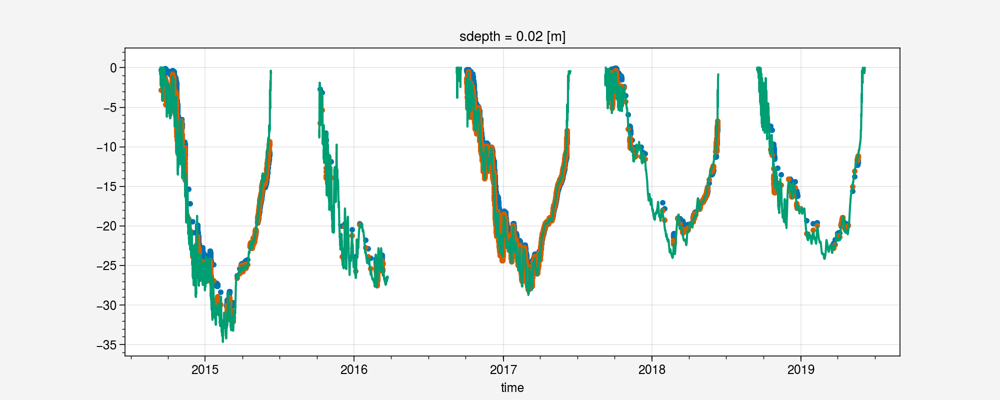

In [118]:
%matplotlib inline
plt.figure(figsize=(10, 4))
# TSNBOT_2.plot()
TSNBOT_2bis.plot(marker='.')
TSNBOT_2ter.plot(marker='.')
TSNBOT_obs.plot()

In [111]:
ZSNOW = ds_h_obs.snd_auto
TSNOW = ds_h_obs.tsn
DELZ = 0.1 # Thickness of first soil layer (10 cm)
# We could take the soil measurement at 0.05 (really similar at +-0.2°C when there is snow
# -> here integral between the 0.02 to 0.1 measurement (to mimic the first model soil layer)
# TBAR = ds_d_obs.tsl.sel(time=date, sdepth=0.05)
TBAR = ds_h_obs.tsl.where(ds_h_obs.tsl.sdepth <= 0.1, drop=True).integrate('sdepth')/(0.1-0.02)

# https://gitlab.com/cccma/classic/-/blob/master/src/snowTempUpdate.f90?ref_type=heads#L139
TSNBOT = (ZSNOW * TSNOW + DELZ * TBAR) / (ZSNOW + DELZ)
TSNBOT_2 = (TSNOW / ZSNOW  + TBAR / DELZ) / (1/ZSNOW + 1/DELZ)
TSNBOT_2bis = (TSNOW * tcs_hmean_hourly / ZSNOW  + TBAR * tc_10_hourly / DELZ) / (tcs_hmean_hourly/ZSNOW + tc_10_hourly/DELZ)
TSNBOT_2ter = (TSNOW * tcs_hmean_hourly / ZSNOW  + TBAR * tc_10_hourly_2 / DELZ) / (tcs_hmean_hourly/ZSNOW + tc_10_hourly_2/DELZ)
TSNBOT_3 = 0.1*TSNOW + 0.9*TBAR 
TSNBOT_4 = 0.2*TSNOW + 0.8*TBAR 
TSNBOT_5 = 0.3*TSNOW + 0.7*TBAR 

TSNBOT_obs = (ds_h_obs.tsnl.sel(sheight=0.02) + ds_h_obs.tsl.sel(sdepth=0.02))/2
TSNBOT_obs = TSNBOT_obs.combine_first(ds_h_obs.tsnl.sel(sheight=0.00)) # add the 2019 year with exact TSNBOT value

In [85]:
TSNBOT_2bis

<xarray.DataArray (time: 52153)> Size: 417kB
array([nan, nan, nan, ..., nan, nan, nan])
Coordinates:
  * time     (time) datetime64[ns] 417kB 2013-07-12 ... 2019-06-24
    sdepth   float64 8B 0.1

In [111]:
TSNBOT_obs

<xarray.DataArray (time: 52202)> Size: 418kB
array([nan, nan, nan, ..., nan, nan, nan])
Coordinates:
  * time     (time) datetime64[ns] 418kB 2013-07-11T09:00:00 ... 2019-06-25T1...
    sdepth   float64 8B 0.02

In [75]:
z = ds_h_obs.sel(time=date).snd_auto.squeeze().values.item(0)
c = (ds_h_obs.sel(time=date).ts).values
b = ((-3/ds_h_obs.sel(time=date).snd_auto)*(c-ds_h_obs.sel(time=date).tsn.values)).values
a = (-b/ds_h_obs.sel(time=date).snd_auto).values
tsn_theoric_obs = T(z, a, b, c)

In [769]:
ds_h_obs.sel(time=date).snd_auto.squeeze().values.item(0)

0.343

In [770]:
tsn_theoric_obs

-29.83432413300309

In [560]:
tsn_theoric_obs

-29.842607069177017

In [64]:
z = ds_h_obs.snd_auto.squeeze().values
c = (ds_h_obs.ts).values
b = ((-3/ds_h_obs.snd_auto)*(c-ds_h_obs.tsn.values)).values
a = (-b/ds_h_obs.snd_auto).values
tsn_theoric_obs = T(z, a, b, c)

In [65]:
z

array([0., 0., 0., ..., 0., 0., 0.])

In [66]:
tsn_theoric_obs

array([nan, nan, nan, ..., nan, nan, nan])

In [67]:
len(tsn_theoric_obs)

52202

In [68]:
TSNBOT_TH = TSNBOT.copy()
TSNBOT_TH.values = tsn_theoric_obs

In [69]:
TSNBOT_6 = 0.1*TSNBOT_TH + 0.9*TBAR 


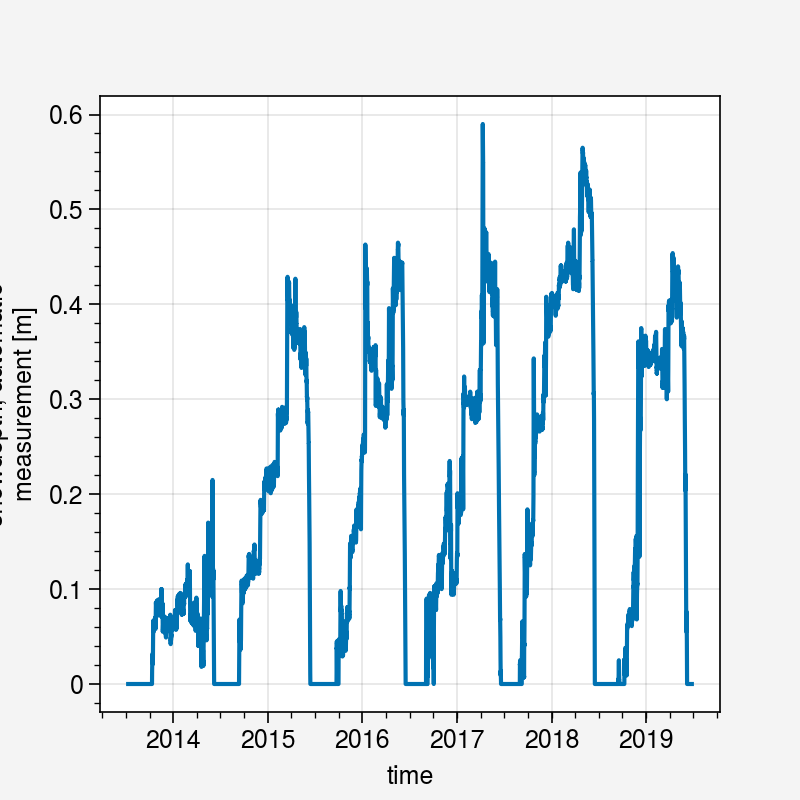

In [100]:
%matplotlib inline
ds_h_obs.shift(time=1).snd_auto.squeeze().plot()

In [101]:
z = ds_h_obs.shift(time=1).snd_auto.squeeze().values
c = (ds_h_obs.ts).values
b = ((-3/ds_h_obs.shift(time=1).snd_auto)*(c-ds_h_obs.shift(time=1).tsn.values)).values
a = (-b/ds_h_obs.shift(time=1).snd_auto).values
tsn_theoric_obs_2 = T(z, a, b, c)
tsn_theoric_obs_2

array([nan, nan, nan, ..., nan, nan, nan])

In [102]:
z

array([nan,  0.,  0., ...,  0.,  0.,  0.])

In [103]:
TSNBOT_TH_2 = TSNBOT.copy()
TSNBOT_TH_2.values = tsn_theoric_obs_2

In [562]:
tsn_theoric_obs

array([nan, nan, nan, ..., nan, nan, nan])

In [47]:
import xskillscore as xs

In [109]:
TSNBOT_obs

-21.790057535000003

In [532]:
TSNBOT

<xarray.DataArray (time: 52202)> Size: 418kB
array([nan, nan, nan, ..., nan, nan, nan])
Coordinates:
  * time     (time) datetime64[ns] 418kB 2013-07-11T09:00:00 ... 2019-06-25T1...

In [90]:
xs.rmse(TSNBOT, TSNBOT_obs, dim='time', skipna=True)

<xarray.DataArray ()> Size: 8B
array(4.28853597)
Coordinates:
    sdepth   float64 8B 0.02

In [86]:
xs.rmse(TSNBOT_2, TSNBOT_obs, dim='time', skipna=True)

<xarray.DataArray ()> Size: 8B
array(0.94598556)
Coordinates:
    sdepth   float64 8B 0.02

In [89]:
xs.rmse(TSNBOT_2bis, TSNBOT_obs.sel(time=TSNBOT_2bis.time), dim='time', skipna=True)

<xarray.DataArray ()> Size: 8B
array(1.96082525)

In [114]:
xs.rmse(TSNBOT_2ter, TSNBOT_obs.sel(time=TSNBOT_2bis.time), dim='time', skipna=True)

<xarray.DataArray ()> Size: 8B
array(0.61175759)

In [91]:
xs.rmse(TSNBOT, TSNBOT_TH, dim='time', skipna=True)

<xarray.DataArray ()> Size: 8B
array(2.43458174)

In [540]:
xs.mae(TSNBOT, TSNBOT_obs, dim='time', skipna=True).values

array(3.35041228)

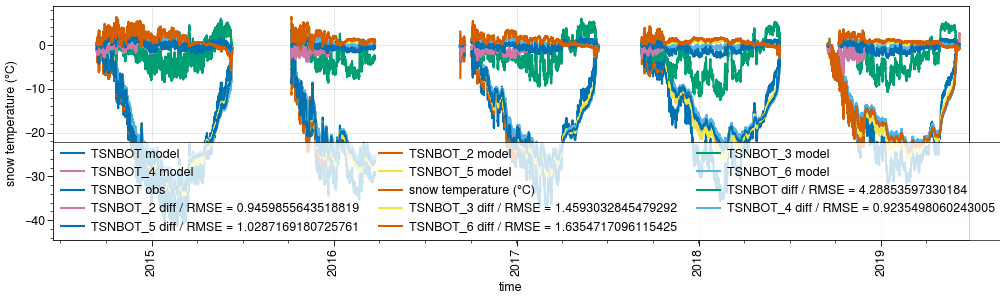

In [92]:
%matplotlib widget
fig, axs = pplt.subplots(figsize=(10,3))
ax = axs[0]
ax.plot(TSNBOT, label='TSNBOT model')
ax.plot(TSNBOT_2, label='TSNBOT_2 model')
ax.plot(TSNBOT_3, label='TSNBOT_3 model')
ax.plot(TSNBOT_4, label='TSNBOT_4 model')
ax.plot(TSNBOT_5, label='TSNBOT_5 model')
ax.plot(TSNBOT_6, label='TSNBOT_6 model')
ax.plot(TSNBOT_obs, label='TSNBOT obs')
ax.plot(ds_h_obs.tsnl.sel(sheight=0))

# RMSE
rmse = xs.rmse(TSNBOT, TSNBOT_obs, dim='time', skipna=True)
rmse_2 = xs.rmse(TSNBOT_2, TSNBOT_obs, dim='time', skipna=True)
rmse_3 = xs.rmse(TSNBOT_3, TSNBOT_obs, dim='time', skipna=True)
rmse_4 = xs.rmse(TSNBOT_4, TSNBOT_obs, dim='time', skipna=True)
rmse_5 = xs.rmse(TSNBOT_5, TSNBOT_obs, dim='time', skipna=True)
rmse_6 = xs.rmse(TSNBOT_6, TSNBOT_obs, dim='time', skipna=True)

ax.plot(TSNBOT-TSNBOT_obs, label='TSNBOT diff / RMSE = '+str(rmse.values.item(0)) )
ax.plot(TSNBOT_2-TSNBOT_obs, label='TSNBOT_2 diff / RMSE = '+str(rmse_2.values.item(0)) )
ax.plot(TSNBOT_3-TSNBOT_obs, label='TSNBOT_3 diff / RMSE = '+str(rmse_3.values.item(0)) )
ax.plot(TSNBOT_4-TSNBOT_obs, label='TSNBOT_4 diff / RMSE = '+str(rmse_4.values.item(0)) )
ax.plot(TSNBOT_5-TSNBOT_obs, label='TSNBOT_5 diff / RMSE = '+str(rmse_5.values.item(0)) )
ax.plot(TSNBOT_6-TSNBOT_obs, label='TSNBOT_6 diff / RMSE = '+str(rmse_6.values.item(0)) )

ax.legend()


In [549]:
tsn_theoric_obs[-1]

-29.842607069177017

In [564]:
TSNBOT

<xarray.DataArray (time: 52202)> Size: 418kB
array([nan, nan, nan, ..., nan, nan, nan])
Coordinates:
  * time     (time) datetime64[ns] 418kB 2013-07-11T09:00:00 ... 2019-06-25T1...

In [565]:
len(tsn_theoric_obs)

52202

Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic')

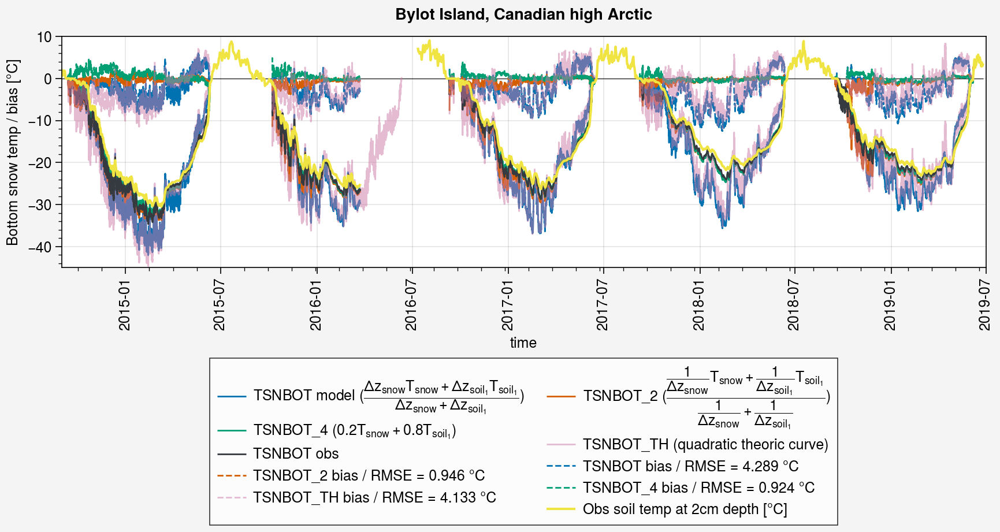

In [97]:
%matplotlib inline
fig, axs = pplt.subplots(refaspect=4, refwidth=8)
ax = axs[0]
ax.plot(TSNBOT, lw=1, label='TSNBOT model ($\dfrac{\Delta z_{snow} T_{snow} + \Delta z_{soil_1} T_{soil_1}}{\Delta z_{snow} + \Delta z_{soil_1}}$)')
ax.plot(TSNBOT_2, lw=1, label='TSNBOT_2 ($\dfrac{ \dfrac{1}{\Delta z_{snow}} T_{snow} + \dfrac{1}{\Delta z_{soil_1}} T_{soil_1}}{\dfrac{1}{\Delta z_{snow}} + \dfrac{1}{\Delta z_{soil_1}}}$)')
# ax.plot(TSNBOT_2bis, lw=1, label='TSNBOT_2bis ($\dfrac{ \dfrac{1}{\Delta z_{snow}} T_{snow} + \dfrac{1}{\Delta z_{soil_1}} T_{soil_1}}{\dfrac{1}{\Delta z_{snow}} + \dfrac{1}{\Delta z_{soil_1}}}$)')
ax.plot(TSNBOT_4, lw=1, label='TSNBOT_4 ($0.2 T_{snow} + 0.8 T_{soil_1}$)')
ax.plot(TSNBOT_TH, lw=1, label='TSNBOT_TH (quadratic theoric curve)', alpha=0.5)
# ax.plot(TSNBOT_TH_2, lw=1, label='TSNBOT_TH_2 (quadratic theoric curve)', alpha=0.5)
ax.plot(TSNBOT_obs, lw=1, label='TSNBOT obs', color=color_obs)


# RMSE
rmse = xs.rmse(TSNBOT, TSNBOT_obs, dim='time', skipna=True)
rmse_2 = xs.rmse(TSNBOT_2, TSNBOT_obs, dim='time', skipna=True)
rmse_4 = xs.rmse(TSNBOT_4, TSNBOT_obs, dim='time', skipna=True)
rmse_th = xs.rmse(TSNBOT_TH, TSNBOT_obs, dim='time', skipna=True)
# rmse_th_2 = xs.rmse(TSNBOT_TH_2, TSNBOT_obs, dim='time', skipna=True)

ax.plot(TSNBOT-TSNBOT_obs, label='TSNBOT bias / RMSE = '+str(round(rmse.values.item(0),3))+' °C', color='C0', ls='--', lw=1)
ax.plot(TSNBOT_2-TSNBOT_obs, label='TSNBOT_2 bias / RMSE = '+str(round(rmse_2.values.item(0),3))+' °C', color='C1', ls='--', lw=1)
ax.plot(TSNBOT_4-TSNBOT_obs, label='TSNBOT_4 bias / RMSE = '+str(round(rmse_4.values.item(0),3))+' °C', color='C2', ls='--', lw=1)
ax.plot(TSNBOT_TH-TSNBOT_obs, label='TSNBOT_TH bias / RMSE = '+str(round(rmse_th.values.item(0),3))+' °C', alpha=0.5, color='C3', ls='--', lw=1)
# ax.plot(TSNBOT_TH_2-TSNBOT_obs, label='TSNBOT_TH_2 bias / RMSE = '+str(round(rmse_th_2.values.item(0),3))+' °C', alpha=0.5, color='C3', ls='--', lw=1)

ax.plot(ds_d_obs.tsl.sel(sdepth=0.02), label='Obs soil temp at 2cm depth [°C]')


ax.hlines(0, TSNBOT_obs.time[0], TSNBOT_obs.time[-1], color='k', lw=0.5, alpha=0.8)

ax.legend(loc='b', ncols=2)
ax.format(ylabel='Bottom snow temp / bias [°C]', ylim=(-45, 10), xlim=(pd.to_datetime('2014-09'), pd.to_datetime('2019-07')))

fig.suptitle(site_longname)
# fig.save('img/'+site+'_tsnbot_2015-2019.jpg')

<a list of 1 Line2D objects>

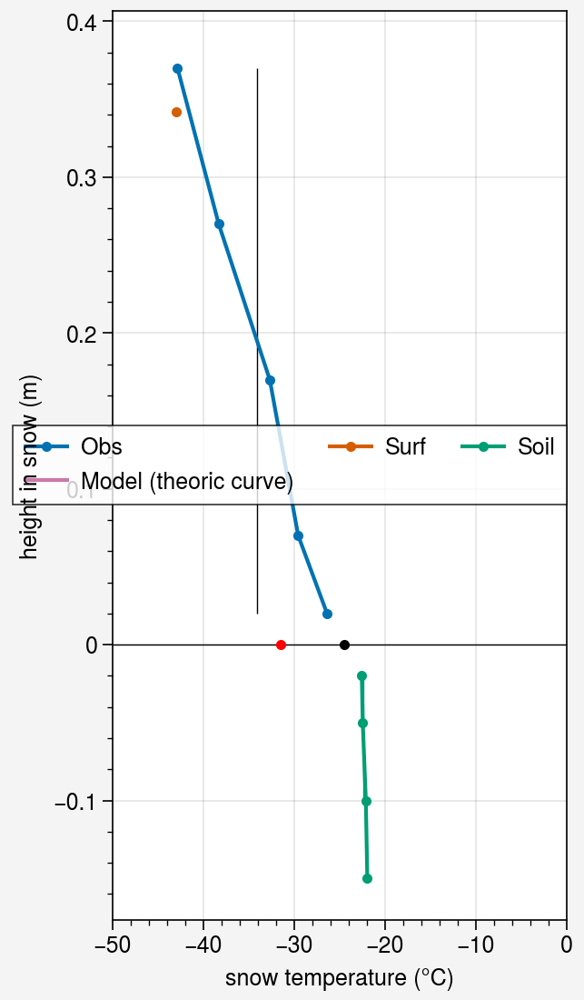

In [487]:
%matplotlib inline
fig, axs = pplt.subplots(refaspect=0.5)

date = '2016-02-01'
axs[0].plot(ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight'), ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight, label='Obs', marker='.')
axs[0].plot(ds_d_obs.ts.sel(time=date), ds_d_obs.snd_auto.sel(time=date), label='Surf', marker='.')
# axs[0].plot(ds_d_obs.tsl.sel(time=date, sdepth=0.02), -0.02, label='Soil', marker='.')
axs[0].plot(ds_d_obs.tsl.sel(time=date), -ds_d_obs.sdepth, label='Soil', marker='.')
axs[0].plot(tsn_theoric.squeeze()-273.15, z[::-1], label='Model (theoric curve)')
axs[0].legend()
axs[0].format(xlim=(-50, 0))
axs[0].hlines(0, -50, 0, color='k', lw=0.5)



# Check TSNBOT

axs[0].vlines(ds_d_obs.tsn.sel(time=date).values, ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight[0], 
              ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight').sheight[-1], color='k', lw=0.5)

ZSNOW = ds_d_obs.snd_auto.sel(time=date).values
TSNOW = ds_d_obs.tsn.sel(time=date).values
DELZ = 0.1 # Thickness of first soil layer (10 cm)
# We could take the soil measurement at 0.05 (really similar at +-0.2°C when there is snow
# -> here integral between the 0.02 to 0.1 measurement (to mimic the first model soil layer)
# TBAR = ds_d_obs.tsl.sel(time=date, sdepth=0.05)
TBAR = ds_d_obs.tsl.sel(time=date).where(ds_d_obs.tsl.sdepth <= 0.1, drop=True).integrate('sdepth')/(0.1-0.02)


axs[0].vlines(TBAR, -0.1, -0.02, color='C2', lw=0.5)

# https://gitlab.com/cccma/classic/-/blob/master/src/snowTempUpdate.f90?ref_type=heads#L139
TSNBOT = (ZSNOW * TSNOW + DELZ * TBAR) / (ZSNOW + DELZ)
axs[0].plot(TSNBOT, 0, label='TSNBOT (theoric)', marker='.', color='red')

TSNBOT_obs = np.mean(np.append(ds_d_obs.tsnl.sel(time=date).dropna(dim='sheight')[0].values, ds_d_obs.tsl.sel(time=date)[0].values))
axs[0].plot(TSNBOT_obs, 0, label='TSNBOT (obs)', marker='.', color='black')


# axs[0].format(xlabel='Snow Temperature (°C)', ylabel='Snow Depth (cm)', title=date,
#              lltitle='tsn_obs: {:.2f}'.format(tsn_obs)+' °C\ntsn_th: {:.2f}'.format(tsn_th.item(0))+' °C')

### Volumetric water content

https://medium.com/@wenzhao.li1989/soil-moisture-convert-mm-kg-m-2-and-m%C2%B3-m-3-e52be1fe98ef

The NCA-LDAS dataset currently provide soil moisture values in units of [m³ m-3] for volumetric soil moisture. To convert to units of [kg m-2] for the total soil moisture amount in each layer, all you do is multiply the [m³ m-3] value by the thickness of the layer in [mm].

<a list of 5 Line2D objects>

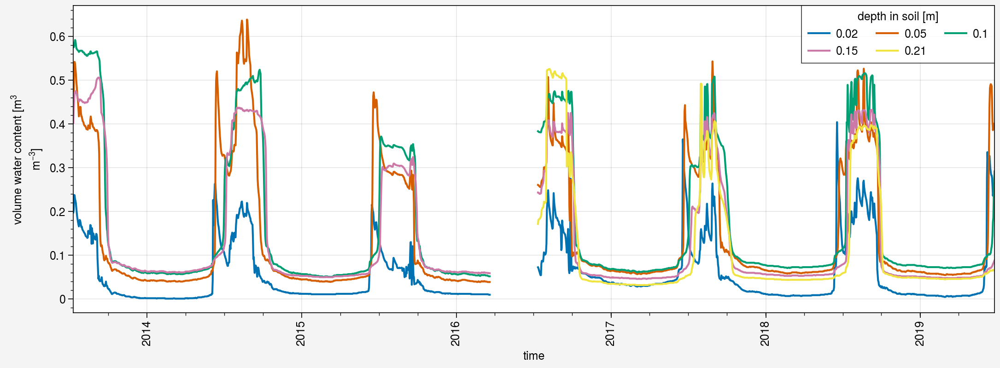

In [695]:
%matplotlib inline
fig, axs = pplt.subplots(refwidth=10, refaspect=3)
ds_d_obs.mrsll.plot(hue='sdepth')

In [706]:
ds_d_obs.mrsll.sel(time=period).sel(sdepth=[0.02, 0.05, 0.1])

<xarray.DataArray 'mrsll' (time: 2155, sdepth: 3)> Size: 52kB
array([[0.16045833, 0.41129167, 0.56691667],
       [0.15779167, 0.40670833, 0.564875  ],
       [0.1565    , 0.405625  , 0.56391667],
       ...,
       [0.24070833, 0.38966667, 0.23220833],
       [0.25520833, 0.401125  , 0.27229167],
       [0.24736364, 0.39409091, 0.29190909]])
Coordinates:
  * sdepth   (sdepth) float64 24B 0.02 0.05 0.1
  * time     (time) datetime64[ns] 17kB 2013-08-01 2013-08-02 ... 2019-06-25
Attributes:
    long_name:  volume water content
    units:      m$^3$ m$^{-3}$

In [716]:
ds_d_obs.mrsll.sel(time=period)

<xarray.DataArray 'mrsll' (time: 2155, sdepth: 5)> Size: 86kB
array([[0.16045833, 0.41129167, 0.56691667, 0.451875  ,        nan],
       [0.15779167, 0.40670833, 0.564875  , 0.45020833,        nan],
       [0.1565    , 0.405625  , 0.56391667, 0.449625  ,        nan],
       ...,
       [0.24070833, 0.38966667, 0.23220833, 0.083875  , 0.06629167],
       [0.25520833, 0.401125  , 0.27229167, 0.08654167, 0.065     ],
       [0.24736364, 0.39409091, 0.29190909, 0.08872727, 0.066     ]])
Coordinates:
  * sdepth   (sdepth) float64 40B 0.02 0.05 0.1 0.15 0.21
  * time     (time) datetime64[ns] 17kB 2013-08-01 2013-08-02 ... 2019-06-25
Attributes:
    long_name:  volume water content
    units:      m$^3$ m$^{-3}$

In [709]:
ds_d_obs.mrsll.sel(time=period).sel(sdepth=[0.02, 0.05, 0.1]).integrate('sdepth')

<xarray.DataArray 'mrsll' (time: 2155)> Size: 17kB
array([0.03303146, 0.03275708, 0.03267042, ..., 0.0250025 , 0.02668042,
       0.02677182])
Coordinates:
  * time     (time) datetime64[ns] 17kB 2013-08-01 2013-08-02 ... 2019-06-25

<a list of 1 Line2D objects>

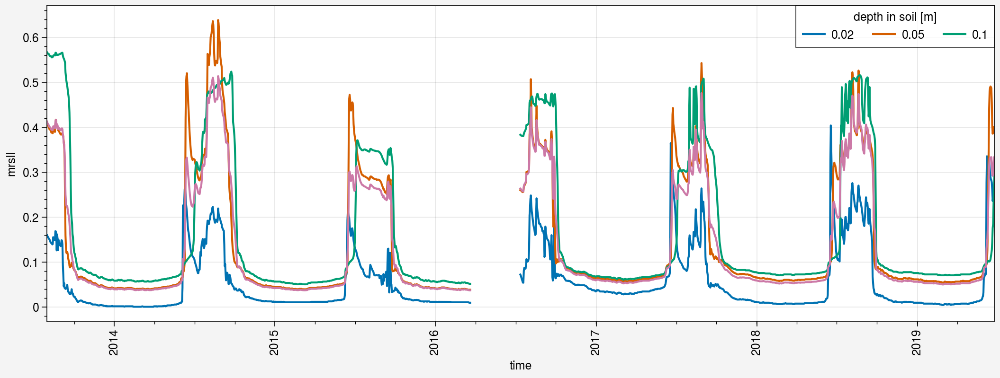

In [714]:
%matplotlib inline
fig, axs = pplt.subplots(refwidth=10, refaspect=3)
ds_d_obs.mrsll.sel(time=period).sel(sdepth=[0.02, 0.05, 0.1]).plot(hue='sdepth')
(ds_d_obs.mrsll.sel(time=period).sel(sdepth=[0.02, 0.05, 0.1]).integrate('sdepth')/(0.1-0.02)).plot()

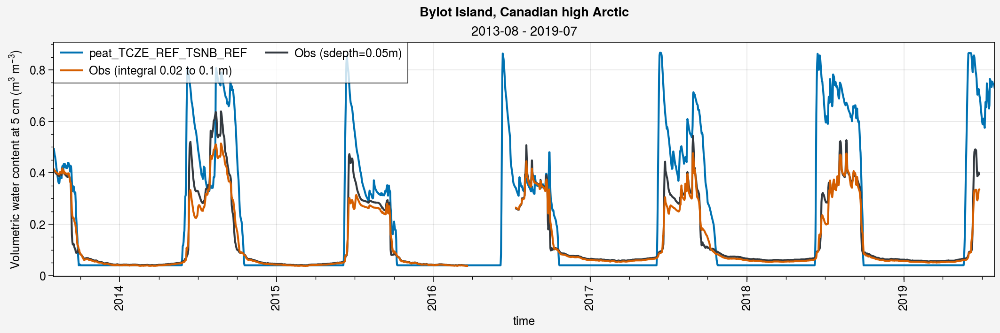

In [715]:
%matplotlib inline
gap = 6
color_obs = 'gray8'
sdepth = 0.05
sdepth_label = str(int(sdepth*100))

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.mrsll.sel(time=period).sel(layer=sdepth)/100, label=label)
        
    # Obs
    axs[0].plot(ds_d_obs.mrsll.sel(time=period, sdepth=sdepth), color=color_obs, label='Obs (sdepth=0.05m)')
    axs[0].plot((ds_d_obs.mrsll.sel(time=period).sel(sdepth=[0.02, 0.05, 0.1]).integrate('sdepth')/(0.1-0.02)), label='Obs (integral 0.02 to 0.1 m)')
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Volumetric water content at '+sdepth_label+' cm (m$^3$ m$^{-3}$)')
    
    fig.suptitle(site_longname)


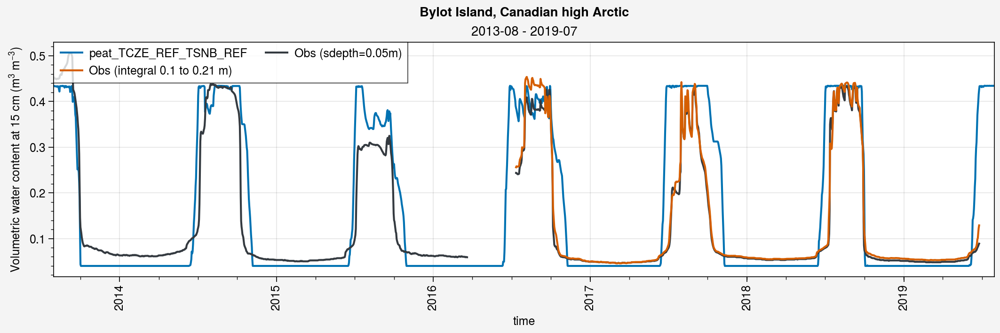

In [717]:
%matplotlib inline
gap = 6
color_obs = 'gray8'
sdepth = 0.15
sdepth_label = str(int(sdepth*100))

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.mrsll.sel(time=period).sel(layer=sdepth, method='nearest')/100, label=label)
        
    # Obs
    axs[0].plot(ds_d_obs.mrsll.sel(time=period, sdepth=sdepth), color=color_obs, label='Obs (sdepth=0.05m)')
    axs[0].plot((ds_d_obs.mrsll.sel(time=period).sel(sdepth=[0.1, 0.15, 0.21]).integrate('sdepth')/(0.21-0.1)), label='Obs (integral 0.1 to 0.21 m)')
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Volumetric water content at '+sdepth_label+' cm (m$^3$ m$^{-3}$)')
    
    fig.suptitle(site_longname)


### Thermal conductivity

<a list of 1 Line2D objects>

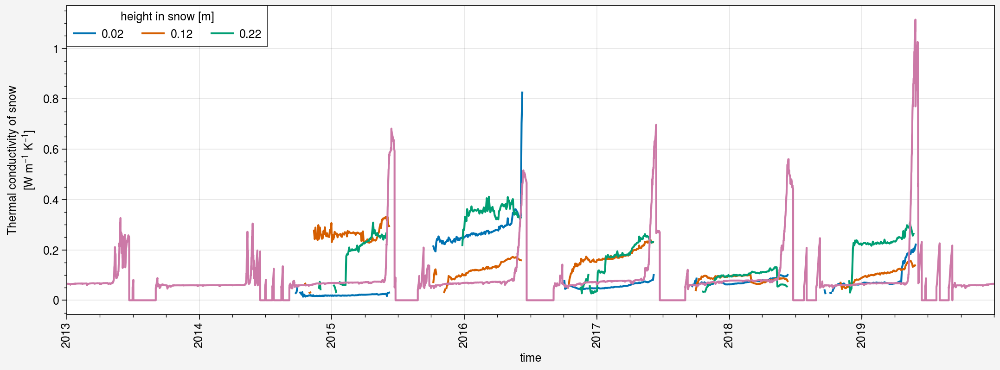

In [787]:
%matplotlib inline
fig, axs = pplt.subplots(refwidth=10, refaspect=3)
ds_obs_tc.tcs.plot(hue='sheight')
ds_hh_list[0].tcsnow.plot()

#### Compute the effective thermal conductivity

In [70]:
sd = ds_d_obs.snd_auto.sel(time=ds_obs_tc.tcs.time)
z1 = sd.copy(); z2 = sd.copy(); z3 = sd.copy()
z1.values = [0.02]*sd.size
z2.values = [0.12]*sd.size
z3.values = [0.22]*sd.size

dz1 = (z1 + z2)/2
dz2 = (z2 + z3)/2 - z1
dz3 = sd - (z2 + z3)/2

# Keep only values for sd higher than the sensor height
dz3 = dz3.where(z3 < sd)
dz2 = dz2.where(z2 < sd)
dz1 = dz1.where(z1 < sd)

In [71]:
tcs_hmean = sd.copy()
tcs_hmean.values = stats.hmean(ds_obs_tc.tcs, weights=[dz1, dz2, dz3], nan_policy='omit')
tcs_hmean

<xarray.DataArray 'snd_auto' (time: 1090)> Size: 9kB
array([nan, nan, nan, ..., nan, nan, nan])
Coordinates:
  * time     (time) datetime64[ns] 9kB 2013-07-12 2013-07-14 ... 2019-06-24
Attributes:
    long_name:  snowdepth, automatic measurement
    units:      m

Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic')

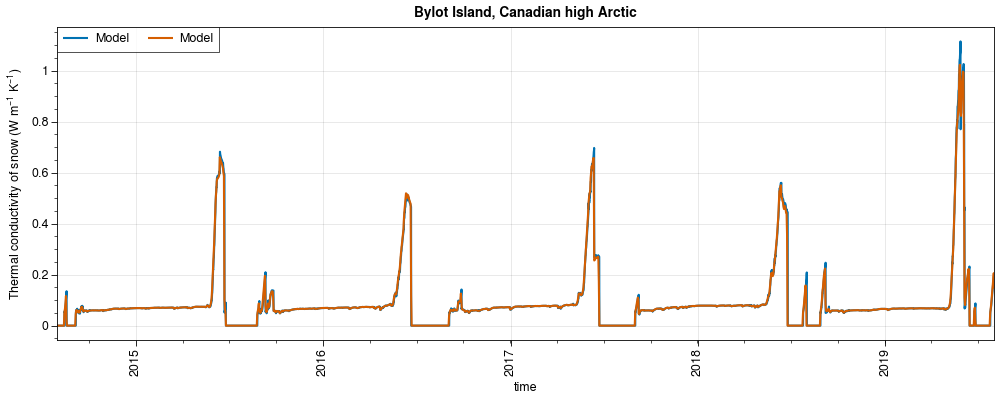

In [101]:
%matplotlib widget
# fig, axs = pplt.subplots(refwidth=8, refaspect=3.5)
fig, axs = pplt.subplots(figsize=(10,4))

period = slice('2014-08', '2019-08')

ax = axs[0]
ax.plot(ds_hh_list[0].tcsnow.sel(time=period), label='Model')
ax.plot(ds_d_list[0].tcsnow.sel(time=period), label='Model')
# ax.plot(tcs_hmean.sel(time=period), label='Obs (hmean)', color=color_obs)
# ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.02), label='Obs (2 cm)', lw=1)
# ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.12), label='Obs (12 cm)', lw=1)
# ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.22), label='Obs (22 cm)', lw=1)

ax.format(
    xlim=(pd.to_datetime(period.start), pd.to_datetime(period.stop)),
)
ax.legend(ncols=5)
fig.suptitle(site_longname)
# fig.save('img/'+site+'_tcsnow_2014-2019.jpg')

Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic')

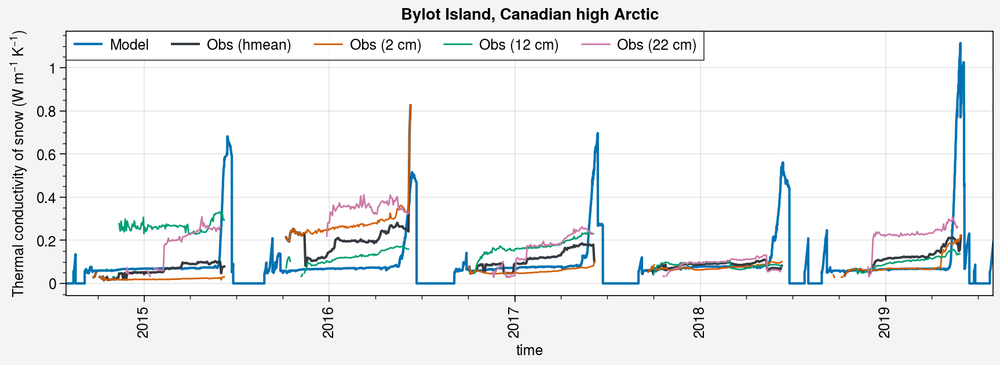

In [72]:
%matplotlib inline
fig, axs = pplt.subplots(refwidth=8, refaspect=3.5)
# fig, axs = pplt.subplots(figsize=(10,4))

period = slice('2014-08', '2019-08')

ax = axs[0]
ax.plot(ds_hh_list[0].tcsnow.sel(time=period), label='Model')
ax.plot(tcs_hmean.sel(time=period), label='Obs (hmean)', color=color_obs)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.02), label='Obs (2 cm)', lw=1)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.12), label='Obs (12 cm)', lw=1)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.22), label='Obs (22 cm)', lw=1)

ax.format(
    xlim=(pd.to_datetime(period.start), pd.to_datetime(period.stop)),
)
ax.legend(ncols=5)
fig.suptitle(site_longname)
# fig.save('img/'+site+'_tcsnow_2014-2019.jpg')

In [743]:
ds_d_list[0].layer

<xarray.DataArray 'layer' (layer: 20)> Size: 160B
array([5.00e-02, 1.50e-01, 2.50e-01, 3.50e-01, 4.50e-01, 5.50e-01, 6.50e-01,
       7.50e-01, 8.50e-01, 9.50e-01, 1.10e+00, 1.35e+00, 1.70e+00, 2.15e+00,
       2.90e+00, 4.90e+00, 8.90e+00, 1.89e+01, 4.14e+01, 5.89e+01])
Coordinates:
  * layer    (layer) float64 160B 0.05 0.15 0.25 0.35 ... 8.9 18.9 41.4 58.9
Attributes:
    long_name:  soil layer
    units:      layer

In [746]:
ds_d_list[0].tctop.sel(layer=[0.05, 0.15, 0.25], method='nearest')

<xarray.DataArray 'tctop' (time: 2556, layer: 3)> Size: 61kB
array([[nan, nan, nan],
       [nan, nan, nan],
       [nan, nan, nan],
       ...,
       [nan, nan, nan],
       [nan, nan, nan],
       [nan, nan, nan]])
Coordinates:
  * time     (time) datetime64[ns] 20kB 2013-01-01 2013-01-02 ... 2019-12-31
  * layer    (layer) float64 24B 0.05 0.15 0.25
Attributes:
    long_name:   Thermal conductivity of soil at top of layer
    units:       W m$^{-1}$ K$^{-1}$
    nameInCode:  tctop_d

In [750]:
tctop = ds_hh_list[0].tctop.resample(time='d').mean()
tcbot = ds_hh_list[0].tcbot.resample(time='d').mean()

In [102]:
ds_hh_list[0].tctop

<xarray.DataArray 'tctop' (time: 122688, layer: 20)> Size: 20MB
array([[0.12676896, 2.2850287 , 2.29015335, ..., 2.5       , 2.5       ,
        2.5       ],
       [0.12677073, 2.2850287 , 2.29015335, ..., 2.5       , 2.5       ,
        2.5       ],
       [0.12677283, 2.2850287 , 2.29015335, ..., 2.5       , 2.5       ,
        2.5       ],
       ...,
       [0.1268277 , 2.28492153, 2.29017643, ..., 2.5       , 2.5       ,
        2.5       ],
       [0.12682969, 2.28492153, 2.29017643, ..., 2.5       , 2.5       ,
        2.5       ],
       [0.12683171, 2.28492153, 2.29017643, ..., 2.5       , 2.5       ,
        2.5       ]])
Coordinates:
  * time     (time) datetime64[ns] 982kB 2013-01-01 ... 2019-12-31T23:30:00
  * layer    (layer) float64 160B 0.05 0.15 0.25 0.35 ... 8.9 18.9 41.4 58.9
Attributes:
    long_name:   Thermal conductivity of soil at top of layer
    units:       W m$^{-1}$ K$^{-1}$
    nameInCode:  tctop_hh

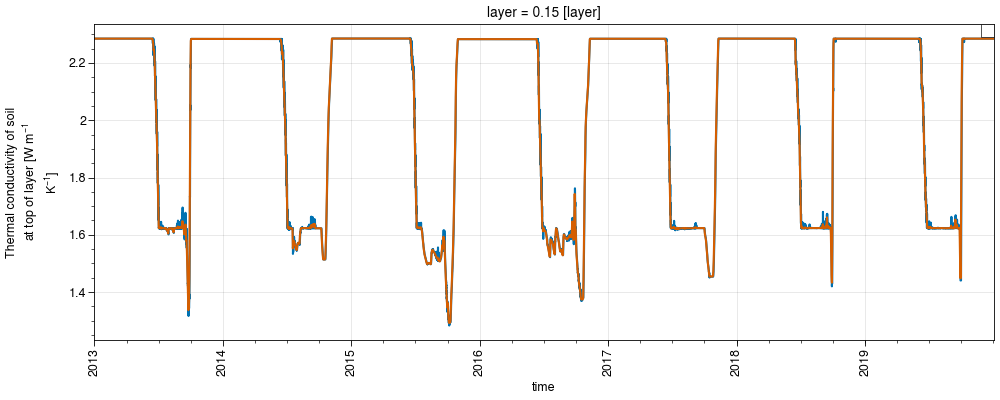

In [109]:
%matplotlib widget
# fig, axs = pplt.subplots(refwidth=10, refaspect=3)
fig, axs = pplt.subplots(figsize=(10,4))

# ds_obs_tc.tc.plot(label='TC at 10 cm depth')
# tctop.sel(layer=[0.05, 0.15, 0.25], method='nearest').plot(hue='layer')
ds_hh_list[0].tctop.sel(layer=0.15, method='nearest').plot()
ds_d_list[0].tctop.sel(layer=0.15, method='nearest').plot()
axs[0].legend()

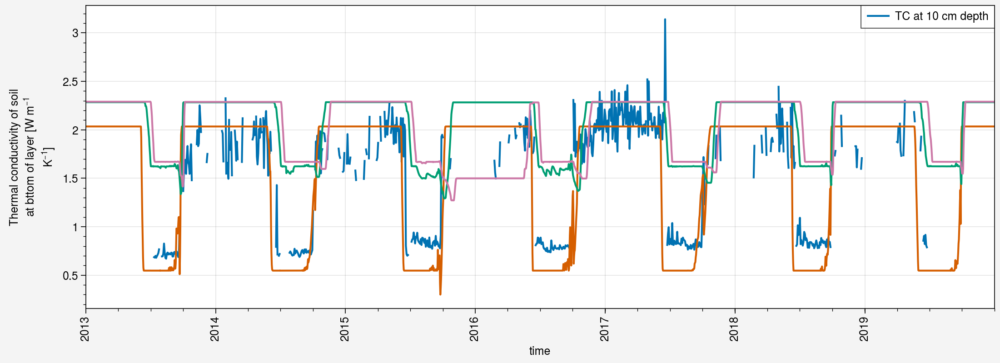

In [756]:
%matplotlib inline
fig, axs = pplt.subplots(refwidth=10, refaspect=3)
ds_obs_tc.tc.plot(label='TC at 10 cm depth')
# tctop.sel(layer=[0.05, 0.15, 0.25], method='nearest').plot(hue='layer')
tcbot.sel(layer=[0.05, 0.15, 0.25], method='nearest').plot(hue='layer')
axs[0].legend()

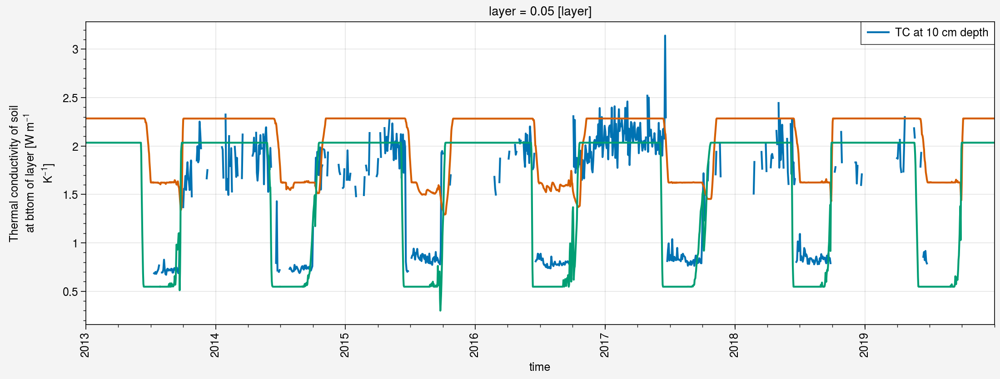

In [757]:
%matplotlib inline
fig, axs = pplt.subplots(refwidth=10, refaspect=3)
ds_obs_tc.tc.plot(label='TC at 10 cm depth')
tctop.sel(layer=0.15, method='nearest').plot(hue='layer')
tcbot.sel(layer=0.05, method='nearest').plot(hue='layer')

axs[0].legend()

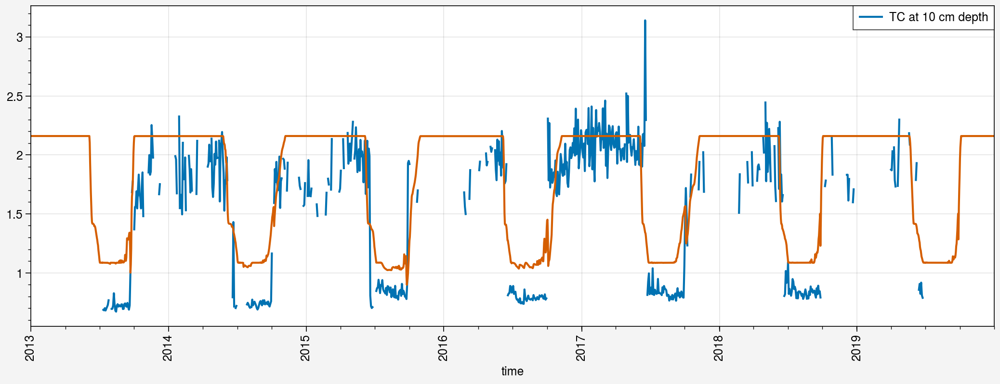

In [758]:
%matplotlib inline
fig, axs = pplt.subplots(refwidth=10, refaspect=3)
ds_obs_tc.tc.plot(label='TC at 10 cm depth')
(0.5*tctop.sel(layer=0.15, method='nearest') + 0.5*tcbot.sel(layer=0.05, method='nearest')).plot(hue='layer')

axs[0].legend()

## All 

In [931]:
ds_obs_tc.tc.sel(sdepth=0.1)

<xarray.DataArray 'tc' (time: 1090)> Size: 9kB
array([0.686033  , 0.68162838, 0.70026597, ..., 0.9168309 , 0.80861084,
       0.78787333])
Coordinates:
  * time     (time) datetime64[ns] 9kB 2013-07-12 2013-07-14 ... 2019-06-24
    sdepth   float64 8B 0.1
Attributes:
    long_name:  Thermal conductivity of soil
    units:      W m$^{-1}$ K$^{-1}$

In [937]:
ds_d_obs.tsl

<xarray.DataArray 'tsl' (time: 2176, sdepth: 5)> Size: 87kB
array([[ 6.49733333,  3.928     ,  1.35666667,  0.38933333,         nan],
       [ 4.31208333,  2.74625   ,  1.28666667,  0.39875   ,         nan],
       [ 4.26333333,  2.69166667,  1.13833333,  0.43      ,         nan],
       ...,
       [ 3.85416667,  2.64125   ,  0.25291667,  0.79      , -0.3       ],
       [ 2.94666667,  2.07041667,  0.20333333,  0.79      , -0.28333333],
       [ 3.30545455,  2.31181818,  0.16818182,  0.79      , -0.3       ]])
Coordinates:
  * sdepth   (sdepth) float64 40B 0.02 0.05 0.1 0.15 0.21
  * time     (time) datetime64[ns] 17kB 2013-07-11 2013-07-12 ... 2019-06-25
Attributes:
    long_name:  soil temperature
    units:      °C

/tmp/ipykernel_16306/4150530559.py:66: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked x (y) limits only. Error message: ufunc 'greater_equal' did not contain a loop with signature matching types (<class 'numpy.dtypes.DateTime64DType'>, <class 'numpy.dtypes.Float64DType'>) -> None
  ax.plot(ds_hh_list[0].tcsnow.sel(time=period), label='Model')
/tmp/ipykernel_16306/4150530559.py:67: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked x (y) limits only. Error message: ufunc 'greater_equal' did not contain a loop with signature matching types (<class 'numpy.dtypes.DateTime64DType'>, <class 'numpy.dtypes.Float64DType'>) -> None
  ax.plot(tcs_hmean.sel(time=period), label='Obs (hmean)', color=color_obs)
/tmp/ipykernel_16306/4150530559.py:68: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked x (y) limits only. Error message: ufunc 'greater_equal' did not contain

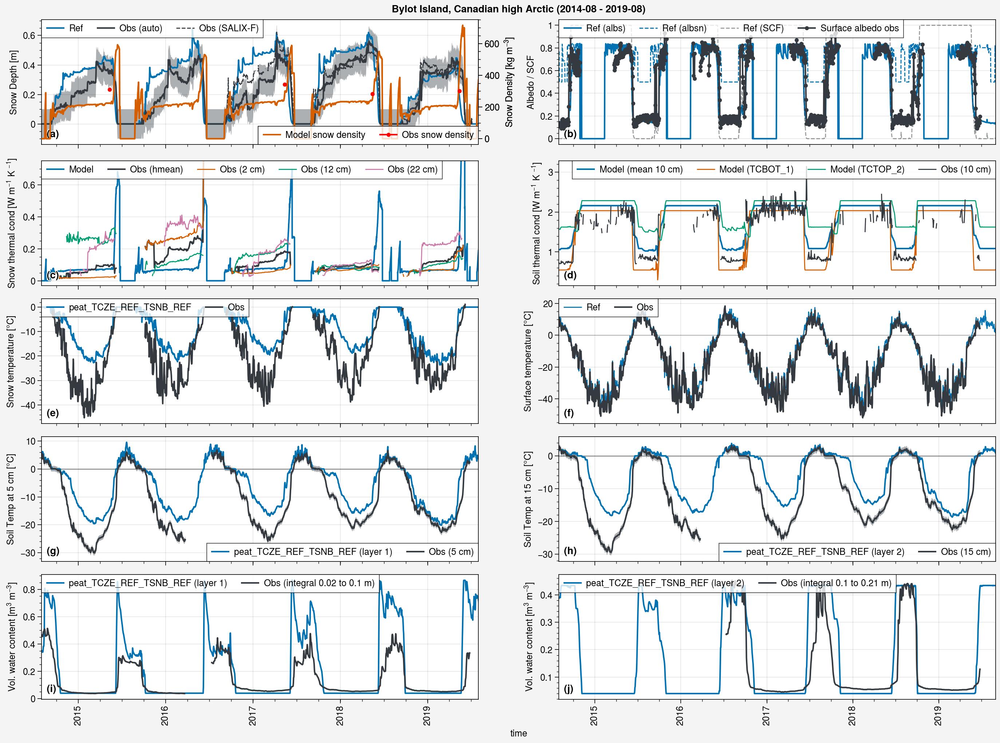

In [946]:
%matplotlib inline
color_obs = 'gray8'
period = slice('2014-08', '2019-08')

# fig, axs = pplt.subplots(nrows=3, ncols=2, refaspect=3.5, sharey=0, figsize=(9,6))
fig, axs = pplt.subplots(nrows=5, ncols=2, refaspect=3.5, refwidth=6, sharey=0)
k = 0
##################
### Snow Depth ###
##################
ax = axs[k]
# Simus
for ds_d, label in zip(ds_d_list, ['Ref']):
    ax.plot(ds_d.snd.sel(time=period), label=label)
    # axs[0].plot(ds_d.snc.sel(time=period), label=label+' (SCF)', color='k', alpha=0.5)

ox = ax.alty(label='Snow Density [kg m$^{-3}$]')
ox.plot(ds_d_list[0].sel(time=period).snwdens, color='C1', label='Model snow density')
for i, tundra_df in enumerate(df_list_tundra):
    dz = tundra_df['Height cm'].iloc[0]-tundra_df['Height cm'].iloc[-1]
    ox.plot(ds_d_obs.sel(time=tundra_df.index[0]).time, 
            np.trapz(tundra_df['Density kg m-3'], -tundra_df['Height cm'])/dz, 
            marker='.', color='red', label='Obs snow density')
    if i == 0: ox.legend(loc='lr')
        
# ox = ax.alty(label='Snow Cover Fraction')
# ox.line(ds_d.snc.sel(time=period), label='SCF', color='grey6', lw=0.8, ls='--')
# ox.legend(loc='ur')

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values+0.1, axis=0),
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
ax.plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs, label='Obs (auto)')
ax.plot(ds_SALIX['SALIX-F'].sel(time=period), color=color_obs, ls='--', lw=1, label='Obs (SALIX-F)')

ax.legend(ncols=5, loc='ul')
ax.format(ylabel='Snow Depth [m]', 
          xlim=(pd.to_datetime(period.start), pd.to_datetime(period.stop)),
         )

k += 1
##################
### Albedo ###
##################
ax = axs[k]
i=0
for ds_d, label in zip(ds_d_list, ['Ref']):
    ax.plot(ds_d.albs.sel(time=period), label=label+' (albs)', color='C'+str(i))
    ax.plot(ds_d.albsn.sel(time=period), label=label+' (albsn)', color='C'+str(i), ls='--', lw=1)
    ax.plot(ds_d.snc.sel(time=period), label=label+' (SCF)', color=color_obs, alpha=0.5, ls='--', lw=1)
    i+=1
# Obs
ax.plot(ds_d_obs.albs.sel(time=period), marker='.', color=color_obs, label='Surface albedo obs')

ax.legend(loc='ul', ncols=4)
ax.format(ylabel='Albedo / SCF')


k += 1
##################
### Thermal cond in snow ###
##################
ax = axs[k]

ax.plot(ds_hh_list[0].tcsnow.sel(time=period), label='Model')
ax.plot(tcs_hmean.sel(time=period), label='Obs (hmean)', color=color_obs)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.02), label='Obs (2 cm)', lw=1)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.12), label='Obs (12 cm)', lw=1)
ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.22), label='Obs (22 cm)', lw=1)

ax.format(
    ylabel='Snow thermal cond [W m$^{-1}$ K $^{-1}$]',
    xlim=(pd.to_datetime(period.start), pd.to_datetime(period.stop)),
    ylim=(-0.03, 0.75)
)
ax.legend(ncols=5)


k += 1
##################
### Thermal cond soil ###
##################
ax = axs[k]

mean = 0.5*tctop.sel(layer=0.15, method='nearest') + 0.5*tcbot.sel(layer=0.05, method='nearest')
ax.plot(mean.sel(time=period), label='Model (mean 10 cm)')
ax.plot(tcbot.sel(layer=0.05, method='nearest').sel(time=period), label='Model (TCBOT_1)', lw=1)
ax.plot(tctop.sel(layer=0.15, method='nearest').sel(time=period), label='Model (TCTOP_2)', lw=1)
ax.plot(ds_obs_tc.tc.sel(time=period, sdepth=0.1), label='Obs (10 cm)', lw=1, color=color_obs)

ax.format(
    ylabel='Soil thermal cond [W m$^{-1}$ K $^{-1}$]',
)
ax.legend(ncols=5)


k += 1
##################
### T snow ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsn.sel(time=period), label=label)
    
# Obs
ax.plot(ds_d_obs.tsn.sel(time=period), color=color_obs, label='Obs')

ax.legend(loc='ul', ncols=2)
ax.format(ylabel='Snow temperature [°C]')


k += 1
##################
### T surf ###
##################
ax = axs[k]

# Simus
for ds_d, label in zip(ds_d_list, ['Ref']):
    ax.plot(ds_d.ts.sel(time=period)-273.15, label=label, lw=1, zorder=2)

# Obs
ax.plot(ds_d_obs.ts.sel(time=period), color=color_obs, label='Obs')
ax.hlines(0, ds_d.ts.sel(time=period).time[0], ds_d.ts.sel(time=period).time[-1], c=color_obs, lw=0.5, alpha=0.5)

ax.legend(loc='ul', ncols=2)
ax.format(ylabel='Surface temperature [°C]')


k += 1
##################
### T soil ###
##################
ax = axs[k]
# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsl.sel(time=period, layer=0.05)-273.15, label=label+' (layer 1)')
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)-1, axis=0),), axis=0)
ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.05), shadedata=shadedata, color=color_obs, label='Obs (5 cm)')
# ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=[0.02, 0.05, 0.1]).integrate('sdepth')/(0.1-0.02), color='red')

ax.hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c=color_obs, lw=1, alpha=0.5)
ax.format(ylabel='Soil Temp at 5 cm [°C]')
ax.legend()

k += 1
ax = axs[k]
# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest')-273.15, label=label+' (layer 2)')

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)-1, axis=0),), axis=0)
ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.15), shadedata=shadedata, color=color_obs, label='Obs (15 cm)')
# ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=[0.1, 0.15, 0.21]).integrate('sdepth')/(0.21-0.1), color='red')


ax.hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c=color_obs, lw=1, alpha=0.5)
ax.format(ylabel='Soil Temp at 15 cm [°C]')
ax.legend()

k += 1
##################
### SWC ###
##################
ax = axs[k]
sdepth = 0.05
# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.mrsll.sel(time=period).sel(layer=sdepth, method='nearest')/100, label=label+' (layer 1)')
    
# Obs
ax.plot((ds_d_obs.mrsll.sel(time=period).sel(sdepth=[0.02, 0.05, 0.1], method='nearest').integrate('sdepth')/(0.1-0.02)), 
            label='Obs (integral 0.02 to 0.1 m)', color=color_obs)

ax.legend(loc='ul', ncols=2)
ax.format(ylabel='Vol. water content [m$^3$ m$^{-3}$]')

k += 1
ax = axs[k]
sdepth = 0.15
# Simus
for ds_d, label in zip(ds_d_list, labels):
    ax.plot(ds_d.mrsll.sel(time=period).sel(layer=sdepth, method='nearest')/100, label=label+' (layer 2)')
    
# Obs
ax.plot((ds_d_obs.mrsll.sel(time=period).sel(sdepth=[0.1, 0.15, 0.21], method='nearest').integrate('sdepth')/(0.21-0.1)), 
            label='Obs (integral 0.1 to 0.21 m)', color=color_obs)

ax.legend(loc='ul', ncols=2)
ax.format(ylabel='Vol. water content [m$^3$ m$^{-3}$]')



fig.suptitle(site_longname + ' ('+period.start+' - '+period.stop+')')
fig.format(abc='(a)', abcloc='ll')

# fig.save('img/'+site+'_all_2014-2019.jpg')
# fig.save('img/'+site+'_all_2014-2019.pdf')

In [21]:
ds_d_obs

<xarray.Dataset> Size: 435kB
Dimensions:         (time: 2176, sdepth: 5, sheight: 10)
Coordinates:
  * sdepth          (sdepth) float64 40B 0.02 0.05 0.1 0.15 0.21
  * sheight         (sheight) float64 80B 0.0 0.02 0.05 0.07 ... 0.27 0.35 0.37
  * time            (time) datetime64[ns] 17kB 2013-07-11 ... 2019-06-25
Data variables:
    snd_auto        (time) float64 17kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    albs            (time) float64 17kB 0.1815 0.1357 0.1493 ... 0.1625 0.1964
    flag_albs_ERA5  (time) float64 17kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    ts              (time) float64 17kB 11.03 5.161 6.706 ... 5.245 4.045 4.336
    mrsll           (time, sdepth) float64 87kB 0.1981 0.4431 ... 0.08873 0.066
    tsl             (time, sdepth) float64 87kB 6.497 3.928 1.357 ... 0.79 -0.3
    tsnl            (time, sheight) float64 174kB nan nan nan ... nan nan nan
Attributes:
    reference:    Domine, F., Lackner, G., Sarrazin, D., Poirier, M., & Belke...
    description:  Converted to netCDF (SnowMIP kind of format) from original ...

Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic (2017-09-01 - 2019-07-01)')

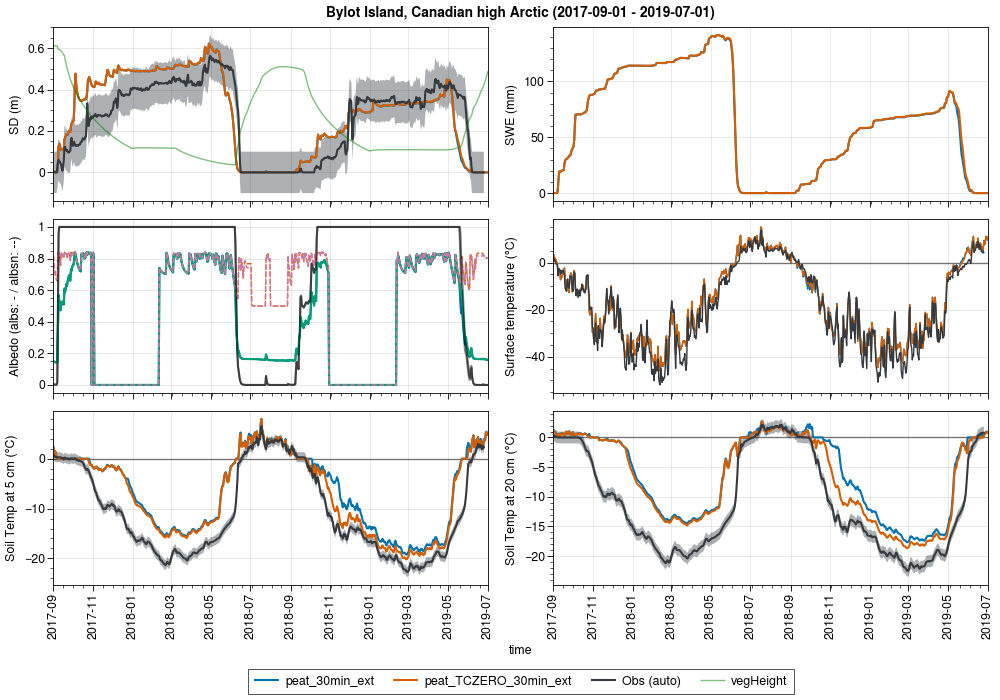

In [8]:
%matplotlib widget
color_obs = 'gray8'
period=slice('2017-09-01', '2019-07-01')

fig, axs = pplt.subplots(nrows=3, ncols=2, refaspect=3.5, sharey=0, figsize=(10,7))

##################
### Snow Depth ###
##################

# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[0].plot(ds_d.snd.sel(time=period), label=label)

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values+0.1, axis=0),
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
axs[0].plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs, label='Obs (auto)')

# Veg
axs[0].plot(ds_d_list[0].vegHeight.sel(time=period), label='vegHeight', color='green', alpha=0.5, lw=1)

fig.legend(loc='b', ncols=5)
axs[0].format(ylabel='SD (m)')

##################
### SWE ###
##################
 # Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[1].plot(ds_d.snw.sel(time=period), label=label)

# Obs
# shadedata = np.concatenate((
#     np.expand_dims(ds_d_eval_menard2019.snw_auto.sel(time=period).values+25, axis=0),
#     np.expand_dims(ds_d_eval_menard2019.snw_auto.sel(time=period).values-25, axis=0),), axis=0)
# axs[1].plot(ds_d_eval_menard2019.snw_auto.sel(time=period), shadedata=shadedata, color=color_obs)
# axs[1].plot(ds_d_eval_menard2019.snw_man.sel(time=period), marker='.', color=color_obs)
axs[1].format(ylabel='SWE (mm)')

##################
### Albedo ###
##################
# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[2].plot(ds_d.albs.sel(time=period), label=label+' (albs)')
    axs[2].plot(ds_d.albsn.sel(time=period), label=label+' (albsn)', ls='--', lw=1)
    axs[2].plot(ds_d.snc.sel(time=period), label=label+' (SCF)', color='k', alpha=0.5)

# Obs
# axs[2].plot(ds_d_eval_menard2019.albs.sel(time=period), marker='.', color=color_obs)
axs[2].format(ylabel='Albedo (albs: - / albsn: --)')

##################
### TS ###
##################
# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[3].plot(ds_d.ts.sel(time=period)-273.15, label=label, lw=1)

# Obs
axs[3].plot(ds_d_obs.ts.sel(time=period), color=color_obs, lw=1)
axs[3].hlines(0, ds_d.ts.sel(time=period).time[0], ds_d.ts.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
axs[3].format(ylabel='Surface temperature (°C)')

##################
### T soil ###
##################
# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[4].plot(ds_d.tsl.sel(time=period, layer=0.05)-273.15, label=label)
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)-1, axis=0),), axis=0)
axs[4].plot(ds_d_obs.tsl.sel(time=period, sdepth=0.05), shadedata=shadedata, color=color_obs)

axs[4].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
axs[4].format(ylabel='Soil Temp at 5 cm (°C)')

# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[5].plot(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest')-273.15, label=label)

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)-1, axis=0),), axis=0)
axs[5].plot(ds_d_obs.tsl.sel(time=period, sdepth=0.15), shadedata=shadedata, color=color_obs)

axs[5].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
axs[5].format(ylabel='Soil Temp at 20 cm (°C)')


fig.suptitle(site_longname + ' ('+period.start+' - '+period.stop+')')
# fig.save('img/run_30min_ext_TCZERO_1996_1997.jpg')

Text(0.5, 0.98, 'Bylot Island, Canadian high Arctic (2017-09-01 - 2019-07-01)')

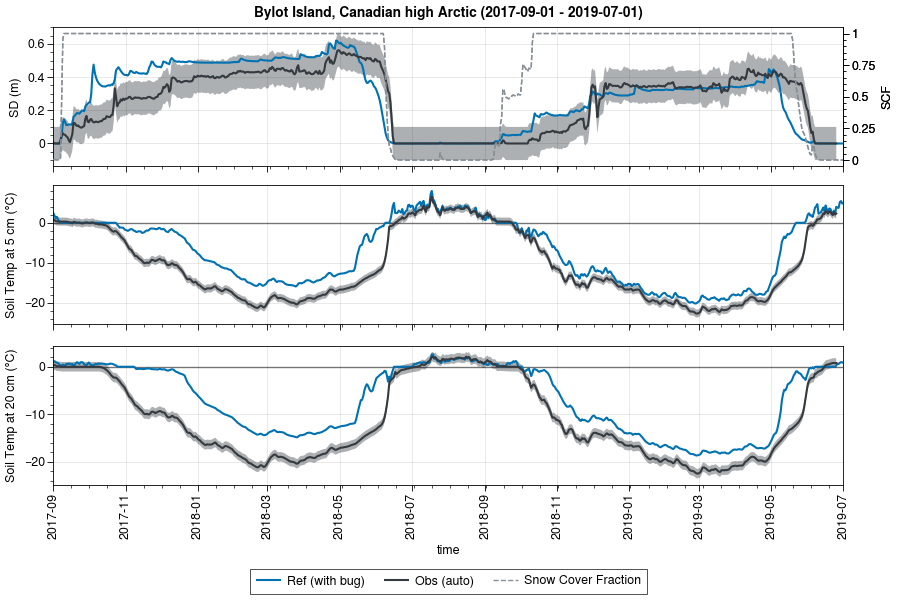

In [718]:
%matplotlib widget
color_obs = 'gray8'
period=slice('2017-09-01', '2019-07-01')

fig, axs = pplt.subplots(nrows=3, ncols=1, refaspect=3.5, sharey=0, figsize=(9,6))

##################
### Snow Depth ###
##################

# Simus
for ds_d, label in zip(ds_d_list, ['Ref (with bug)', 'TCZERO (bug corrected)']):
    axs[0].plot(ds_d.snd.sel(time=period), label=label)
    # axs[0].plot(ds_d.snc.sel(time=period), label=label+' (SCF)', color='k', alpha=0.5)
    
ox = axs[0].alty(label='SCF')
ox.line(ds_d.snc.sel(time=period), label='Snow Cover Fraction', color='grey6', lw=1, ls='--')

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values+0.1, axis=0),
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
axs[0].plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs, label='Obs (auto)')

# Veg
# axs[0].plot(ds_d_list[0].vegHeight.sel(time=period), label='vegHeight', color='green', alpha=0.5, lw=1)

fig.legend(loc='b', ncols=5)
axs[0].format(ylabel='SD (m)')

##################
### T soil ###
##################
# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[1].plot(ds_d.tsl.sel(time=period, layer=0.05)-273.15, label=label)
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)-1, axis=0),), axis=0)
axs[1].plot(ds_d_obs.tsl.sel(time=period, sdepth=0.05), shadedata=shadedata, color=color_obs)

axs[1].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
axs[1].format(ylabel='Soil Temp at 5 cm (°C)')

# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[2].plot(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest')-273.15, label=label)

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)-1, axis=0),), axis=0)
axs[2].plot(ds_d_obs.tsl.sel(time=period, sdepth=0.15), shadedata=shadedata, color=color_obs)

axs[2].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
axs[2].format(ylabel='Soil Temp at 20 cm (°C)')


fig.suptitle(site_longname + ' ('+period.start+' - '+period.stop+')')
# fig.save('img/run_30min_ext_TCZERO_1996_1997_CLASSIC_issue_gitlab.jpg')

## Carbon

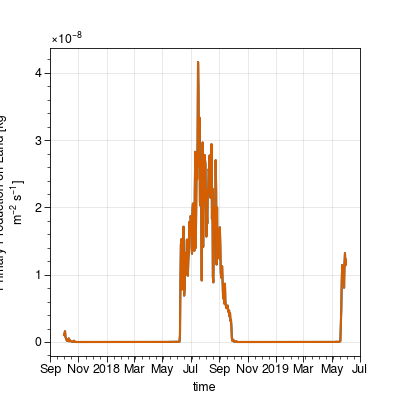

In [759]:
%matplotlib widget
period=slice('2017-10-01', '2019-06-01')

ds_d_list[0].gpp.sel(time=period).plot()
ds_d_list[0].gpp.sel(time=period).plot()

In [39]:
ds_hh_list[0].gflx

<xarray.DataArray 'gflx' (time: 35040)> Size: 280kB
array([-11.96314257, -11.66188451, -11.16265734, ...,          nan,
                nan,          nan])
Coordinates:
  * time     (time) datetime64[ns] 280kB 2013-01-01 ... 2014-12-31T23:30:00
Attributes:
    long_name:   Heat conduction between soil layers
    units:       W m$^{-2}$
    nameInCode:  gflx_hh

In [42]:
ds_hh_list[0]

<xarray.Dataset> Size: 36MB
Dimensions:     (time: 35040, layer: 20)
Coordinates:
  * time        (time) datetime64[ns] 280kB 2013-01-01 ... 2014-12-31T23:30:00
  * layer       (layer) int16 40B 1 2 3 4 5 6 7 8 9 ... 13 14 15 16 17 18 19 20
Data variables: (12/52)
    longitude   float64 8B -80.0
    latitude    float64 8B 73.15
    albs        (time) float64 280kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    cdh         (time) float64 280kB 0.005613 0.003501 ... 0.00393 0.003694
    cdm         (time) float64 280kB 0.005355 0.003653 ... 0.004011 0.003815
    evspsblsoi  (time) float64 280kB 2.6e-06 1.166e-07 ... 1.713e-07 1.229e-07
    ...          ...
    tsgs        (time) float64 280kB 248.2 235.2 235.2 ... 235.3 235.3 235.3
    tsl         (time, layer) float64 6MB 259.6 261.1 261.4 ... 266.8 266.8
    tsn         (time) float64 280kB -16.68 -16.78 -16.87 ... -17.02 -17.03
    uvas        (time) float64 280kB 0.134 0.105 0.076 ... 0.117 0.064 0.0465
    wsnw        (time) float64 280kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    zpond       (time) float64 280kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
Attributes:
    title:        CLASSIC output file
    timestamp:    20240226 1055
    Conventions:  COARDS
    node_offset:  1
    Comment:       run_peat_30min_ext (spinfast=1)

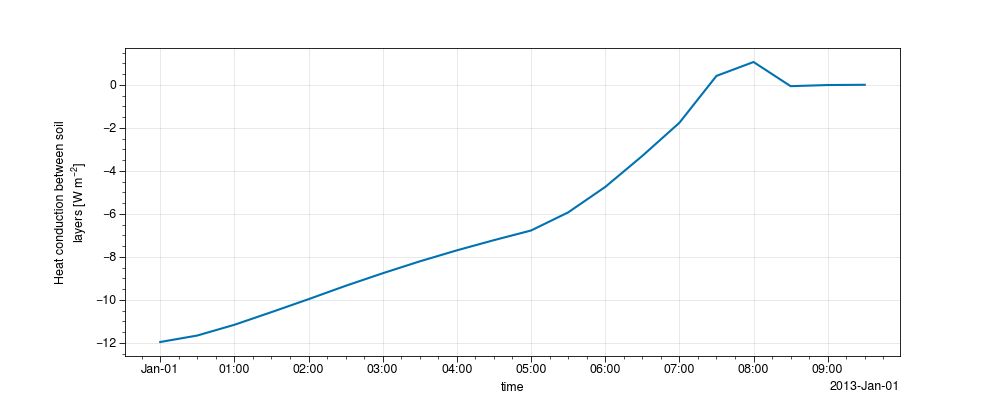

In [41]:
%matplotlib widget
# period=slice('2017-10-01', '2019-06-01')
plt.figure(figsize=(10, 4))
ds_hh_list[0].gflx.plot()

In [36]:
ds_hh_list[0]

<xarray.Dataset> Size: 36MB
Dimensions:     (time: 35040, layer: 20)
Coordinates:
  * time        (time) datetime64[ns] 280kB 2013-01-01 ... 2014-12-31T23:30:00
  * layer       (layer) int16 40B 1 2 3 4 5 6 7 8 9 ... 13 14 15 16 17 18 19 20
Data variables: (12/52)
    longitude   float64 8B -80.0
    latitude    float64 8B 73.15
    albs        (time) float64 280kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    cdh         (time) float64 280kB 0.005613 0.003501 ... 0.00393 0.003694
    cdm         (time) float64 280kB 0.005355 0.003653 ... 0.004011 0.003815
    evspsblsoi  (time) float64 280kB 2.6e-06 1.166e-07 ... 1.713e-07 1.229e-07
    ...          ...
    tsgs        (time) float64 280kB 248.2 235.2 235.2 ... 235.3 235.3 235.3
    tsl         (time, layer) float64 6MB 259.6 261.1 261.4 ... 266.8 266.8
    tsn         (time) float64 280kB -16.68 -16.78 -16.87 ... -17.02 -17.03
    uvas        (time) float64 280kB 0.134 0.105 0.076 ... 0.117 0.064 0.0465
    wsnw        (time) float64 280kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    zpond       (time) float64 280kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
Attributes:
    title:        CLASSIC output file
    timestamp:    20240226 1055
    Conventions:  COARDS
    node_offset:  1
    Comment:       run_peat_30min_ext (spinfast=1)